## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "scale_robust_14"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [5]:
override = True
use_preds = False
save = True
show = True
scaler_name = "robust"

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from MIST_reclassified_iso_full_data.csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


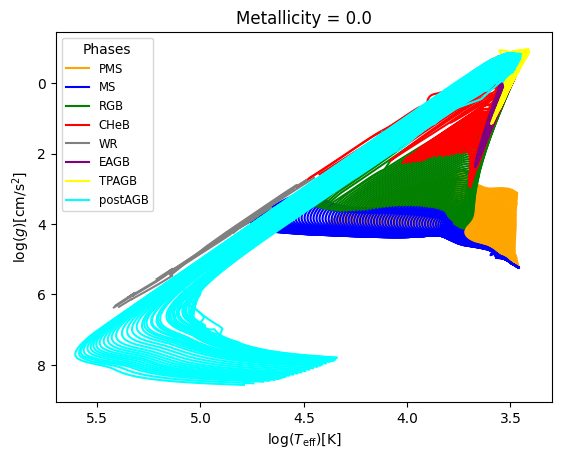

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.00,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.00,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.00,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.05,4.482577,4.350883,0.0,-0.25,12.925175,0.596074
4,5.05,4.485667,4.349692,0.0,-0.25,13.105490,0.600130
...,...,...,...,...,...,...,...
519286,10.30,3.602322,1.827453,3.0,0.50,0.866616,1.274247
519287,10.30,3.600999,1.809405,3.0,0.50,0.866614,1.283270
519288,10.30,3.599710,1.791489,3.0,0.50,0.866612,1.292228
519289,10.30,3.598418,1.773621,3.0,0.50,0.866610,1.301161


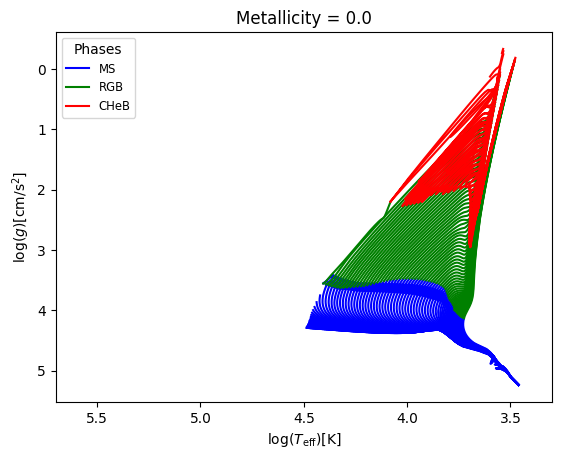

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3], 'star_mass':('<', 14)})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_all_uniques(phase_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.4629, Median : 8.5

log_Teff  : Range : 3.34 - 4.6345, Mean : 3.9346, Median : 3.8644

log_g  : Range : -1.08 - 5.4331, Mean : 3.5485, Median : 3.9492

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 13.9995, Mean : 3.398, Median : 2.0471

log_R  : Range : -1.0 - 3.0828, Mean : 0.6067, Median : 0.5386



In [9]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 4.634489491902143
Median value in train data for the log_Teff parameter: 3.8641118622993966
Mean value in train data for the log_Teff parameter: 3.9345581069095505

Range in train data for the log_g parameter : -1.0828963170617296 - 5.433094523832443
Median value in train data for the log_g parameter: 3.9484790508590737
Mean value in train data for the log_g parameter: 3.548006174763417

Range in train data for the log_R parameter : -0.9974747647513328 - 3.082068881511837
Median value in train data for the log_R parameter: 0.5381900688843242
Mean value in train data for the log_R parameter: 0.6069651248403705

Testing set statistics:
Range in test data for the log_Teff parameter : 3.344711147414537 - 4.633956017110521
Median value in test data for the log_Teff parameter: 3.865317881638998
Mean value in test data for the log_Teff parameter: 3.9346904482232112

Range in test data for the log_g p

## Model training

### Linear regression

In [10]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.7470393633147334
  RMSE :  0.15761081054254913
  MAE :  0.13580161922594425
  MedAE :  0.13978939113470723
  CORR :  0.8653632874170338
  MAX_ER :  0.7683201622530214
  Percentiles : 
    75th percentile :  0.19273889185860815
    90th percentile :  0.23076871650669856
    95th percentile :  0.24862071570337707
    99th percentile :  0.33349199100320265

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.6781453648754623
  RMSE :  0.14257958157255657
  MAE :  0.10823384825290416
  MedAE :  0.08910971836587467
  CORR :  0.8251398762758947
  MAX_ER :  0.7251774774019202
  Percentiles : 
    75th percentile :  0.14465574145614724
    90th percentile :  0.20896386442023546
 

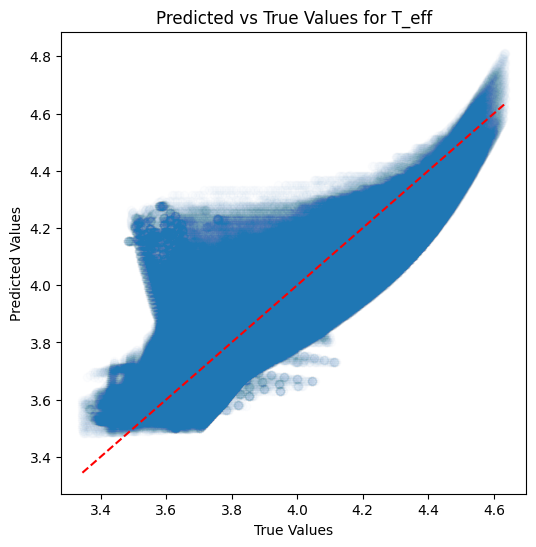

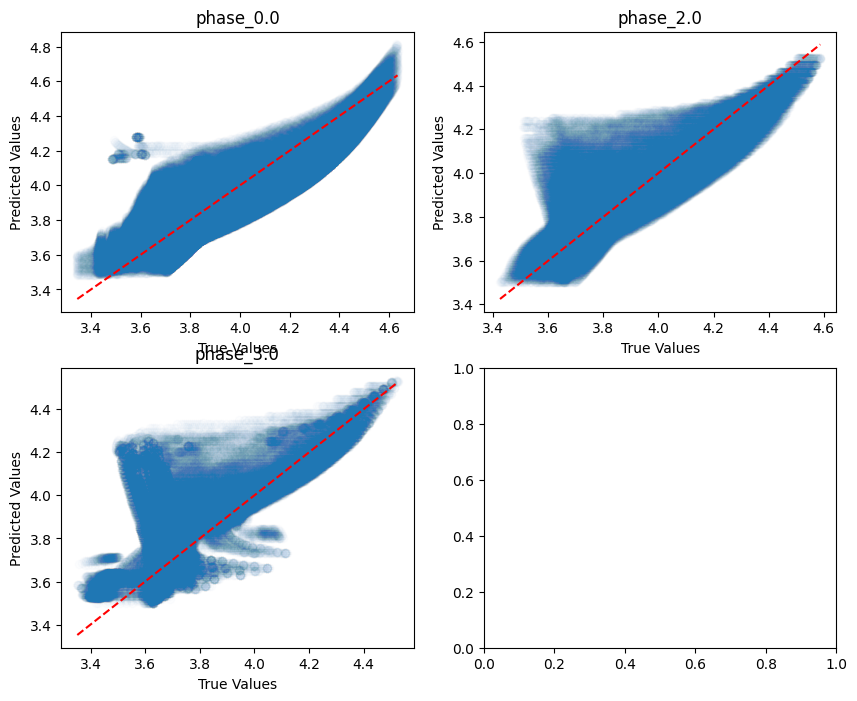

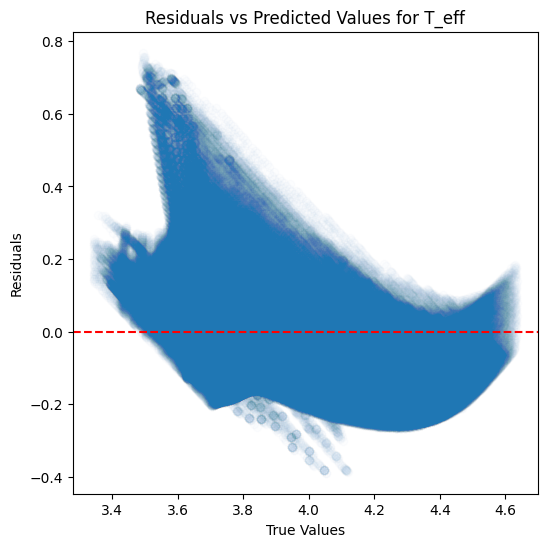

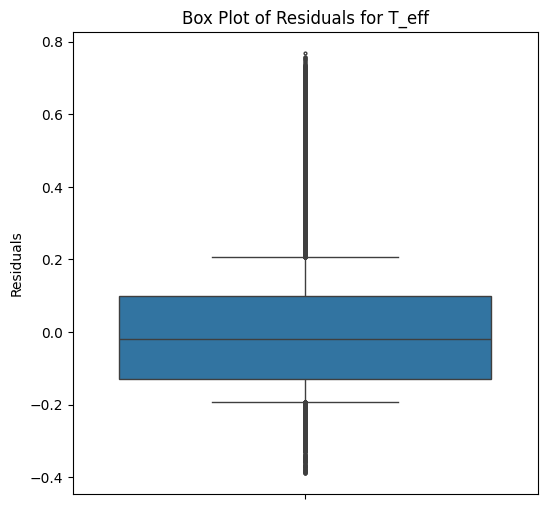

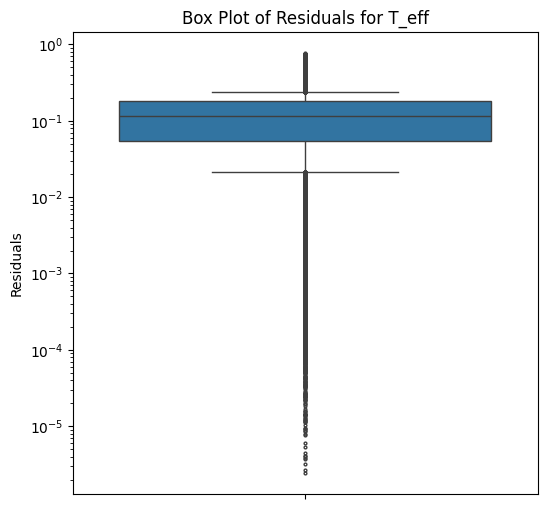

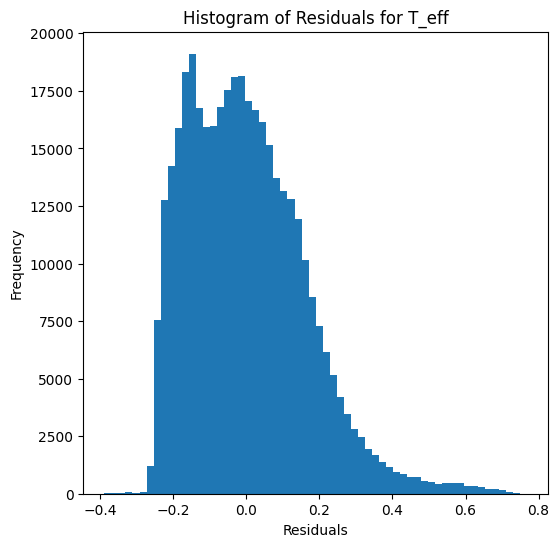

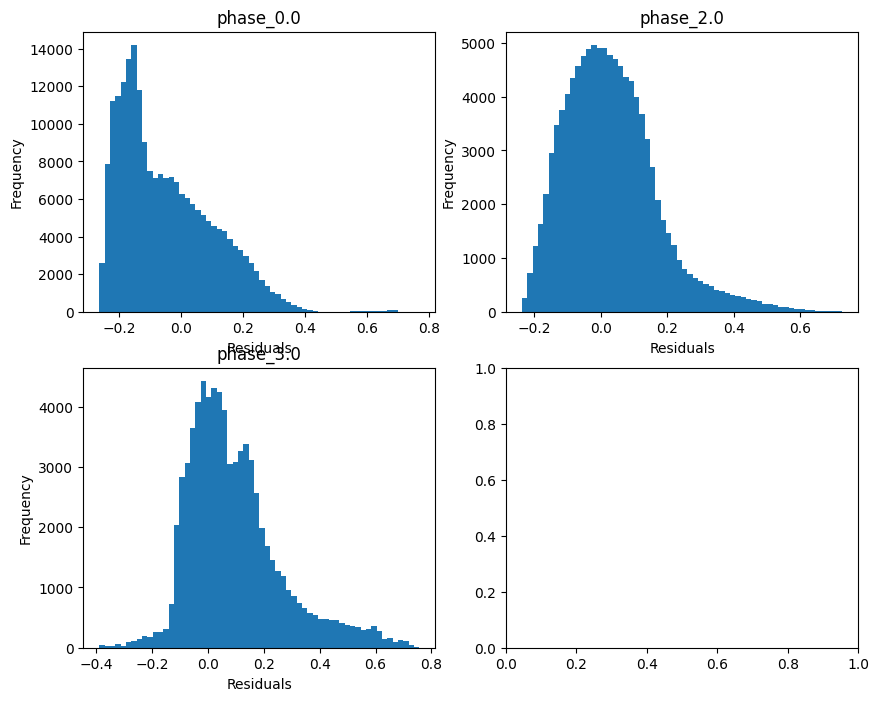

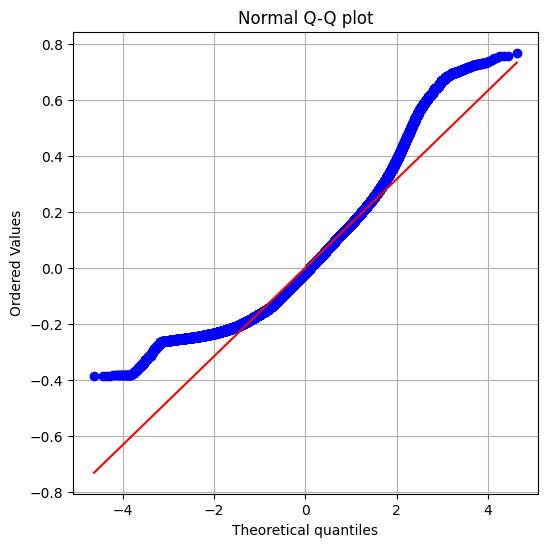

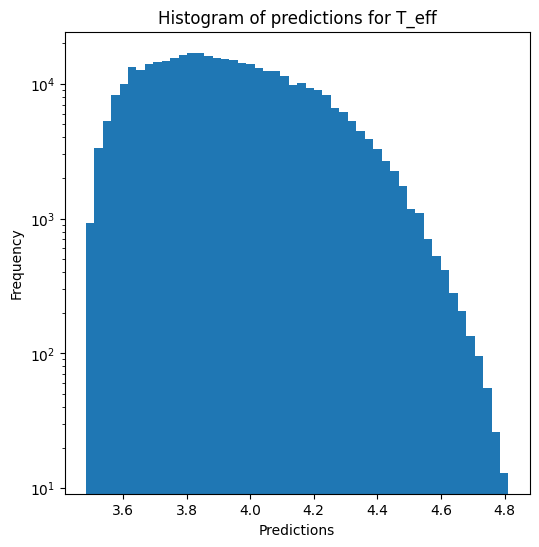

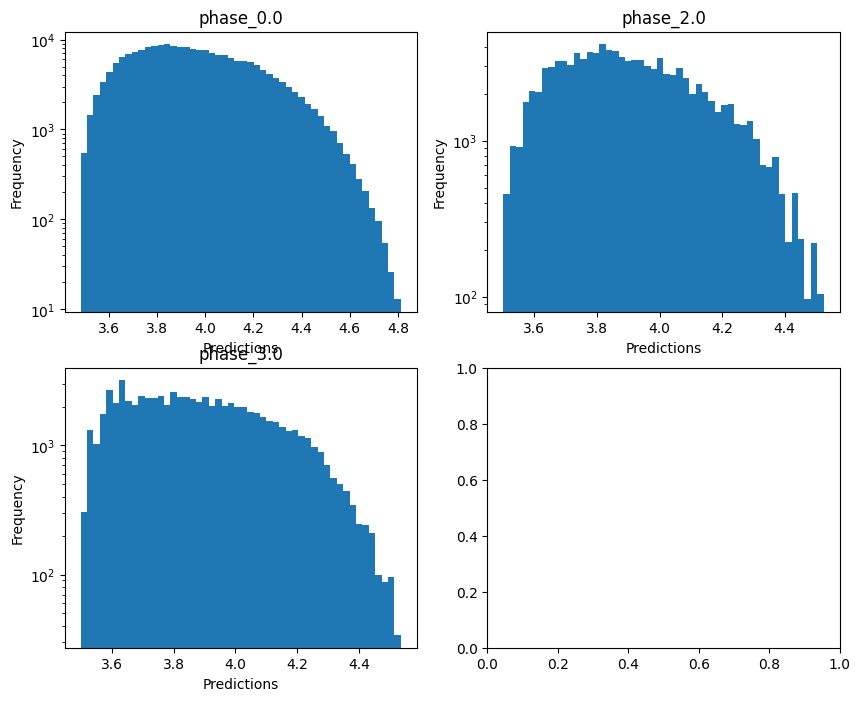

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -0.8445653587464714
  RMSE :  0.9286347190736698
  MAE :  0.7655351567908034
  MedAE :  0.6407871161162202
  CORR :  0.45563954743444146
  MAX_ER :  3.1294577680894826
  Percentiles : 
    75th percentile :  1.0952907627301927
    90th percentile :  1.571793091151821
    95th percentile :  1.7891097102966975
    99th percentile :  2.1271342021582633

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.11325394232664765
  RMSE :  1.053791841121898
  MAE :  0.8311594809038089
  MedAE :  0.6798993474798016
  CORR :  0.3675105535969004
  MAX_ER :  2.7626946775419836
  Percentiles : 
    75th percentile :  1.2504419314987243
    90th percentile :  1.805983795743486
    95th percentile :  2.12678207345294
    99th percentile :  2.5281605437180756

log_g results for the phase cat

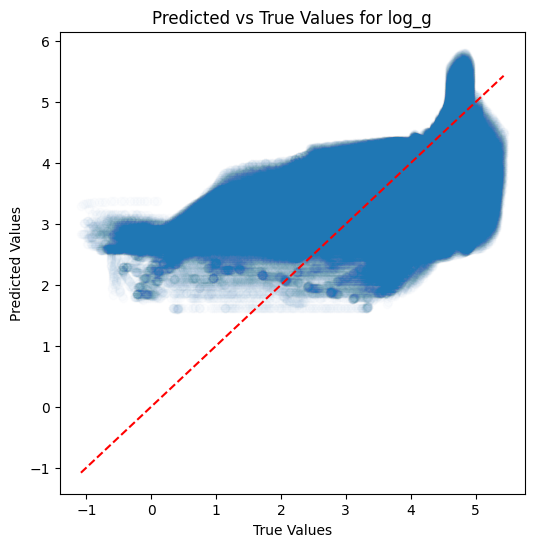

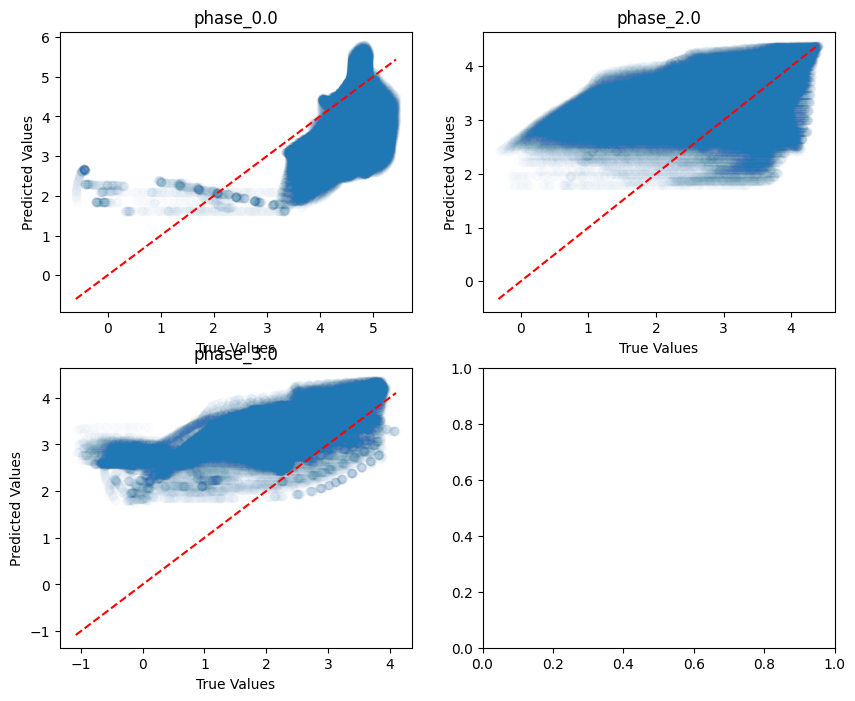

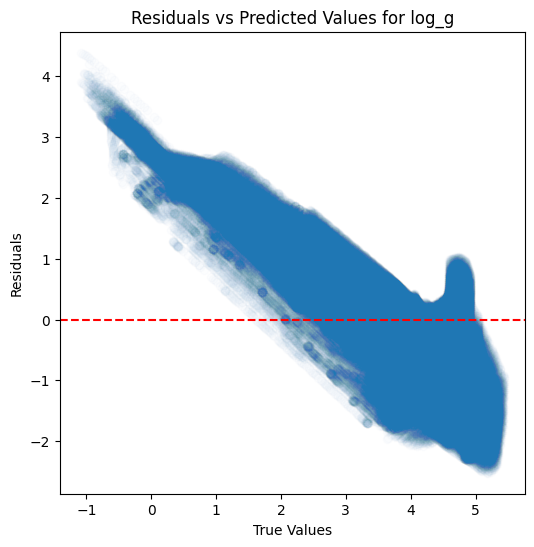

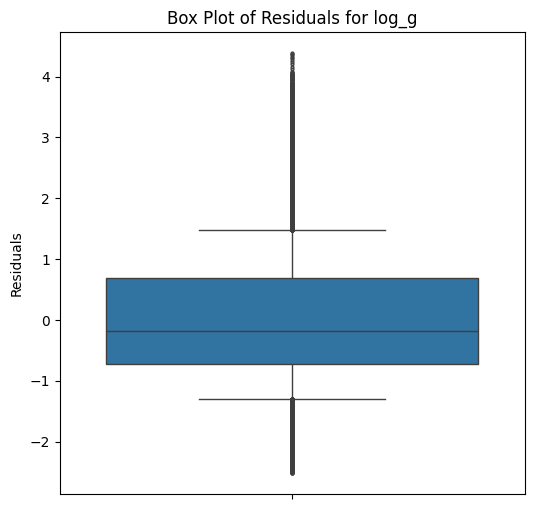

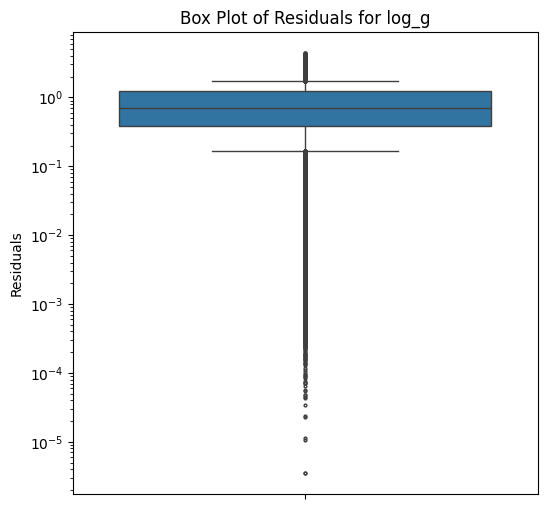

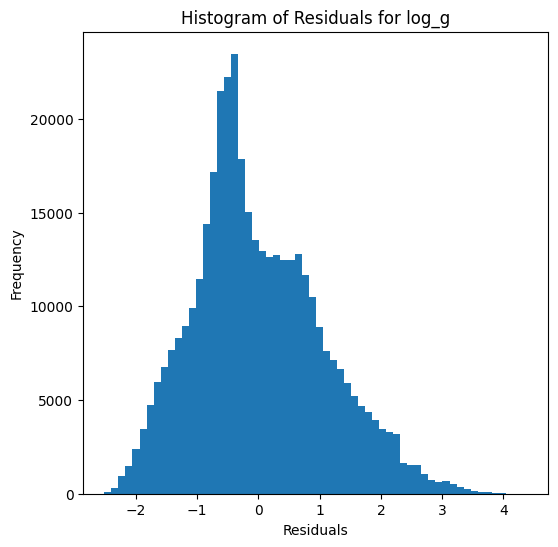

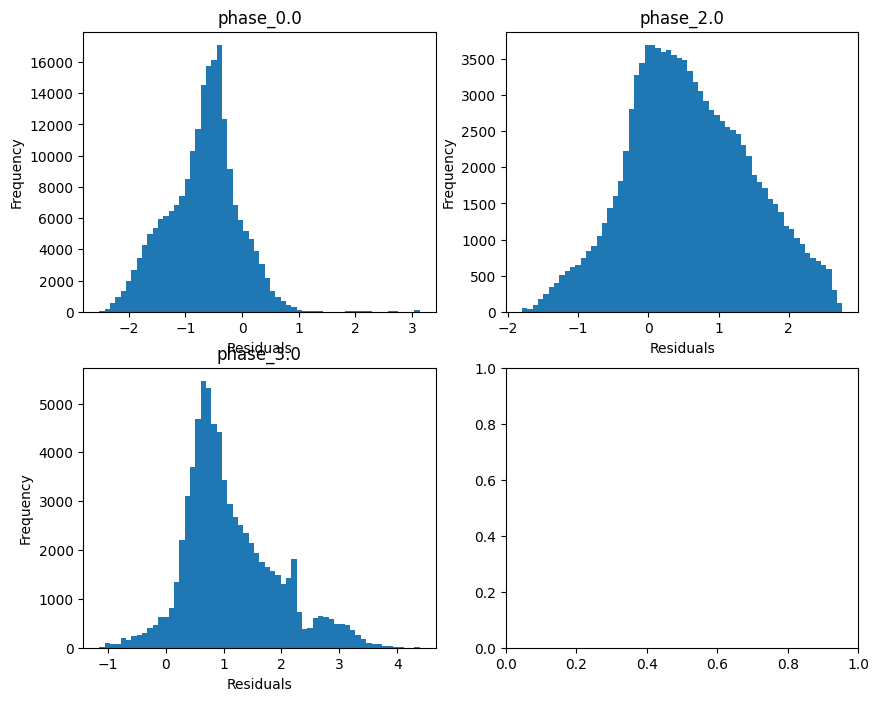

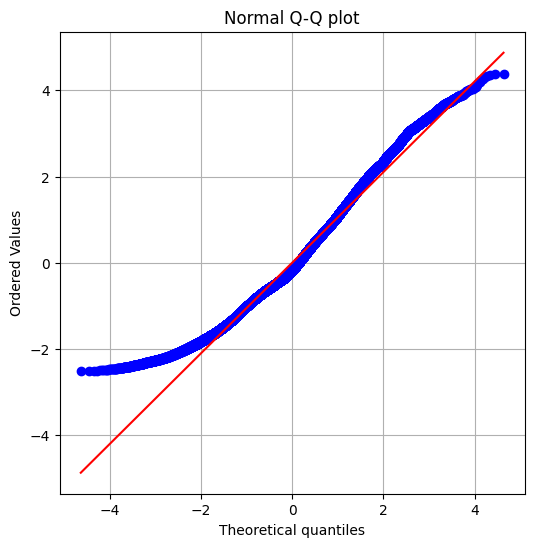

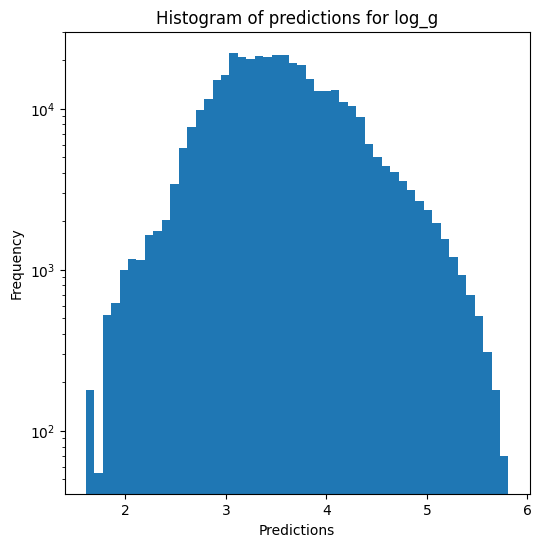

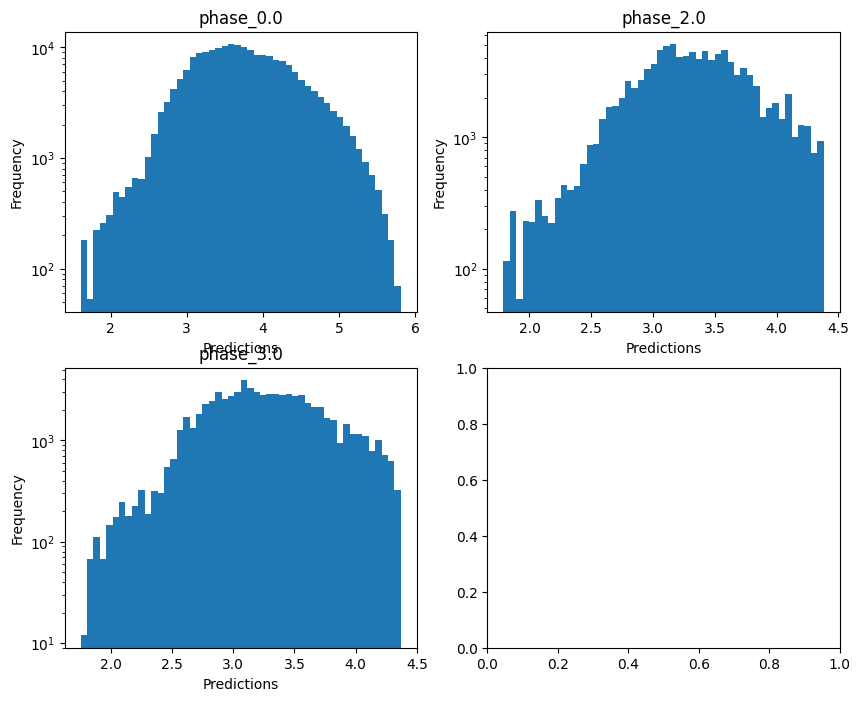


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.22469211359168006
  RMSE :  0.5339917638556836
  MAE :  0.41479074387512305
  MedAE :  0.3093117031781135
  CORR :  0.5947013137402051
  MAX_ER :  1.6784285207592182
  Percentiles : 
    75th percentile :  0.6287803648355231
    90th percentile :  0.9266574756383286
    95th percentile :  1.0840663041171068
    99th percentile :  1.3445139919488187

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.05996100986214736
  RMSE :  0.5647528895901354
  MAE :  0.45569229987351073
  MedAE :  0.3911693258184498
  CORR :  0.4195772079058485
  MAX_ER :  1.4086579713852785
  Percentiles : 
    75th percentile :  0.6853303345470951
    90th percentile :  0.9499009872920888
    95th percentile :  1.0988162621598208
    99th percentile :  1.2904790596903644

radius results for the phase category with 

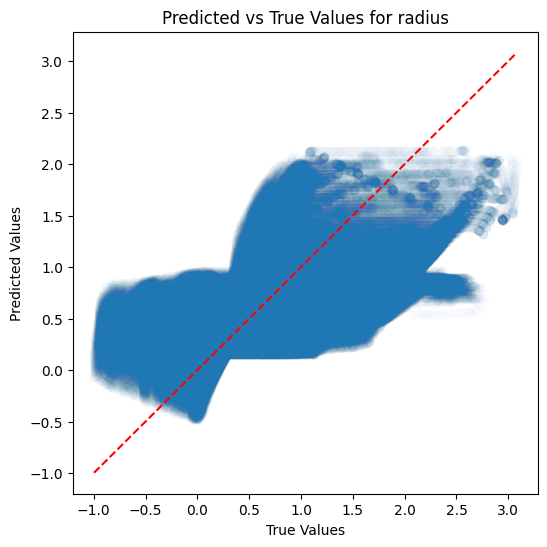

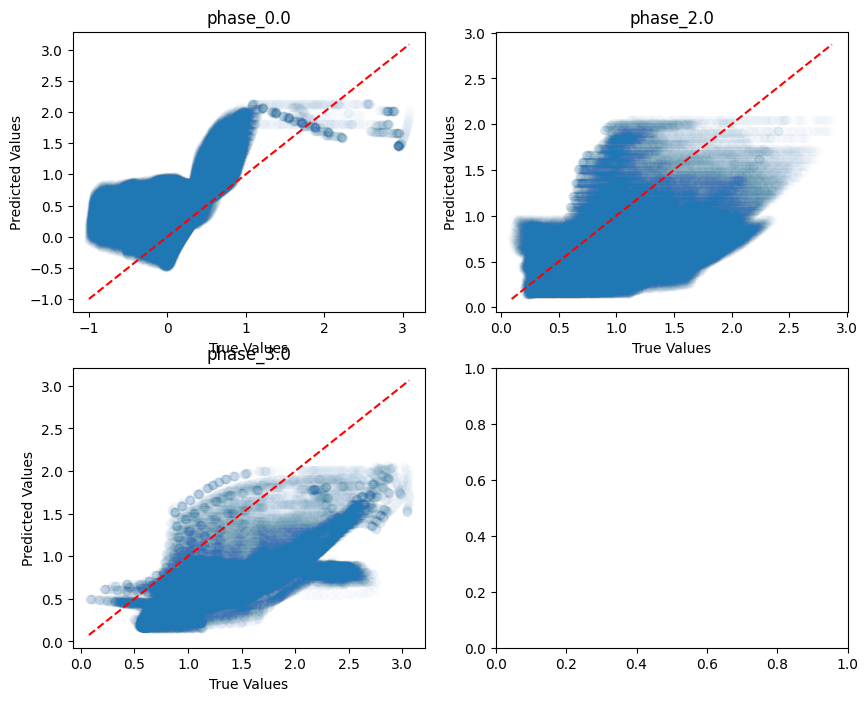

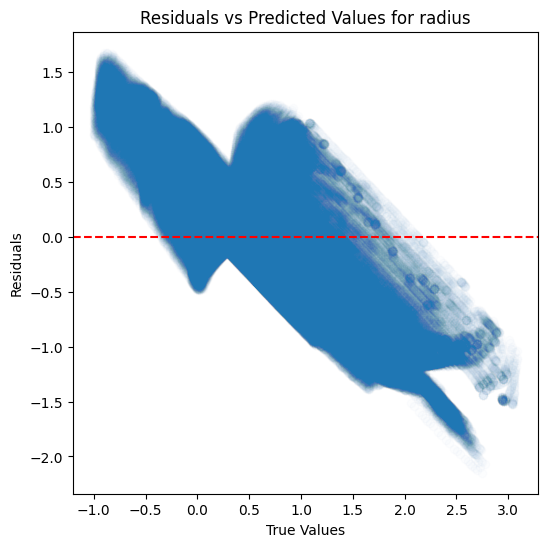

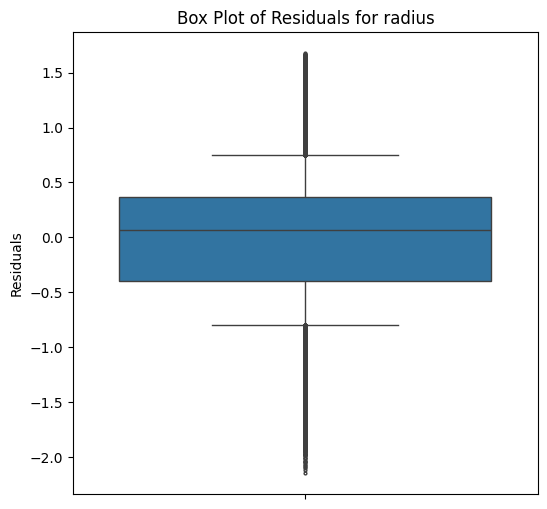

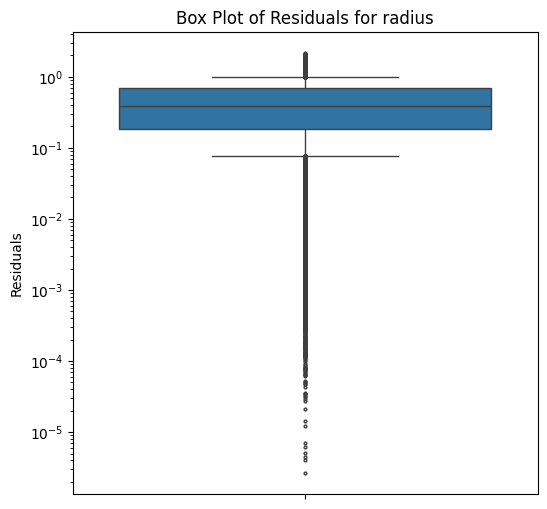

...

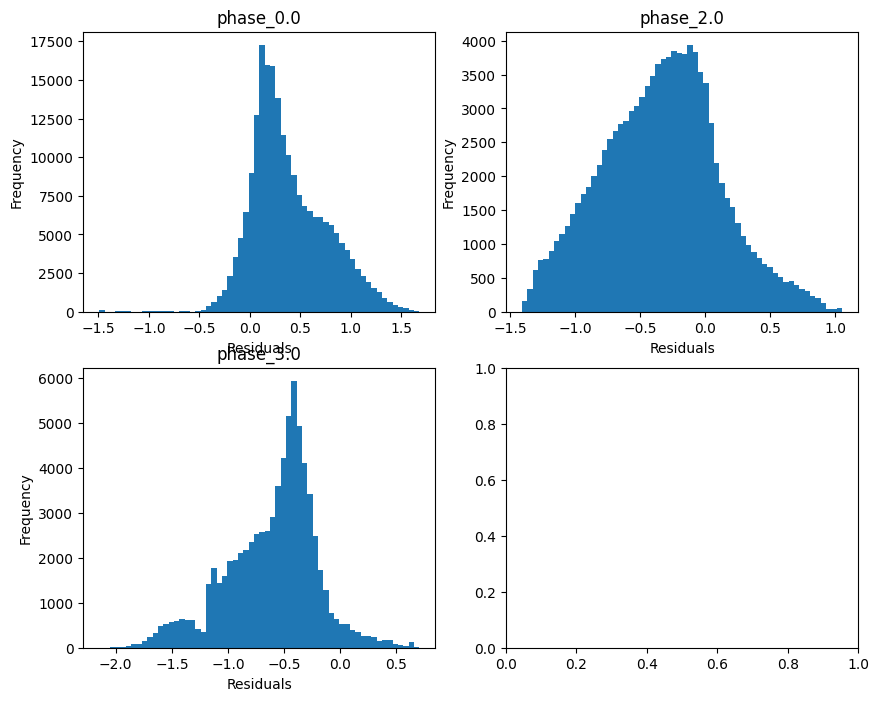

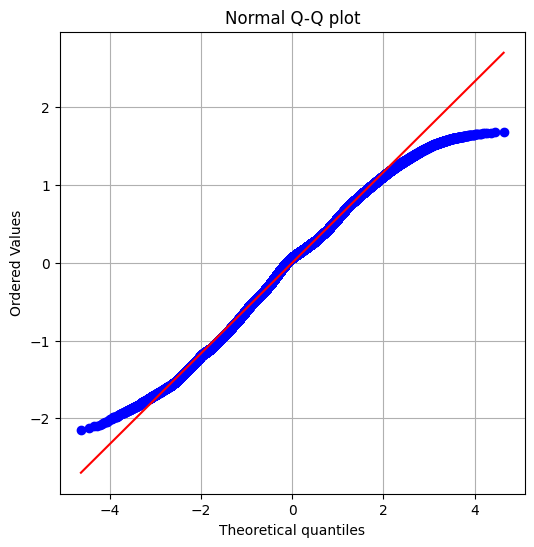

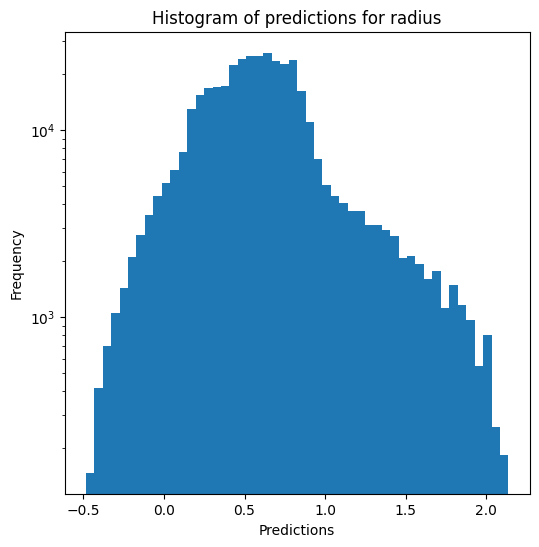

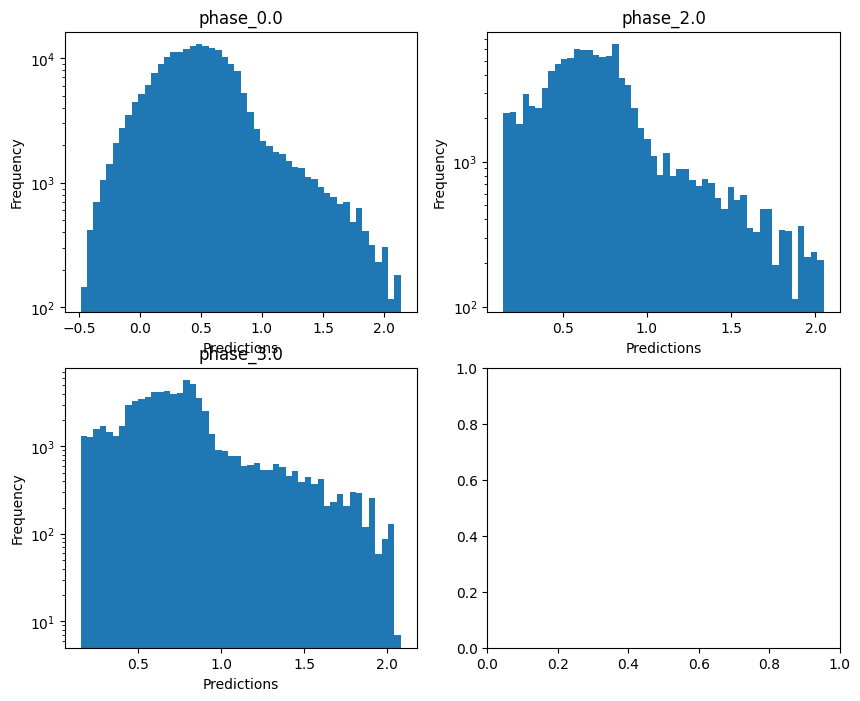

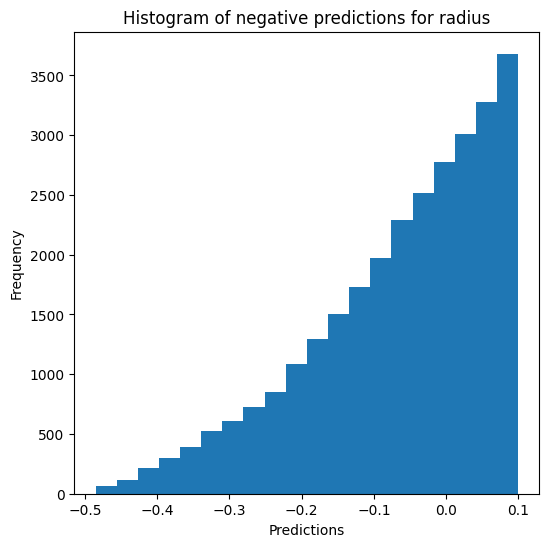

Saving predictions and results...


In [11]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name) #, override=False, use_preds=True

### Decision tree

In [12]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9710269118161896
  RMSE :  0.05088429674027279
  MAE :  0.007015469012231072
  MedAE :  0.0010131840112954649
  CORR :  0.9857175212538922
  MAX_ER :  0.9170521162841481
  Percentiles : 
    75th percentile :  0.0022164832660429568
    90th percentile :  0.003978266571926794
    95th percentile :  0.007265116544578621
    99th percentile :  0.19504216595002946

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9292335478646648
  RMSE :  0.06534753683028635
  MAE :  0.02667822053791996
  MedAE :  0.0037017581030633906
  CORR :  0.9643447025837024
  MAX_ER :  0.8297717313302497
  Percentiles : 
    75th percentile :  0.014432785222361577
    90th percentile :  0.093671513

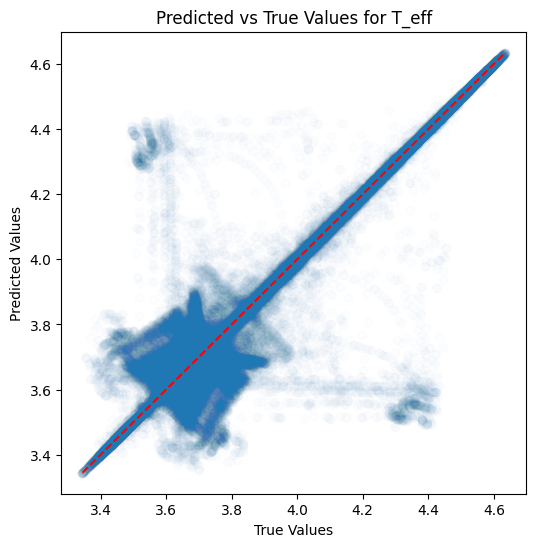

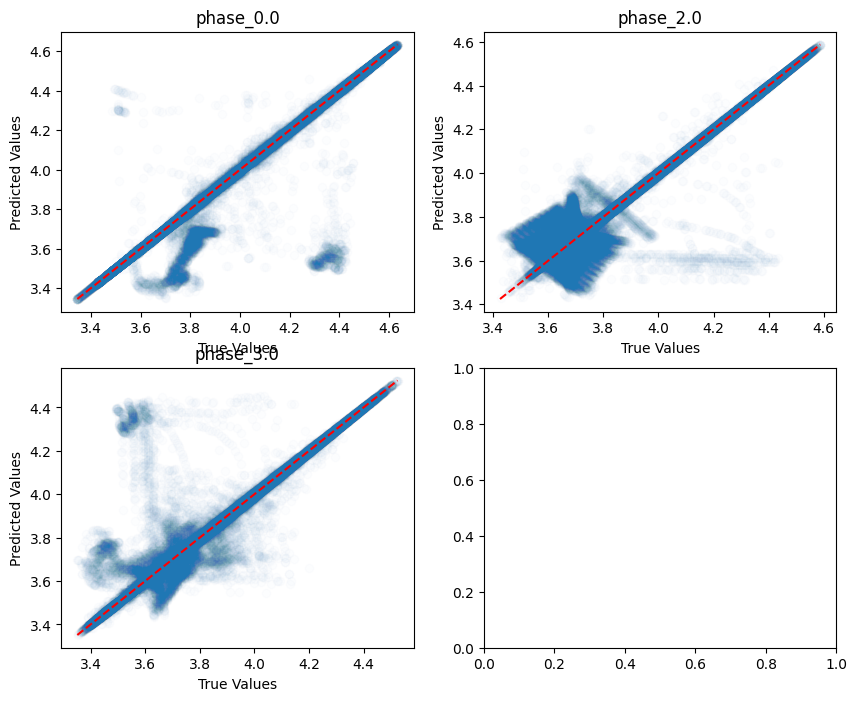

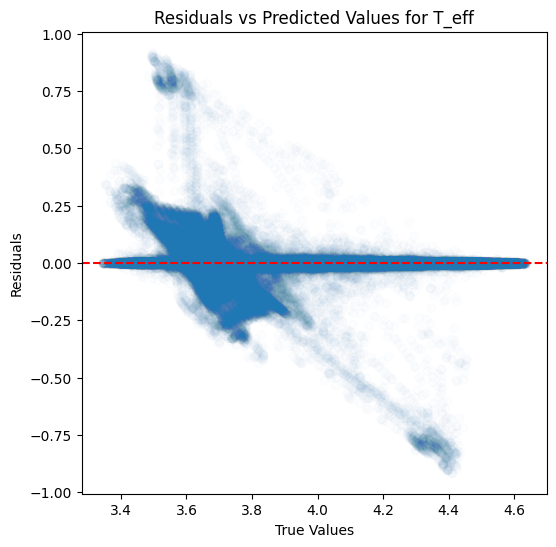

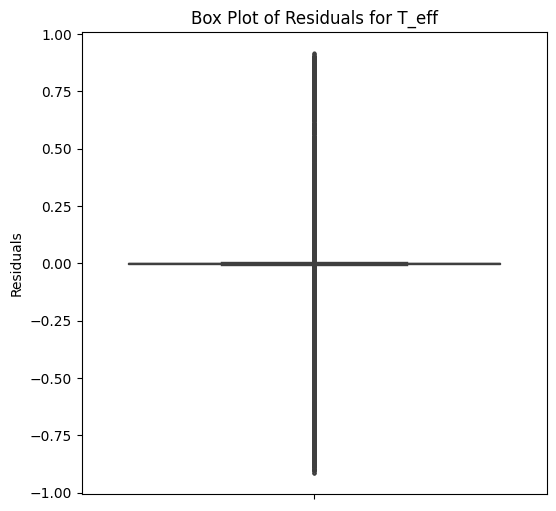

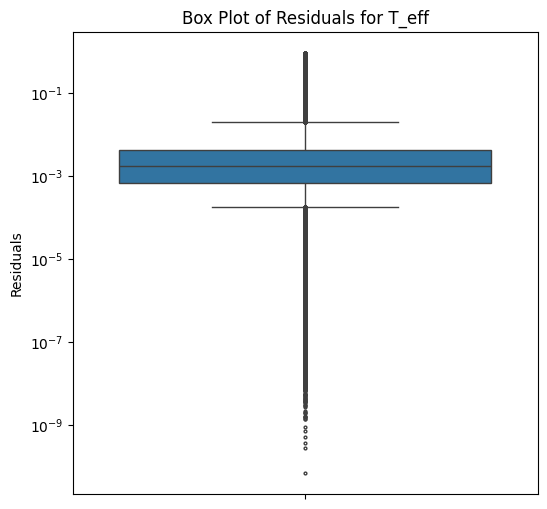

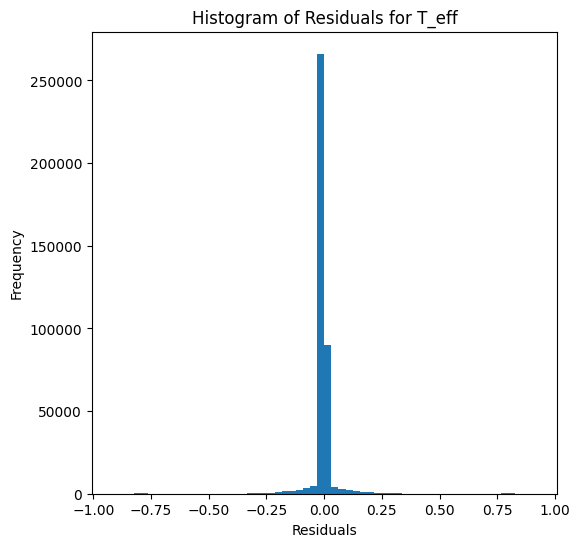

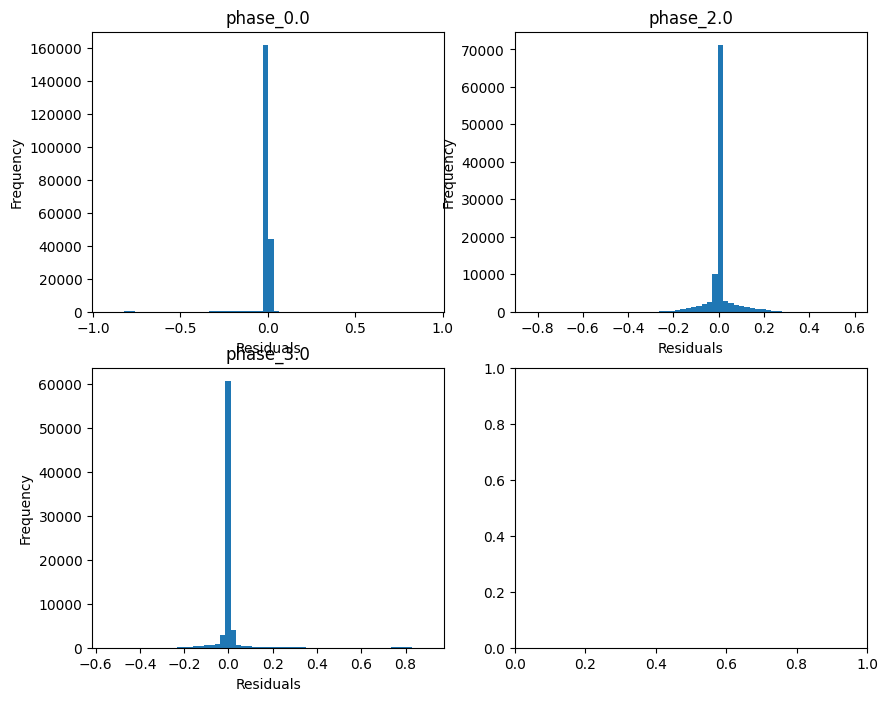

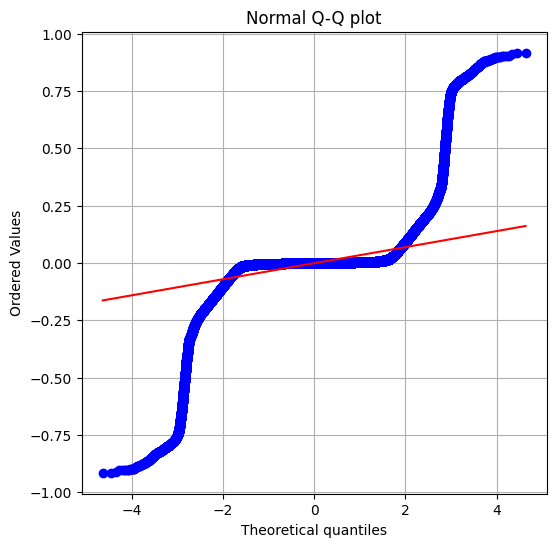

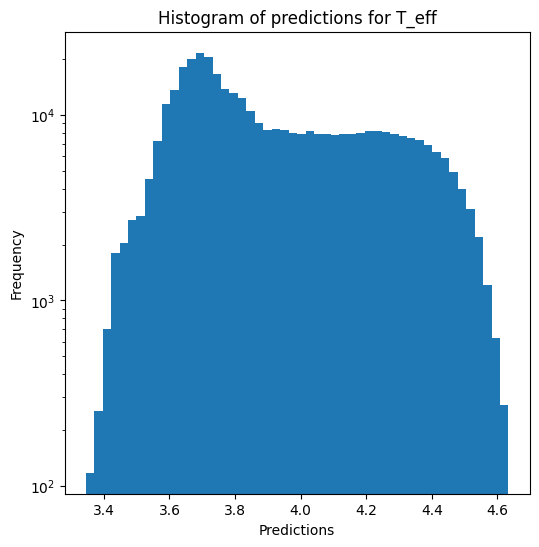

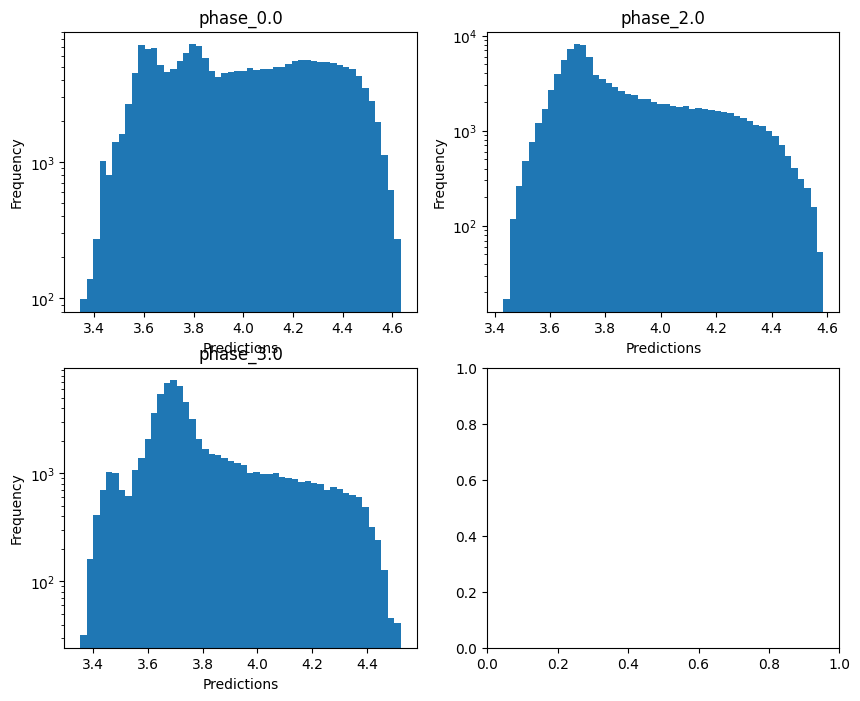


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.05532791378154367
  RMSE :  0.446020441061346
  MAE :  0.05983601965511997
  MedAE :  0.0036257606385232677
  CORR :  0.739019826902873
  MAX_ER :  5.693303843114662
  Percentiles : 
    75th percentile :  0.00720314978355141
    90th percentile :  0.012537342834404445
    95th percentile :  0.021204686958530214
    99th percentile :  3.1800497449561247

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  -0.03352396129259594
  RMSE :  0.9433187439739379
  MAE :  0.4188428482703968
  MedAE :  0.01827751800033428
  CORR :  0.4804527514222436
  MAX_ER :  4.637418133429539
  Percentiles : 
    75th percentile :  0.2436427425100774
    90th percentile :  1.7521170711401313
    95th percentile :  2.5224558138137096
    99th percentile :  3.5400562238080457

log_g results for the phase category wi

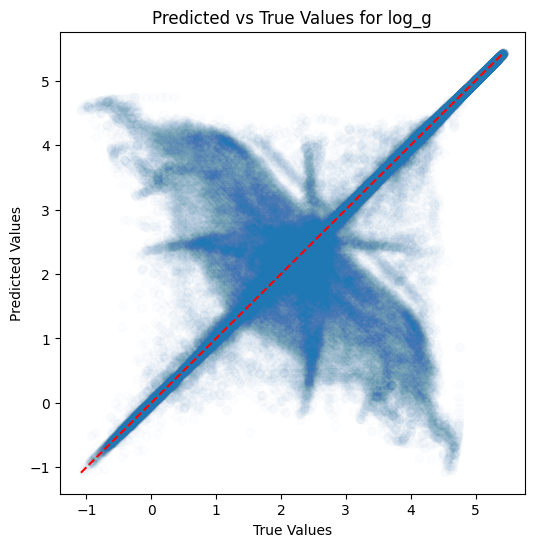

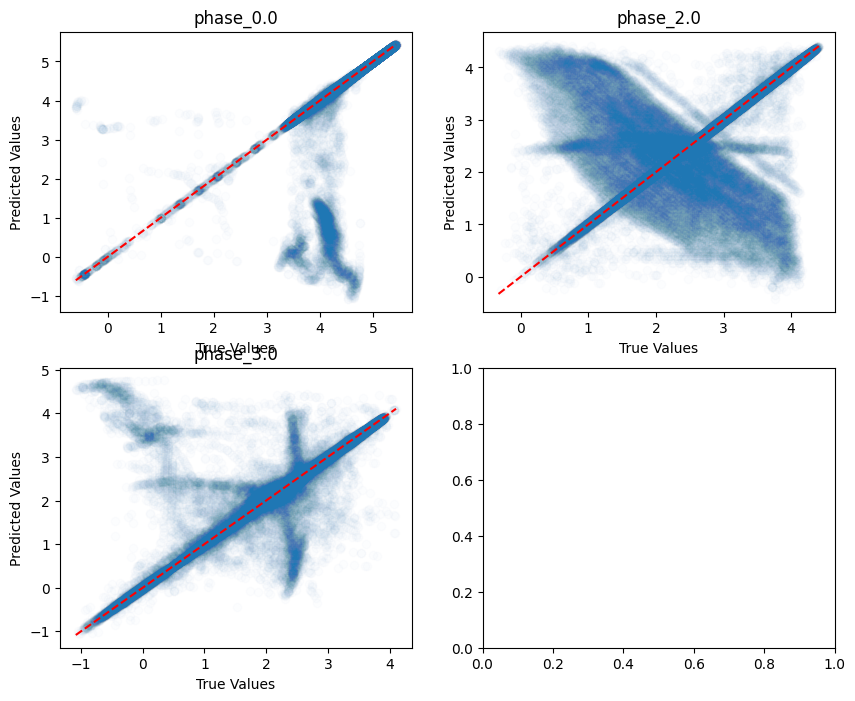

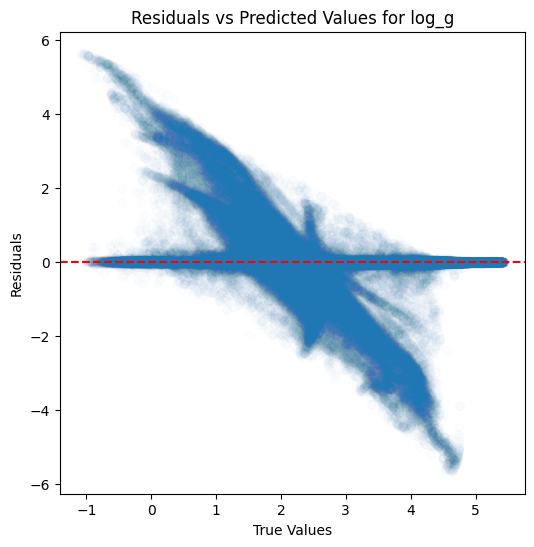

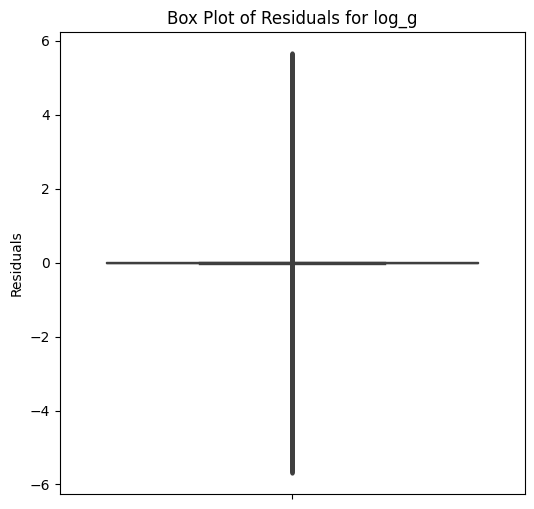

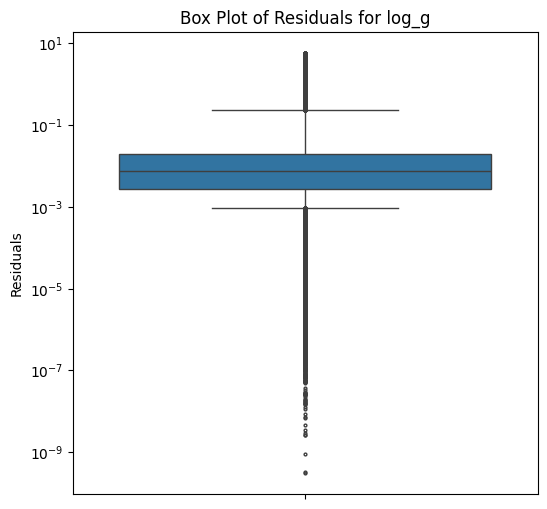

...

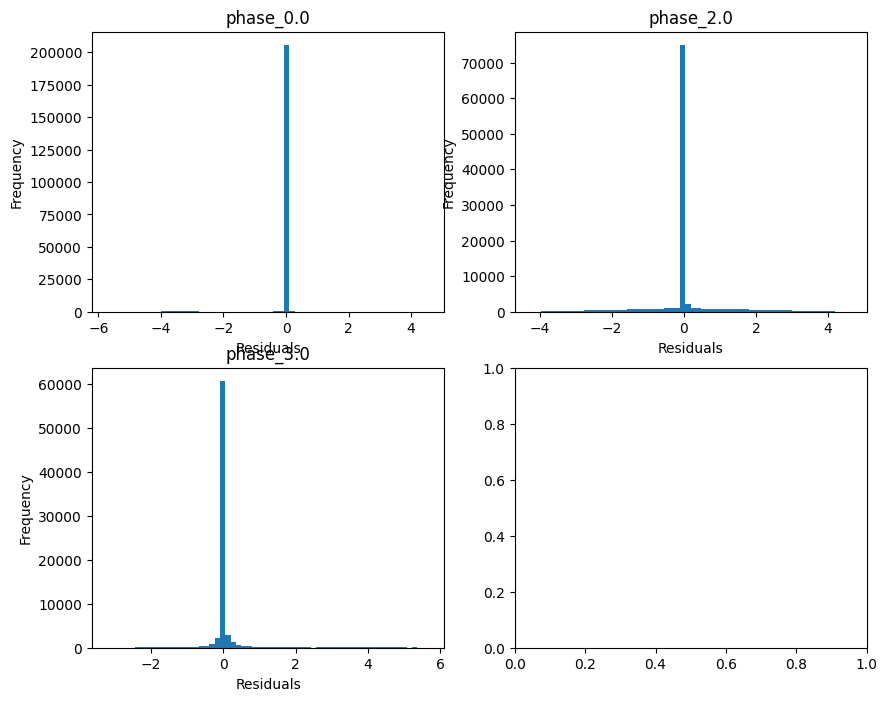

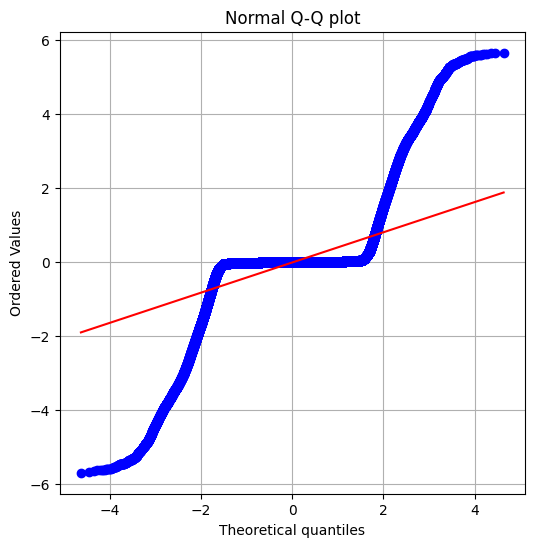

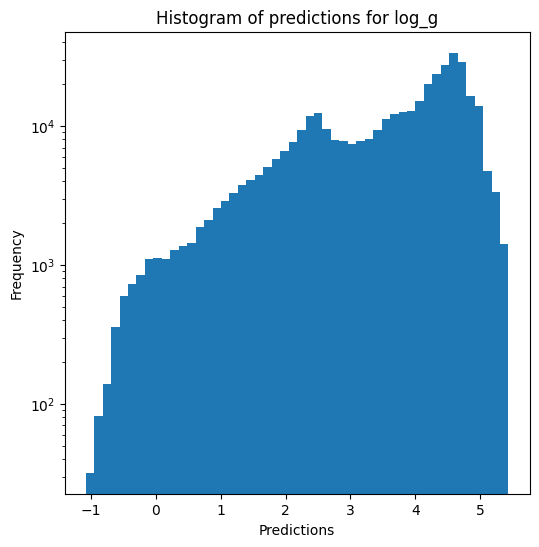

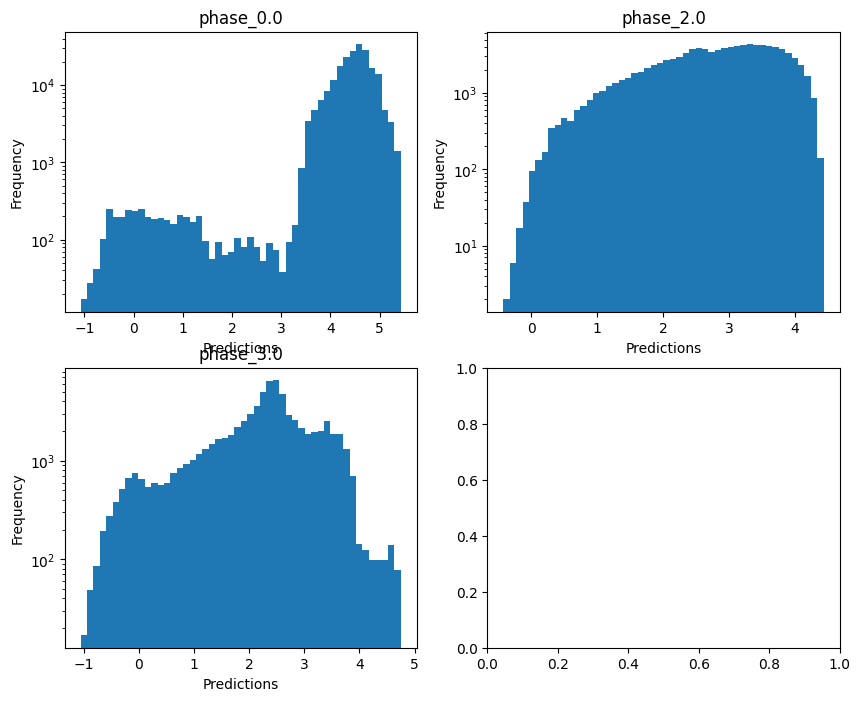

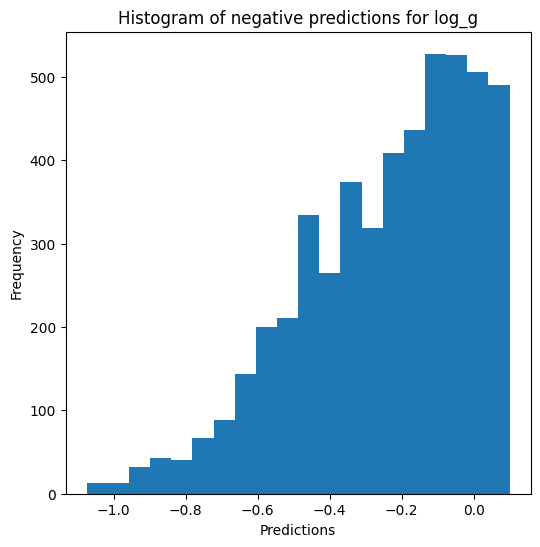


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.7234439980018254
  RMSE :  0.22303794165929736
  MAE :  0.03062214364223951
  MedAE :  0.0024790554825638994
  CORR :  0.8871102113828102
  MAX_ER :  2.84673517851732
  Percentiles : 
    75th percentile :  0.004654392250014128
    90th percentile :  0.007950309230535569
    95th percentile :  0.012253799689428427
    99th percentile :  1.589745185390239

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  -0.02693616611640537
  RMSE :  0.4716486743908829
  MAE :  0.20942785327664248
  MedAE :  0.009153365901488242
  CORR :  0.49877906461044075
  MAX_ER :  2.3190299467163435
  Percentiles : 
    75th percentile :  0.12167739314884063
    90th percentile :  0.8760676454955882
    95th percentile :  1.2611995050626743
    99th percentile :  1.7702151044637586

radius results for the phase cat

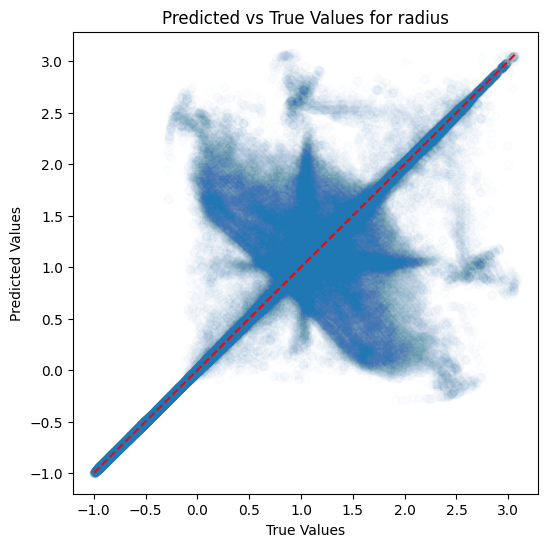

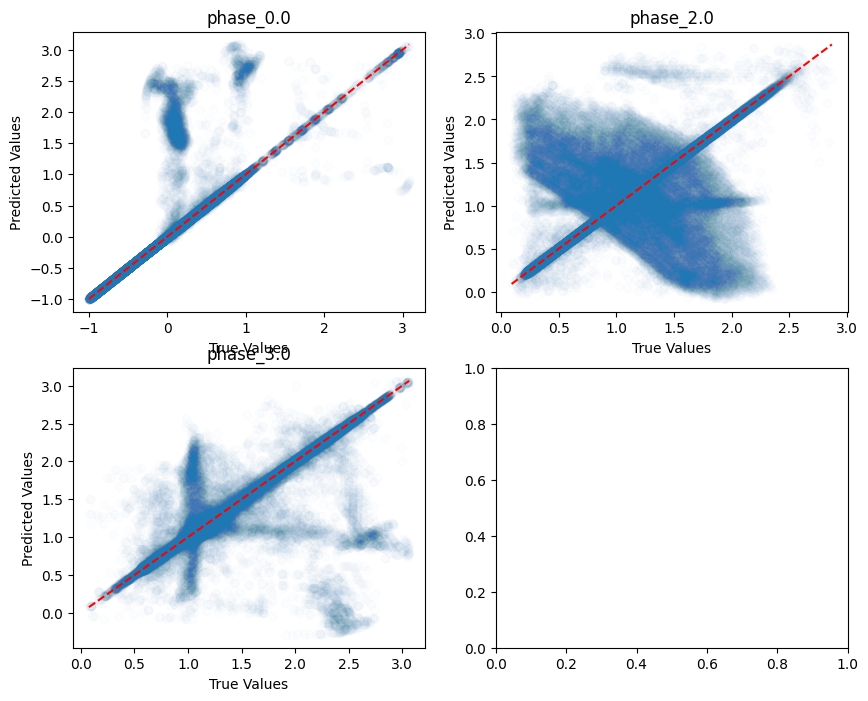

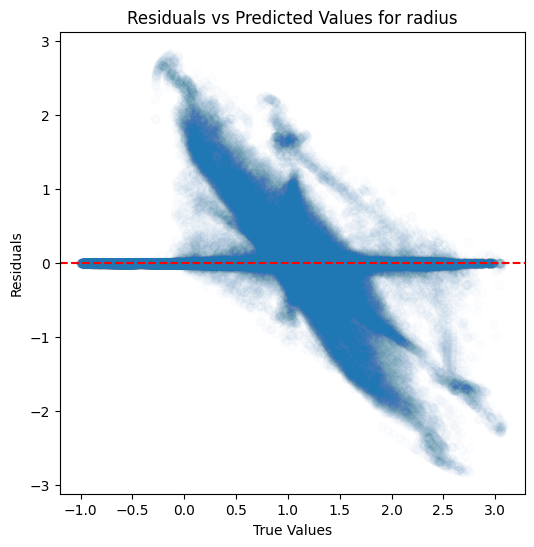

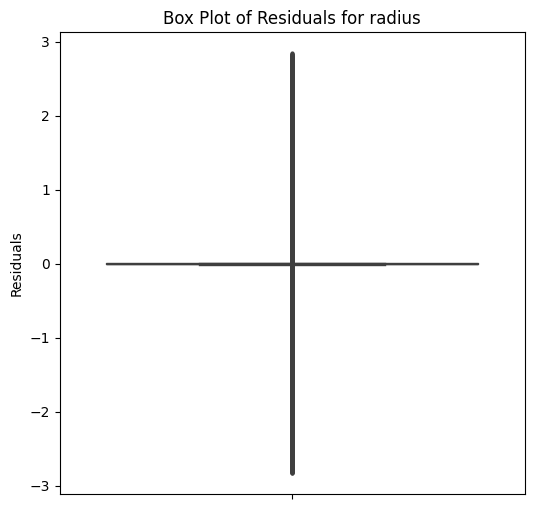

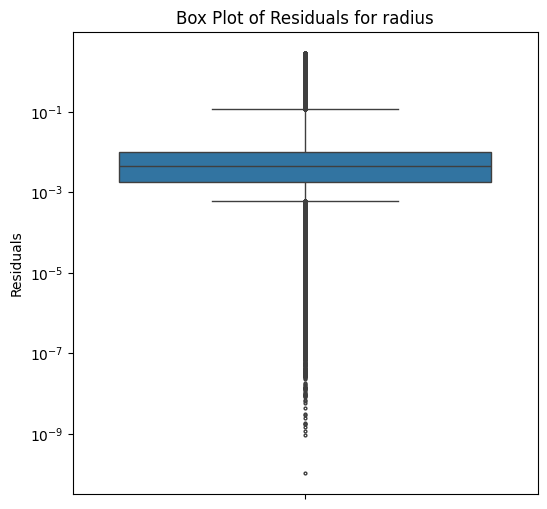

...

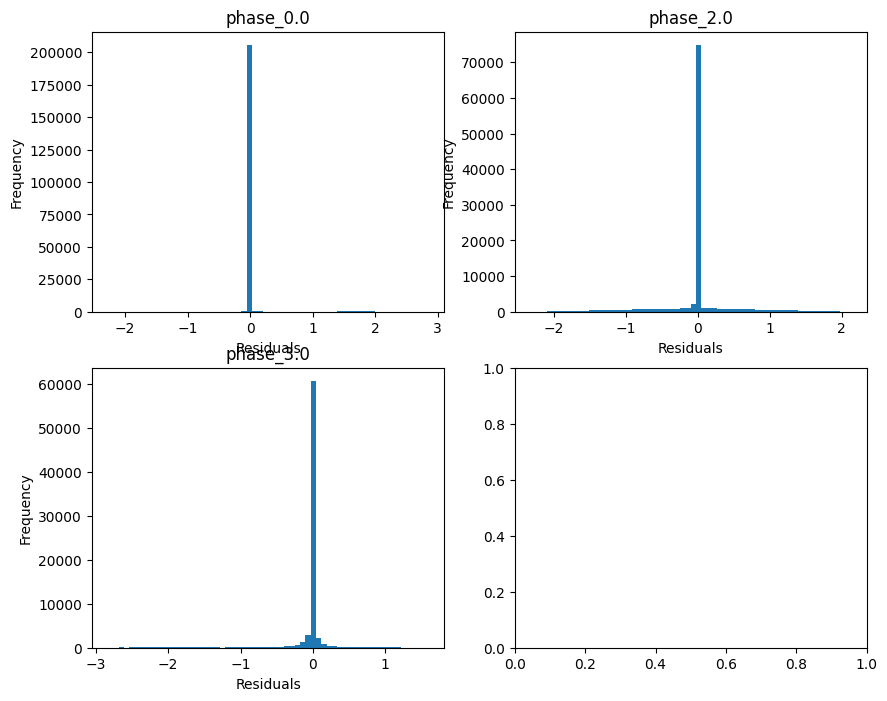

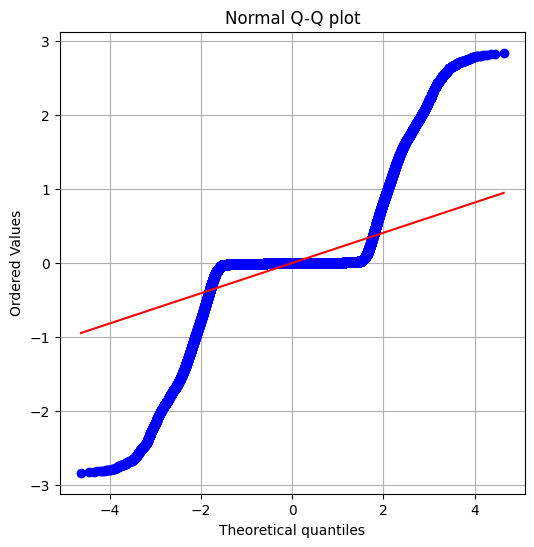

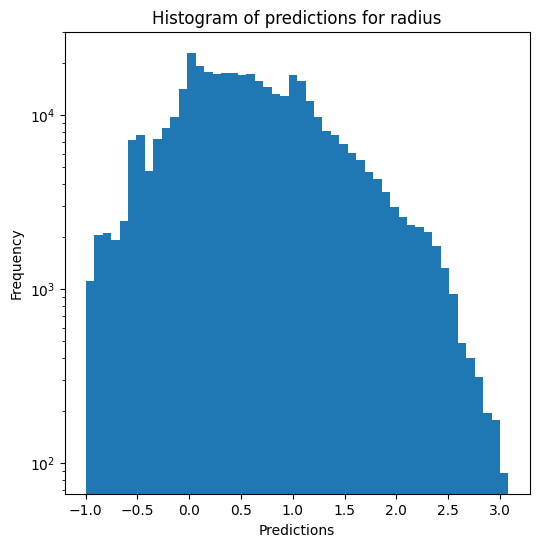

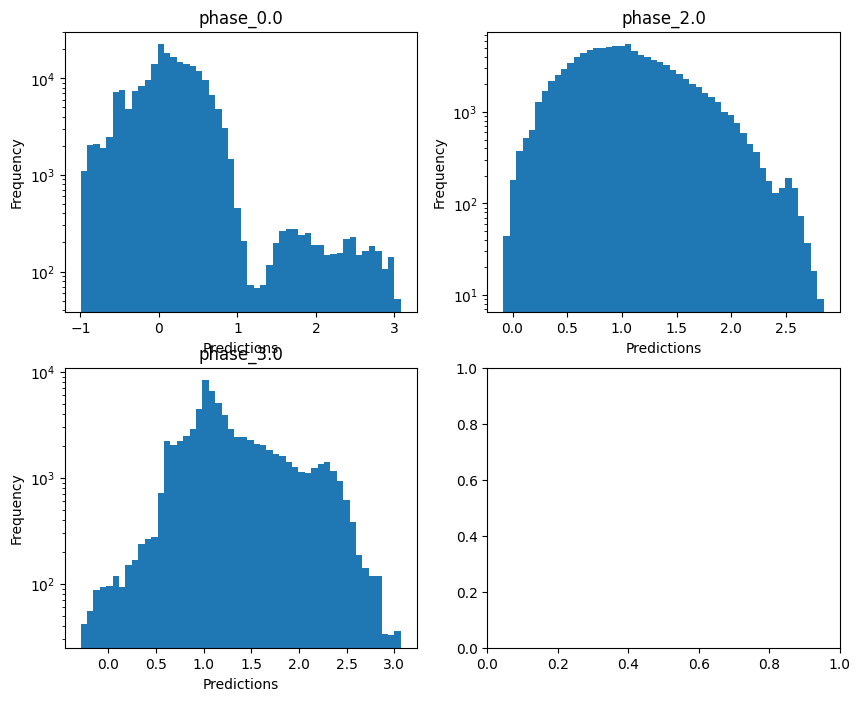

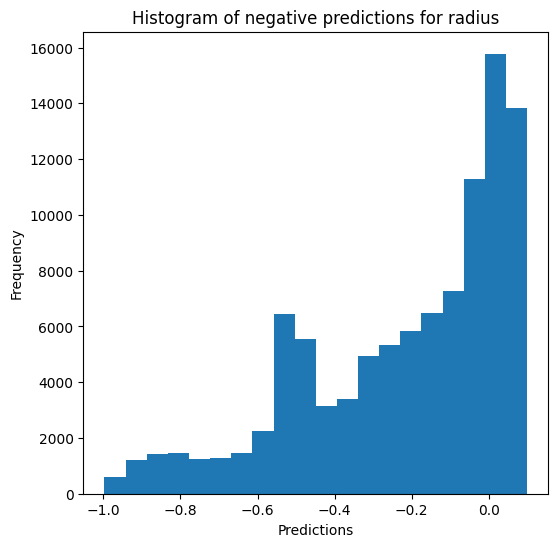

Saving predictions and results...


In [13]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### K-nearest neighbours

In [14]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9844209009429568
  RMSE :  0.03736042330150283
  MAE :  0.006074253160906068
  MedAE :  0.0010886234381688453
  CORR :  0.9922297343760061
  MAX_ER :  0.888815589920493
  Percentiles : 
    75th percentile :  0.002472838765490426
    90th percentile :  0.005268719270351063
    95th percentile :  0.00869930684621493
    99th percentile :  0.12776320729661553

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9724161793517285
  RMSE :  0.040805846938456077
  MAE :  0.01829742957066378
  MedAE :  0.0026645875083213255
  CORR :  0.9861270504699984
  MAX_ER :  0.6260565282565982
  Percentiles : 
    75th percentile :  0.015498387502951183
    90th percentile :  0.06208006484

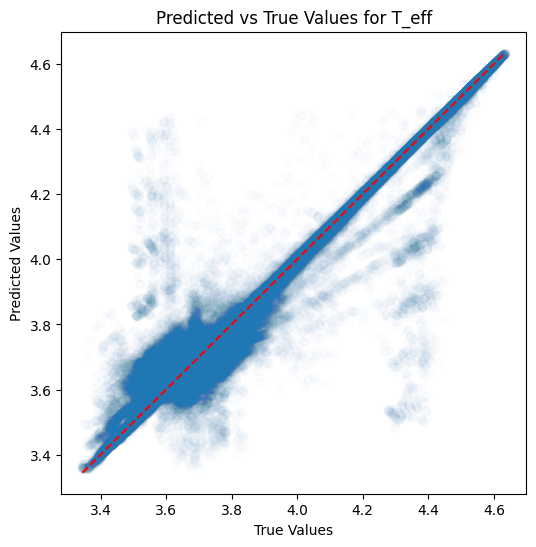

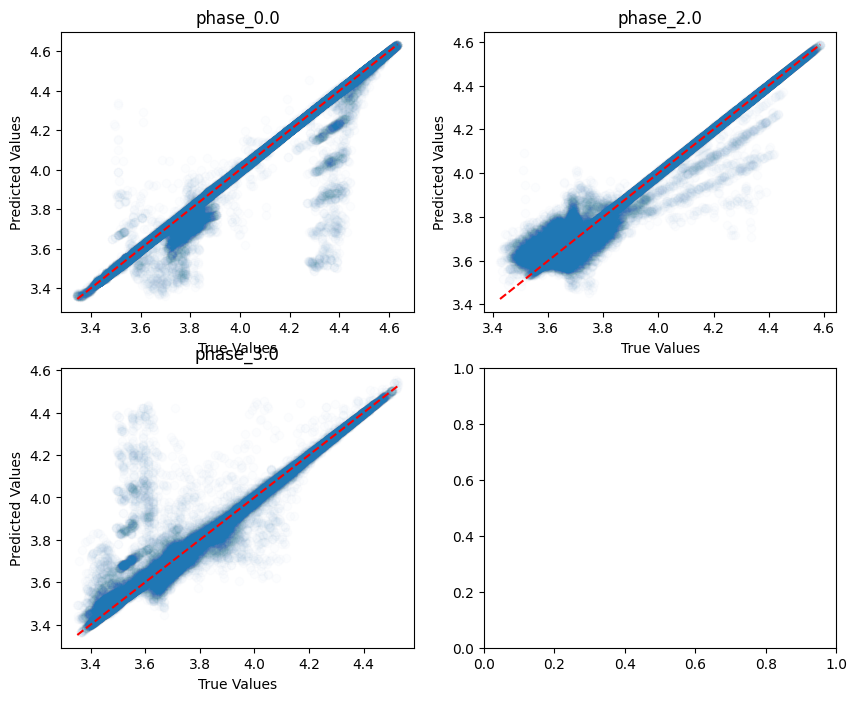

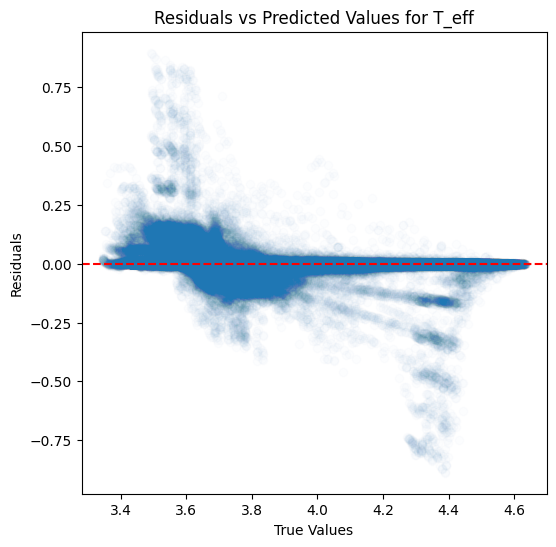

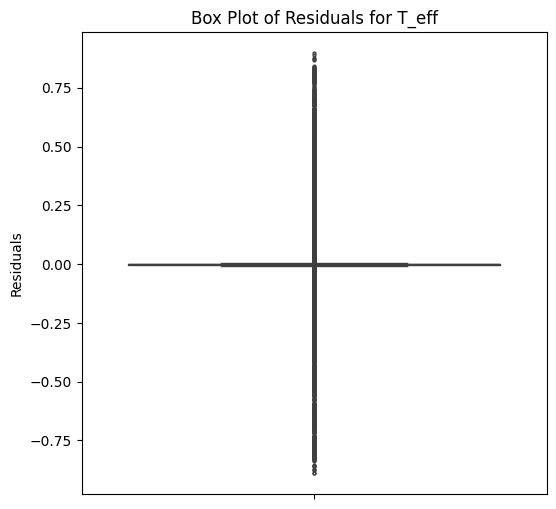

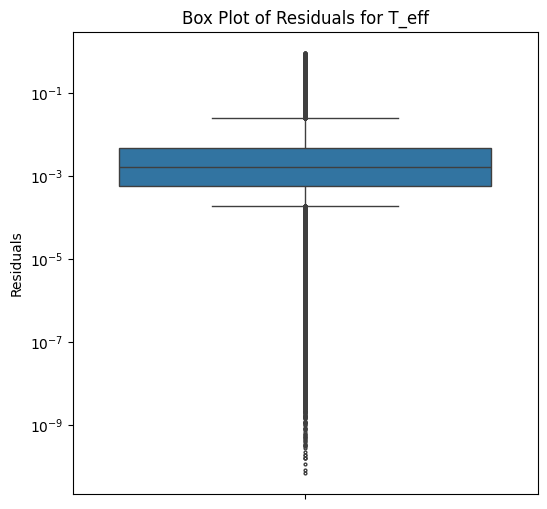

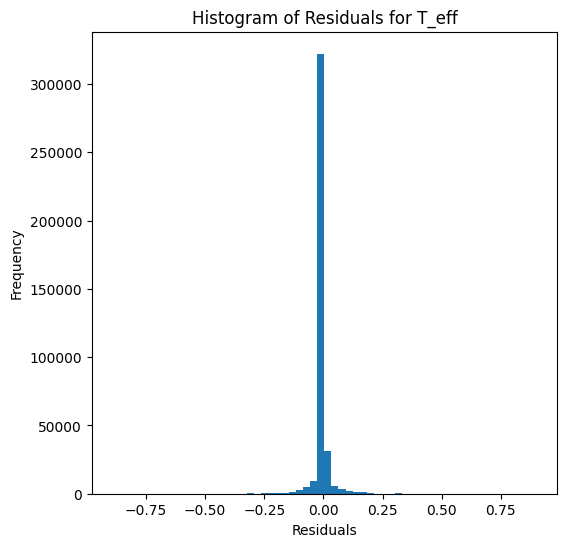

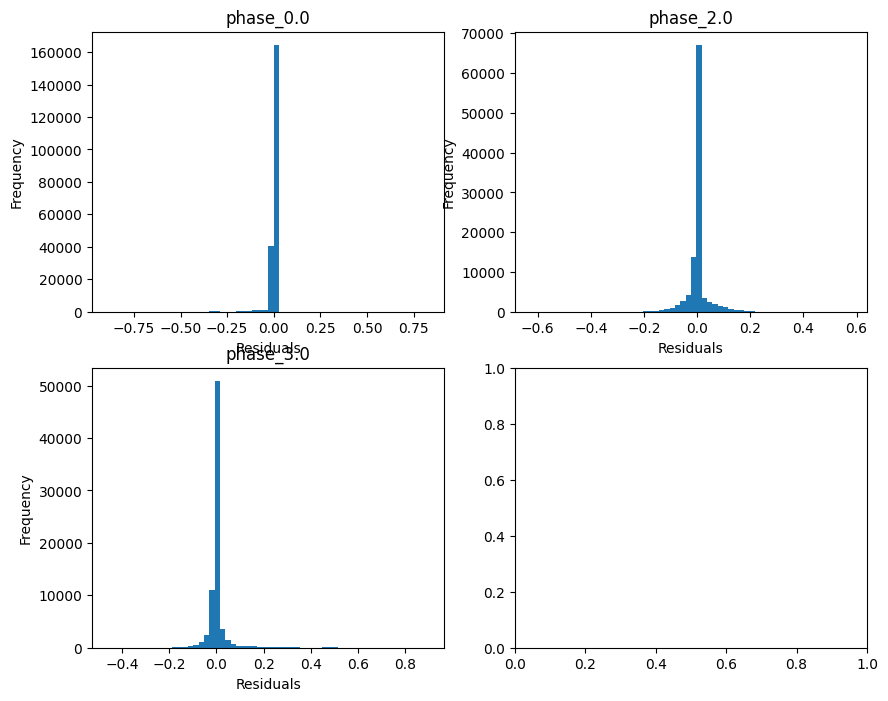

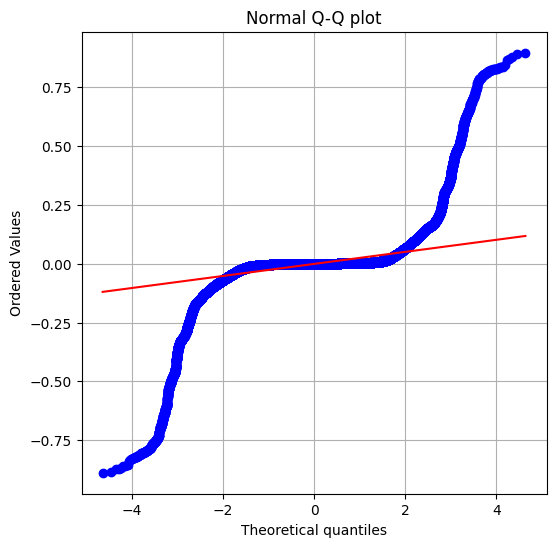

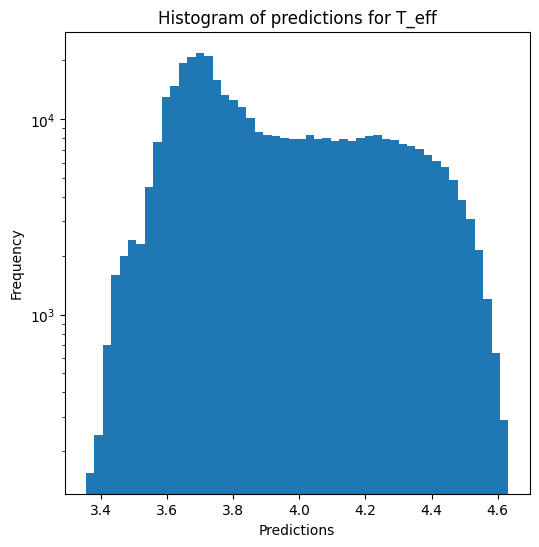

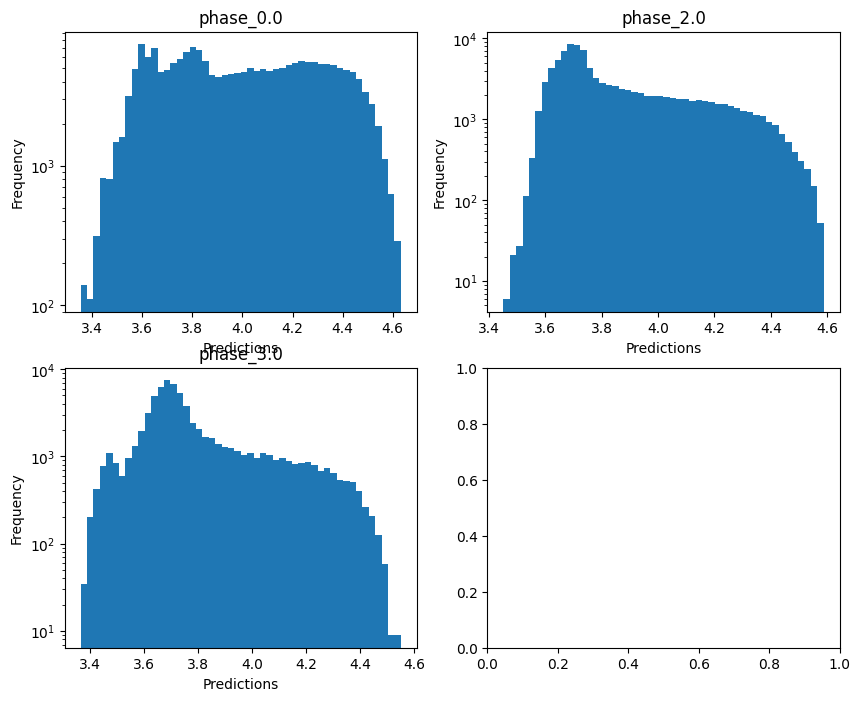


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.5135375737010868
  RMSE :  0.3208270407791721
  MAE :  0.04893973785535988
  MedAE :  0.0025479182800234312
  CORR :  0.8350155424204334
  MAX_ER :  5.545795164845766
  Percentiles : 
    75th percentile :  0.006029239355222593
    90th percentile :  0.013930681359307688
    95th percentile :  0.028400409384035315
    99th percentile :  1.7428399773038779

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.5303123075394265
  RMSE :  0.6362343410520687
  MAE :  0.2939358566022489
  MedAE :  0.013088125859807676
  CORR :  0.7349547949015152
  MAX_ER :  4.330710890208363
  Percentiles : 
    75th percentile :  0.3127716402235827
    90th percentile :  1.126167359044974
    95th percentile :  1.5957279774559137
    99th percentile :  2.4083538429144684

log_g results for the phase category wi

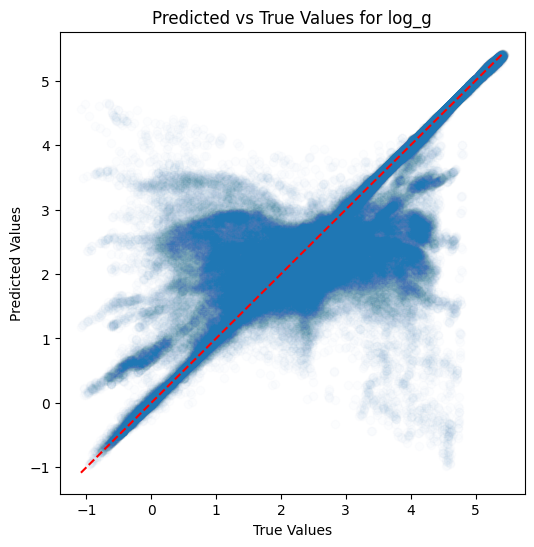

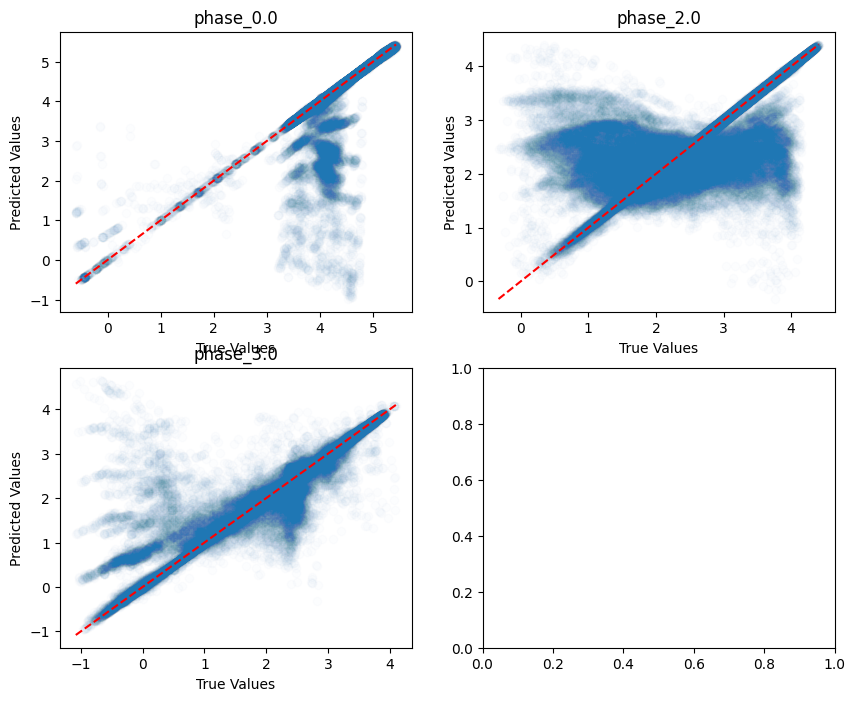

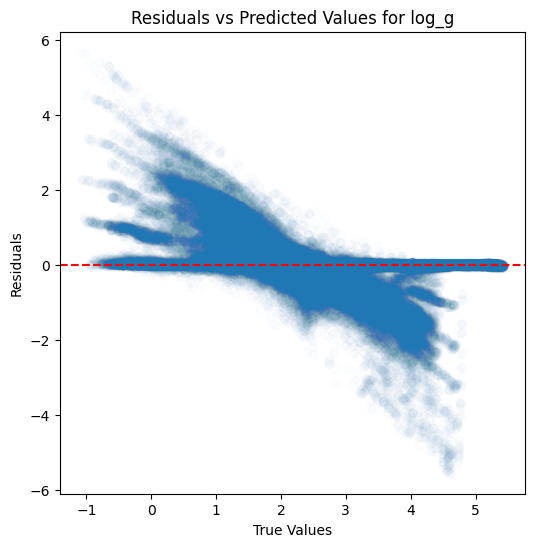

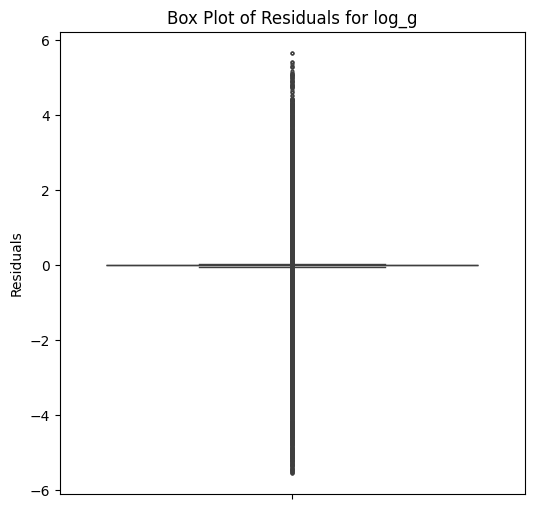

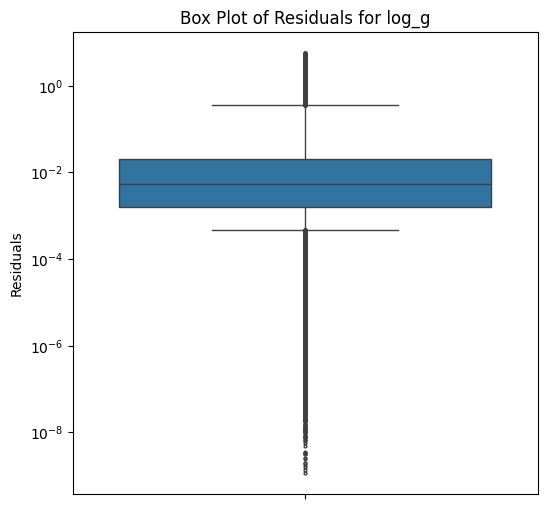

...

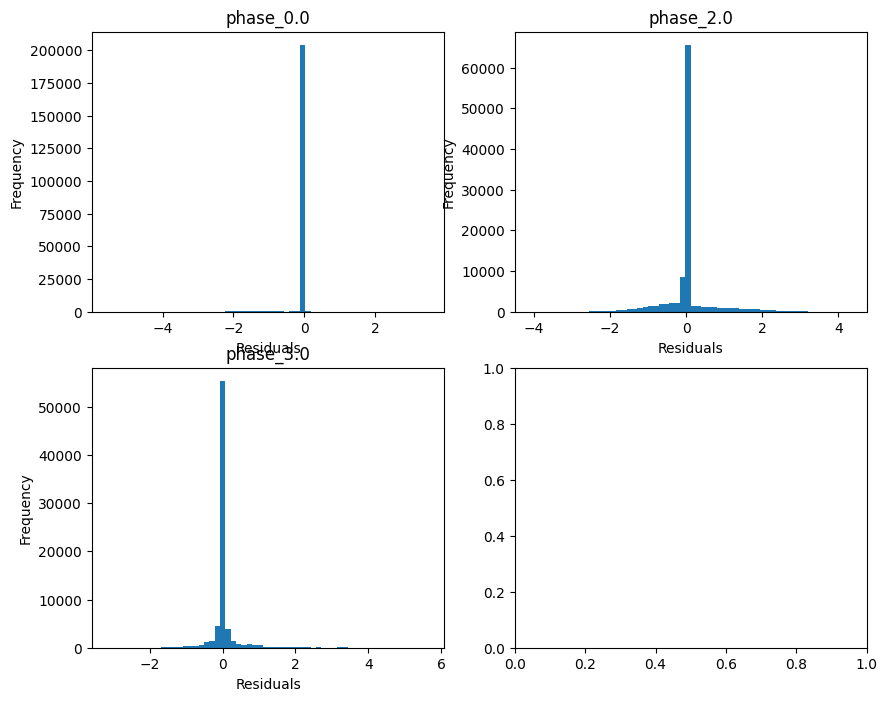

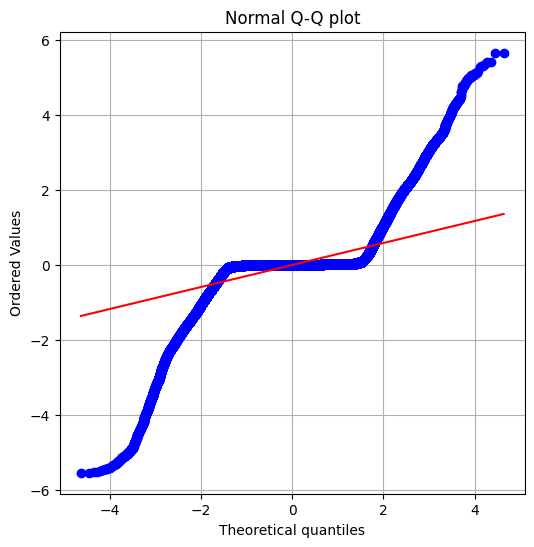

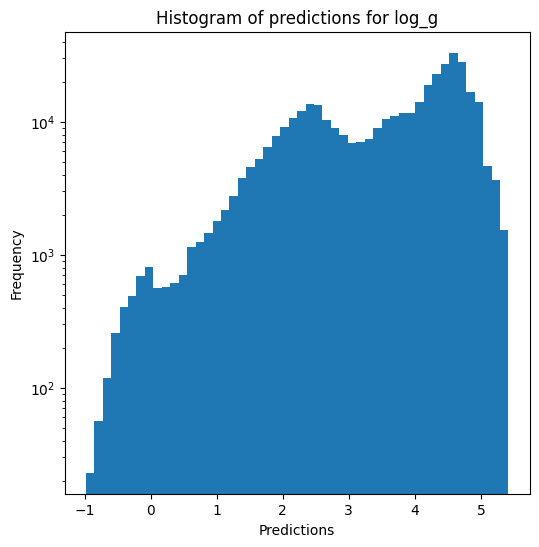

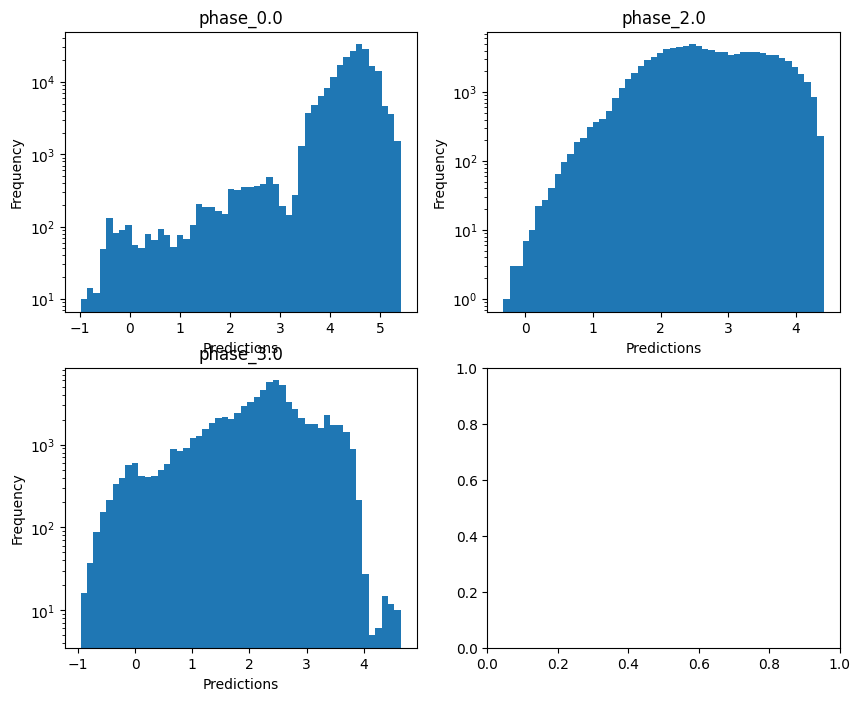

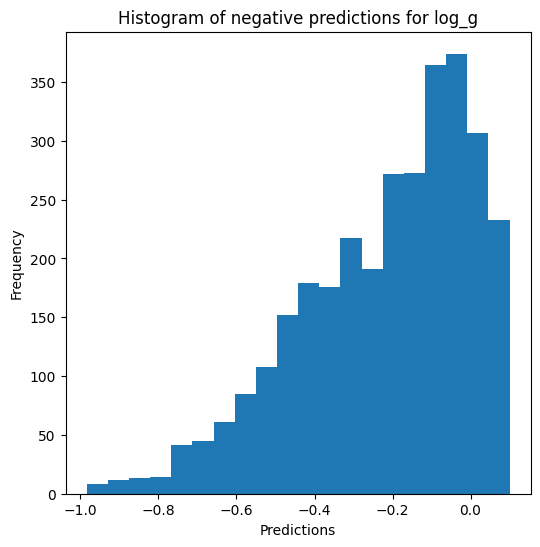


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.8574432481417027
  RMSE :  0.1605136317117611
  MAE :  0.02579666297907654
  MedAE :  0.0020674068102335963
  CORR :  0.936948038147056
  MAX_ER :  2.774405485576776
  Percentiles : 
    75th percentile :  0.00453536633934154
    90th percentile :  0.010554921312877764
    95th percentile :  0.021695080995216776
    99th percentile :  0.8712262619816336

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.5333019304174877
  RMSE :  0.3181112925136617
  MAE :  0.14697227306789126
  MedAE :  0.006558192996225398
  CORR :  0.7405883337799539
  MAX_ER :  2.16546836611197
  Percentiles : 
    75th percentile :  0.15639653669980128
    90th percentile :  0.5631670973370123
    95th percentile :  0.7979243566625472
    99th percentile :  1.204295821027935

radius results for the phase category w

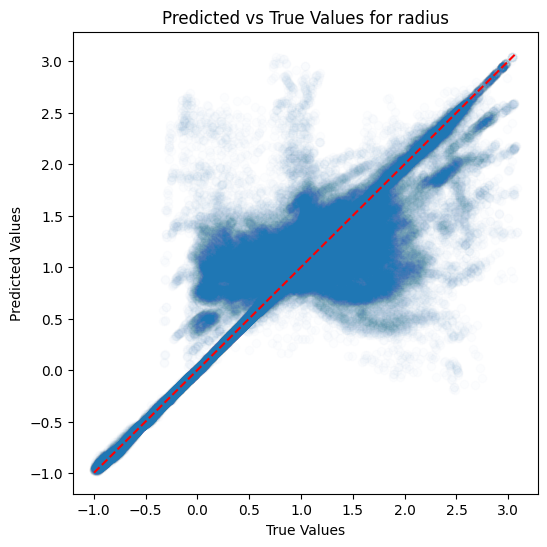

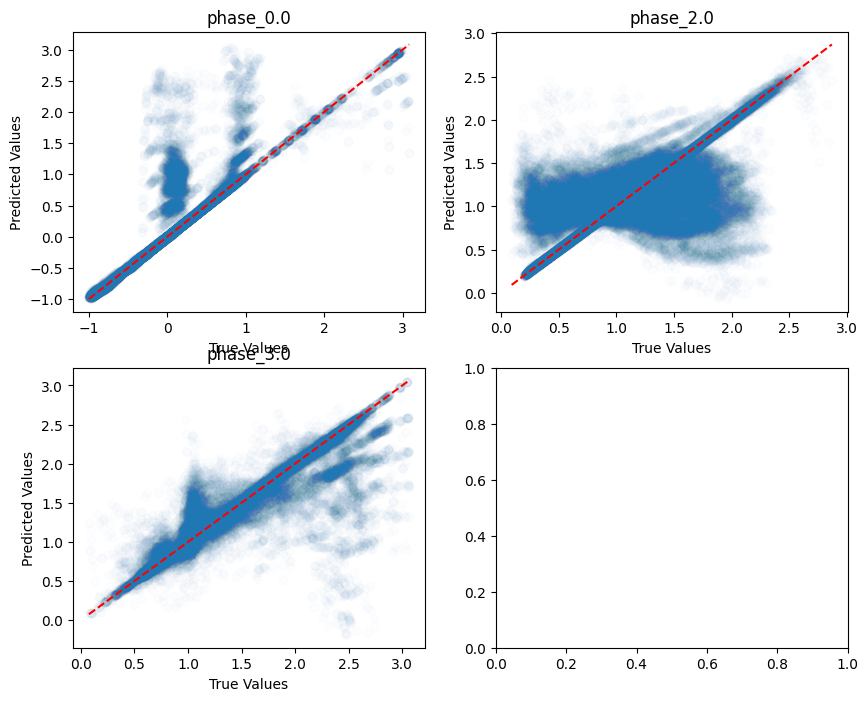

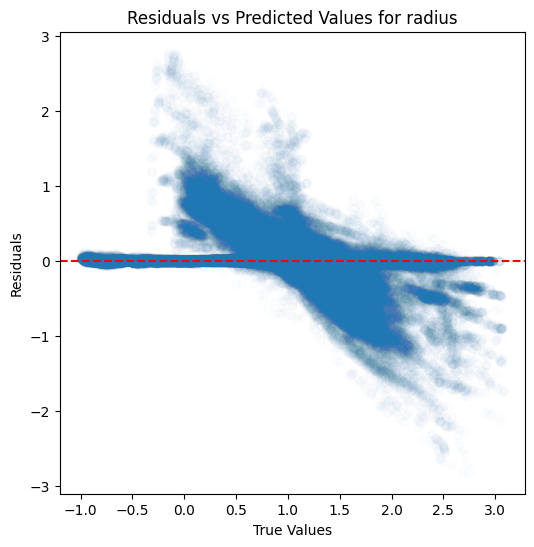

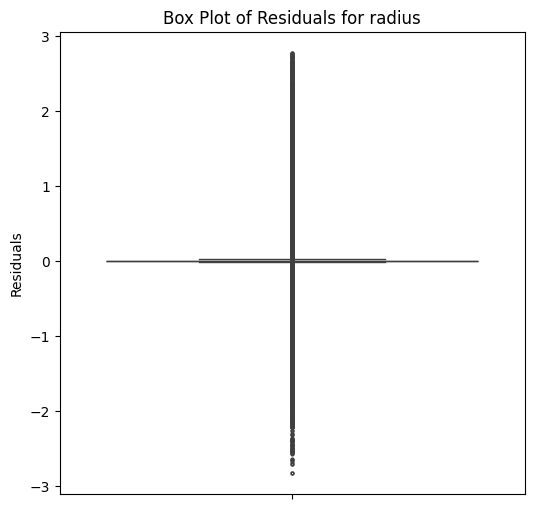

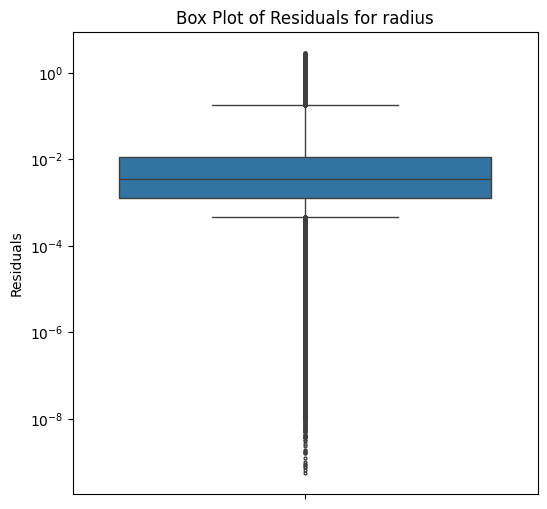

...

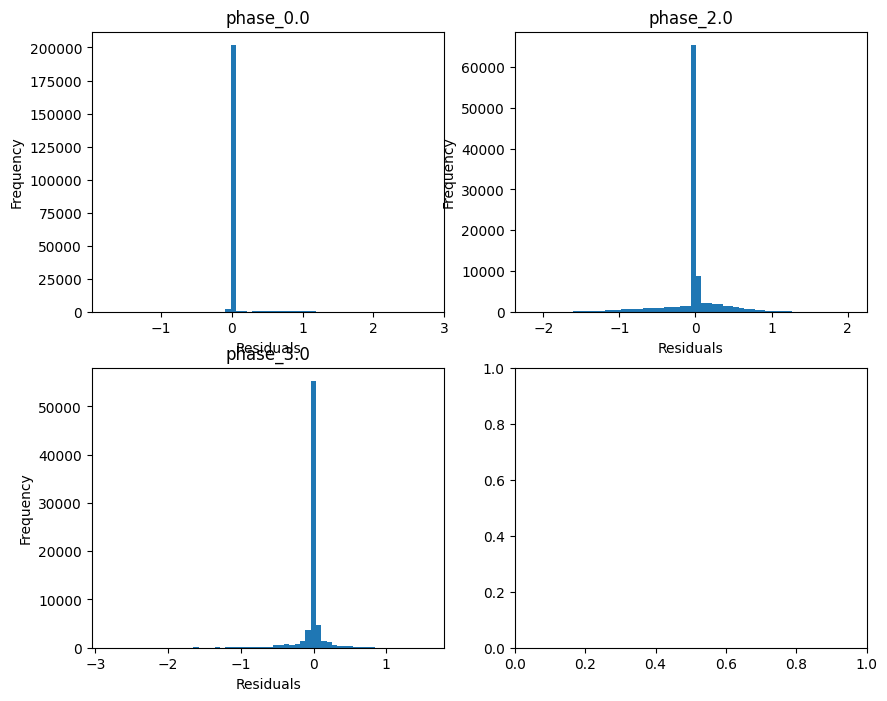

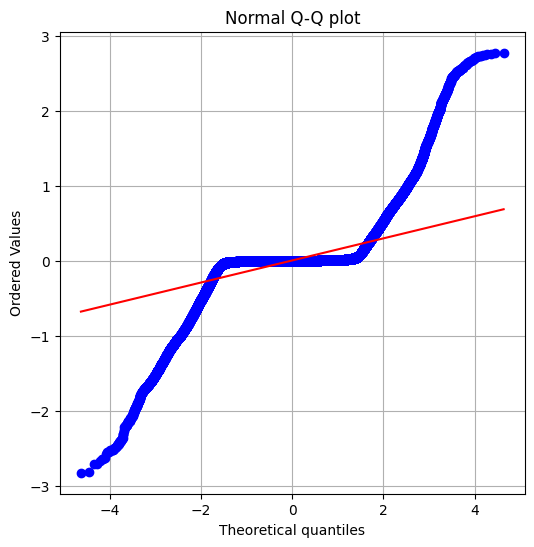

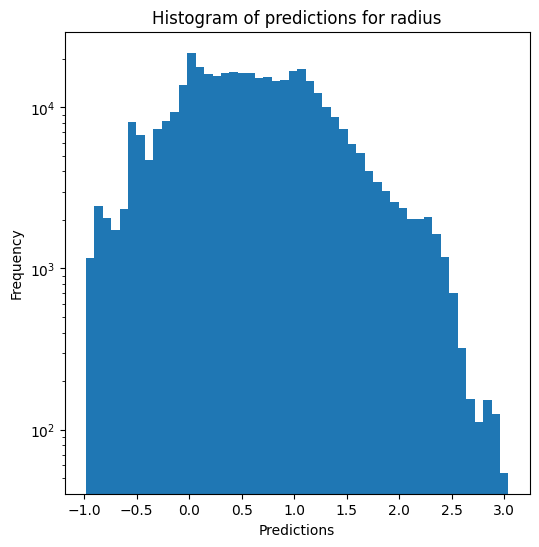

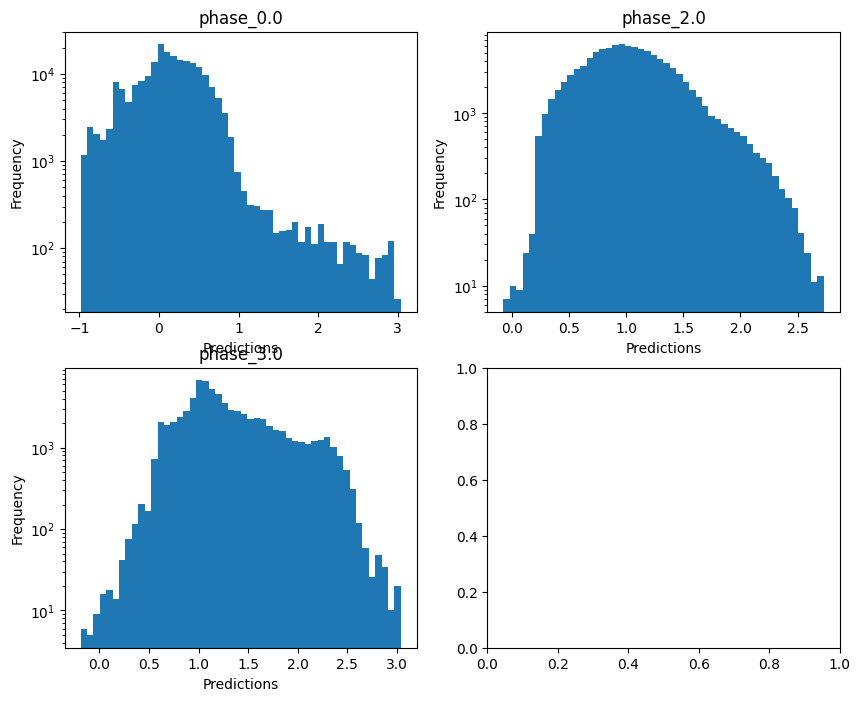

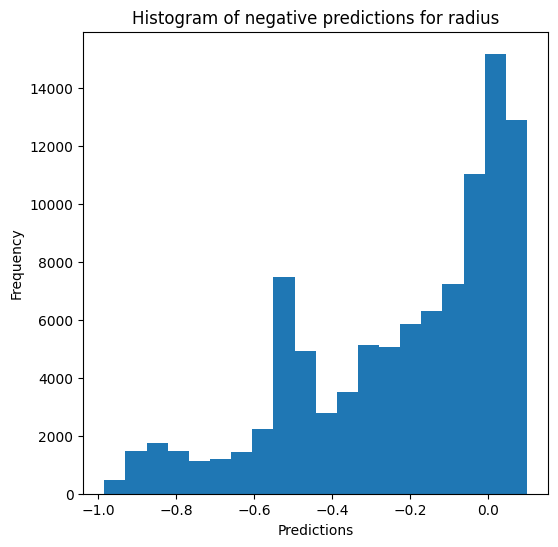

Saving predictions and results...


In [15]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### Random forests

In [16]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9813116825898506
  RMSE :  0.040937096240759065
  MAE :  0.005960381154549612
  MedAE :  0.0005271257581780375
  CORR :  0.9907223884842074
  MAX_ER :  0.890106740571615
  Percentiles : 
    75th percentile :  0.0012934137546944946
    90th percentile :  0.003535855825468559
    95th percentile :  0.008616157100893314
    99th percentile :  0.14004470701370636

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9555360513090113
  RMSE :  0.05180420955020557
  MAE :  0.022249879890958245
  MedAE :  0.0026493995401866144
  CORR :  0.9775248917636558
  MAX_ER :  0.7241035462034882
  Percentiles : 
    75th percentile :  0.017815534809748512
    90th percentile :  0.07725189

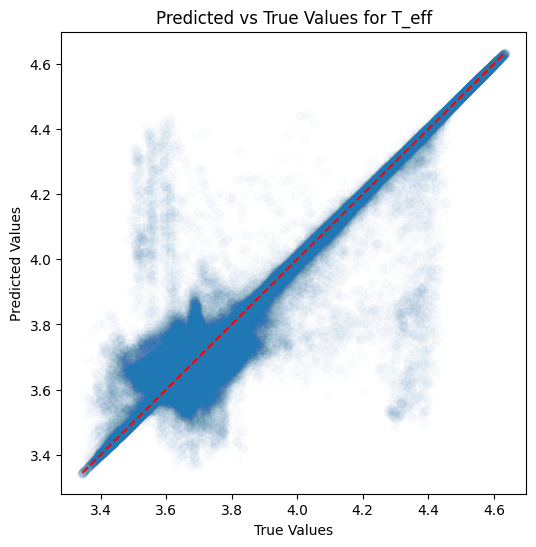

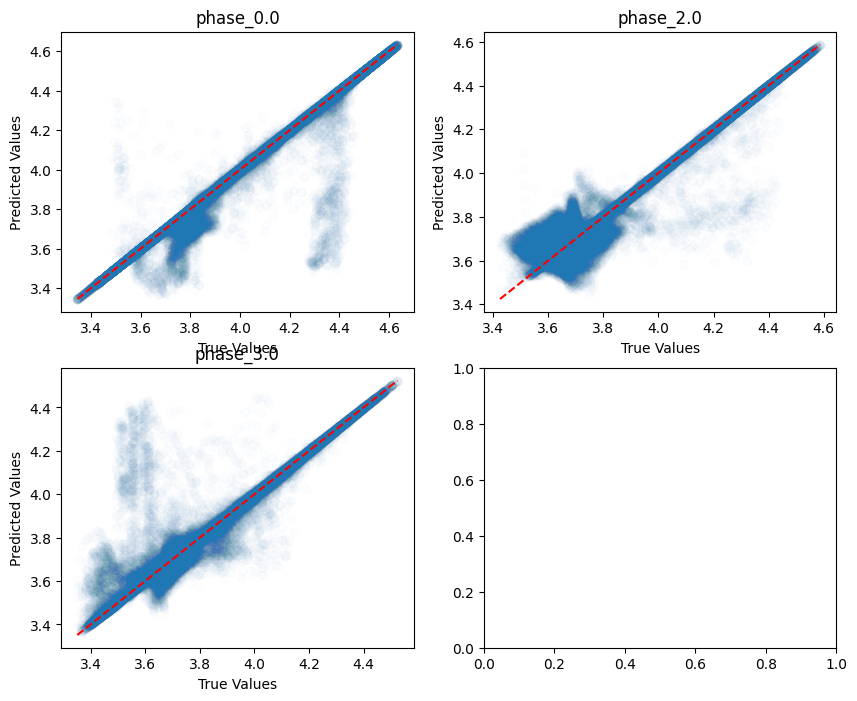

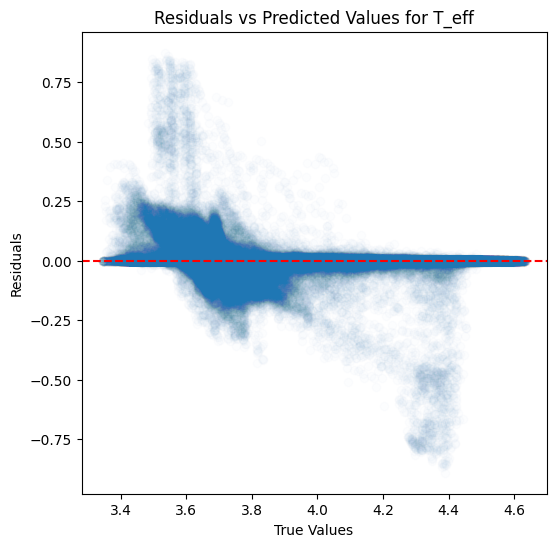

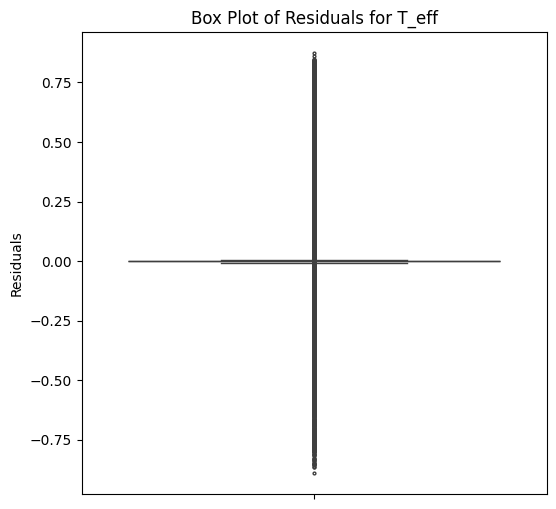

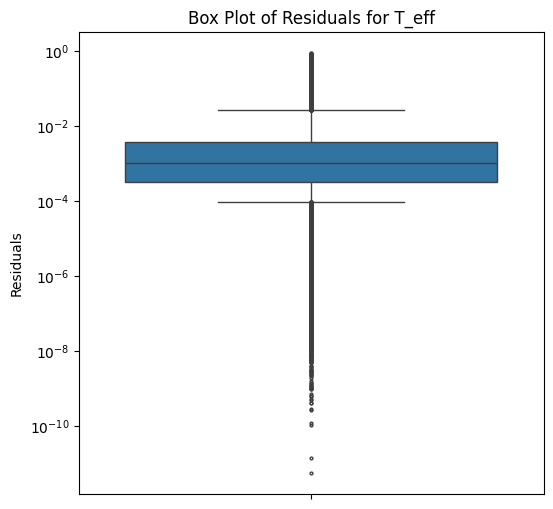

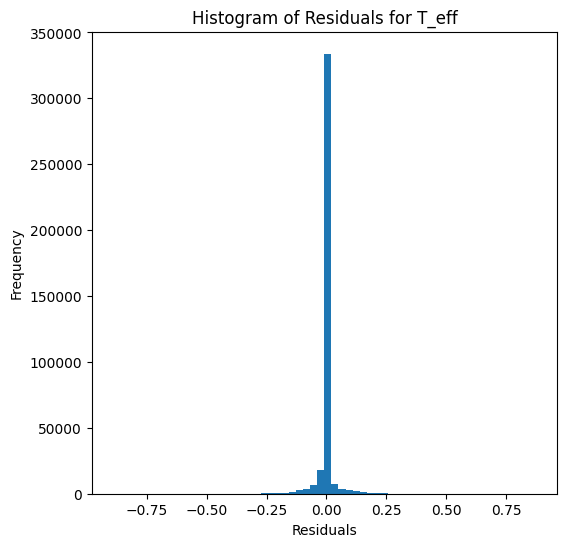

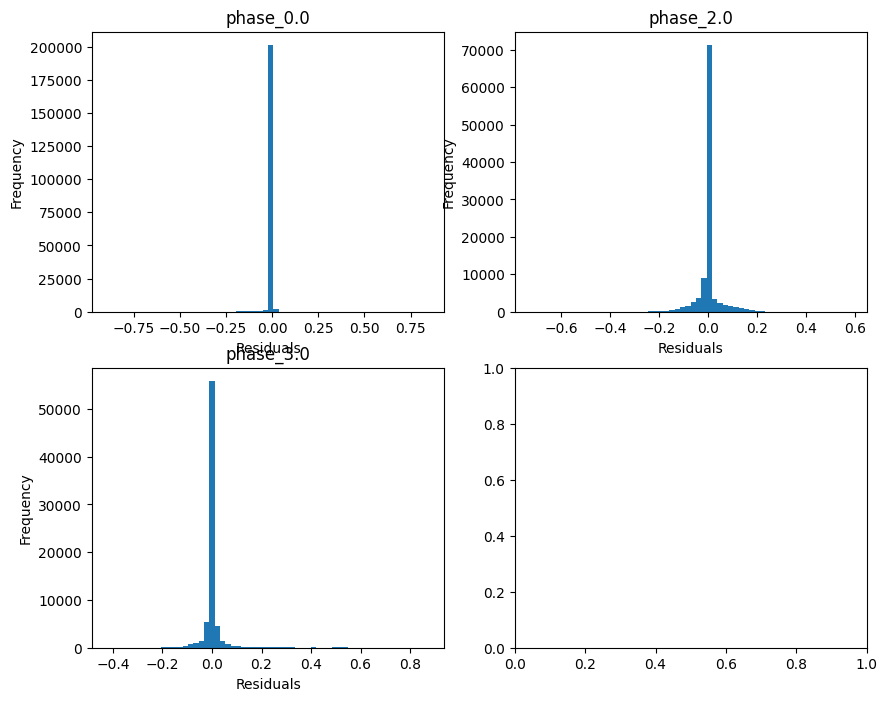

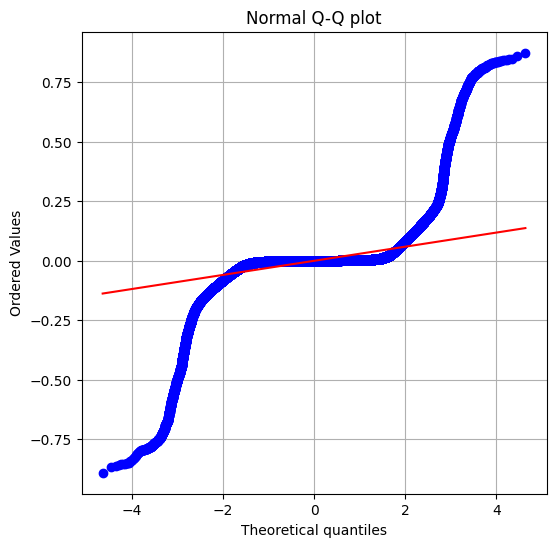

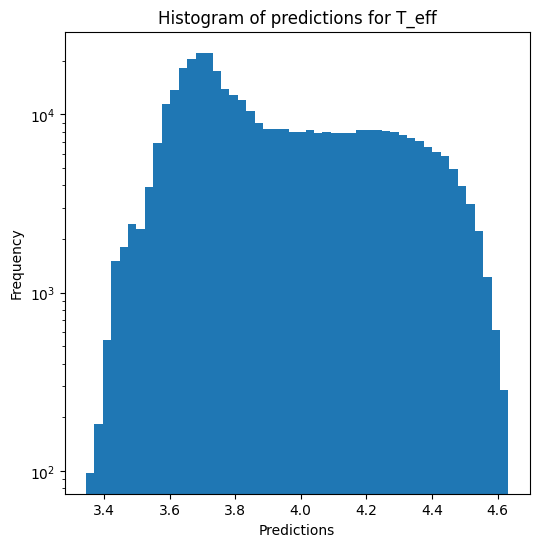

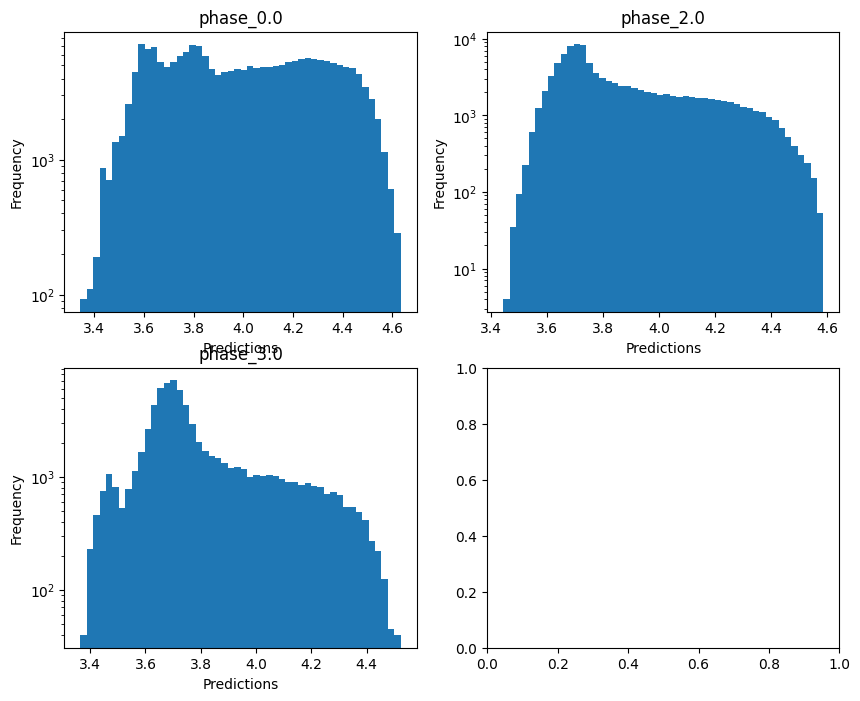


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.41029428815184943
  RMSE :  0.3535818097501646
  MAE :  0.05497594086961454
  MedAE :  0.001527909582454967
  CORR :  0.8117045095693152
  MAX_ER :  5.5746329102922205
  Percentiles : 
    75th percentile :  0.0041755950153827825
    90th percentile :  0.012269495957190917
    95th percentile :  0.04556677038631647
    99th percentile :  2.146206238987379

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.2870115277442493
  RMSE :  0.783804347125614
  MAE :  0.35951036185257795
  MedAE :  0.013436363194999634
  CORR :  0.6033860800909981
  MAX_ER :  4.450634554355214
  Percentiles : 
    75th percentile :  0.33408019064926164
    90th percentile :  1.4337684257110976
    95th percentile :  2.013731946710976
    99th percentile :  2.974814784102037

log_g results for the phase category wi

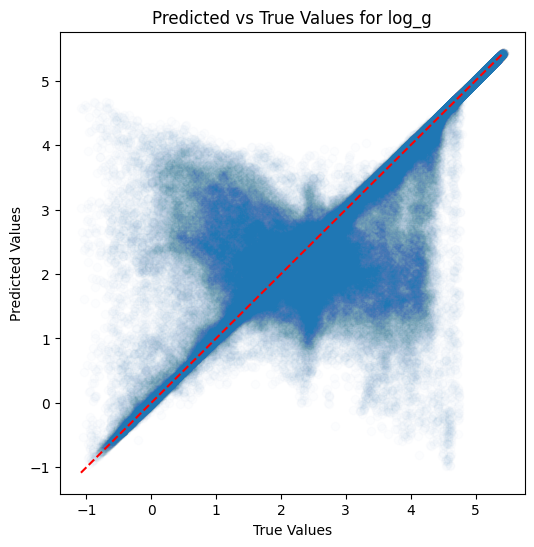

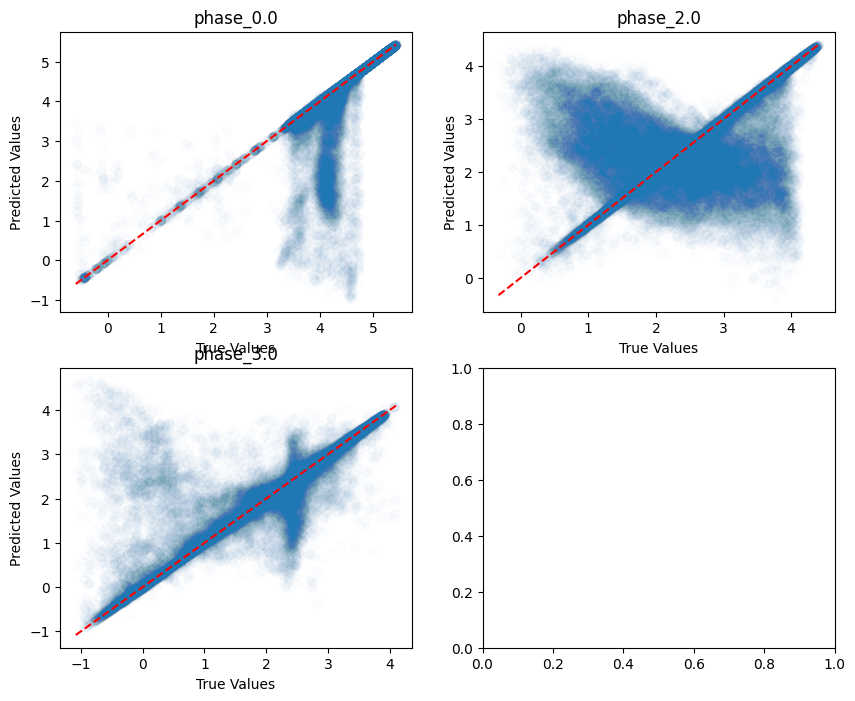

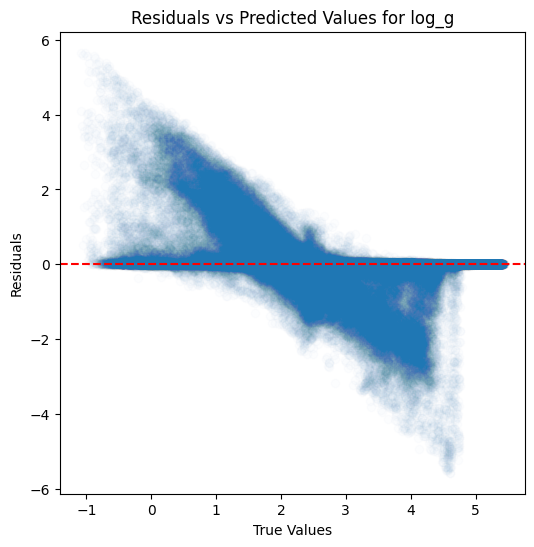

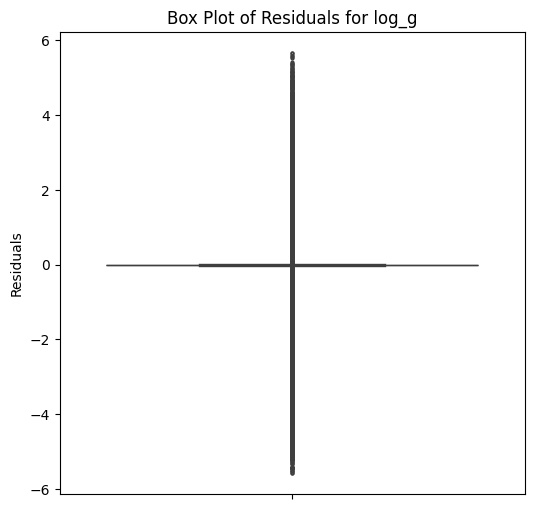

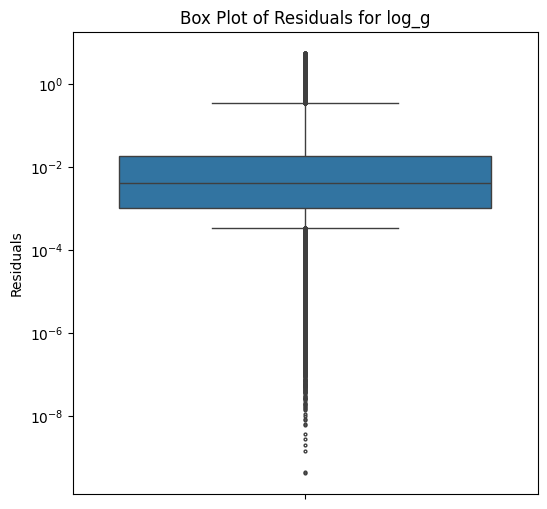

...

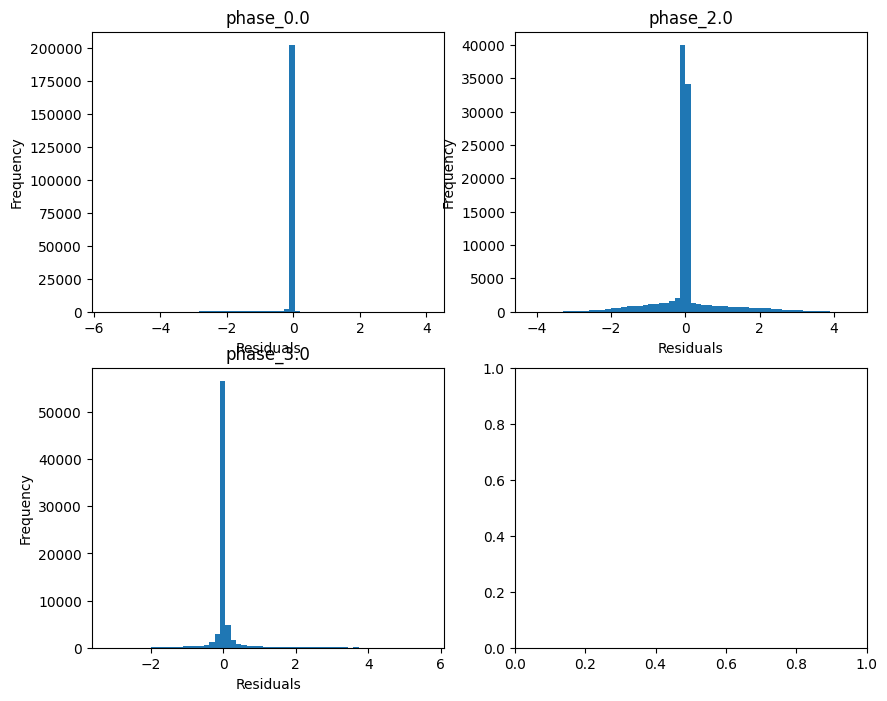

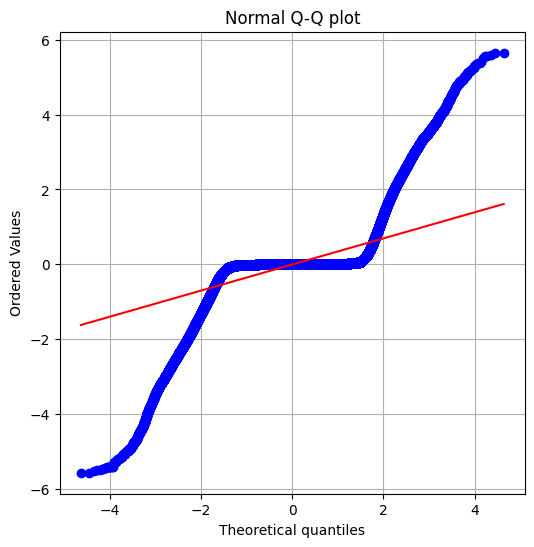

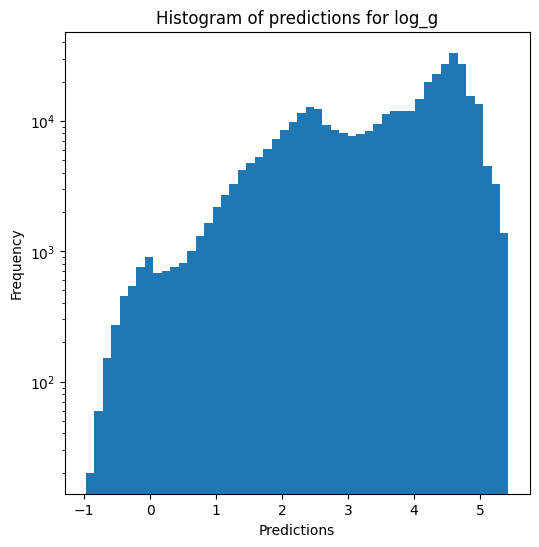

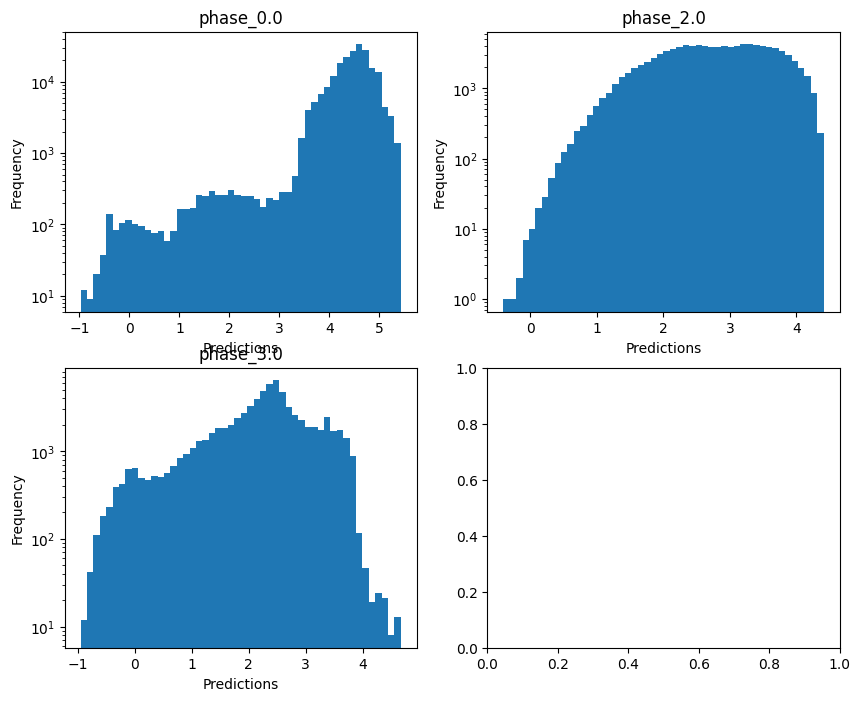

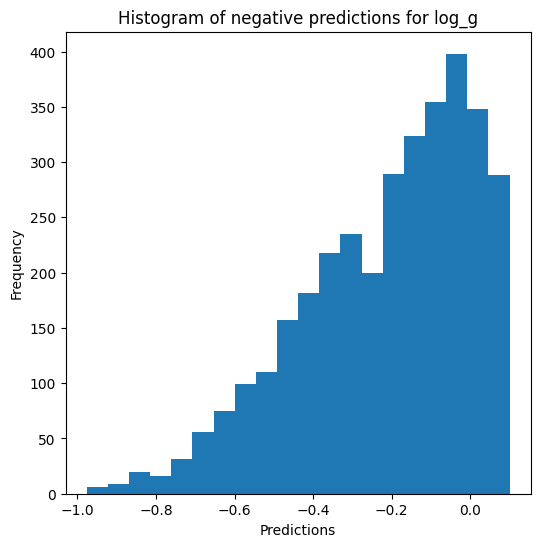


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.8273746397030555
  RMSE :  0.17680851972949863
  MAE :  0.02771510692551047
  MedAE :  0.0009752611351787621
  CORR :  0.9249915151127549
  MAX_ER :  2.7890763844832716
  Percentiles : 
    75th percentile :  0.002489591358251275
    90th percentile :  0.006693471580068344
    95th percentile :  0.023047825914394478
    99th percentile :  1.0728693094233257

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.29155761193413243
  RMSE :  0.39189292493570776
  MAE :  0.179755677845602
  MedAE :  0.006729658292007751
  CORR :  0.6165040200736773
  MAX_ER :  2.2254664566715596
  Percentiles : 
    75th percentile :  0.16706242081265005
    90th percentile :  0.7168284089786452
    95th percentile :  1.0066572752795677
    99th percentile :  1.4874495792422628

radius results for the phase cat

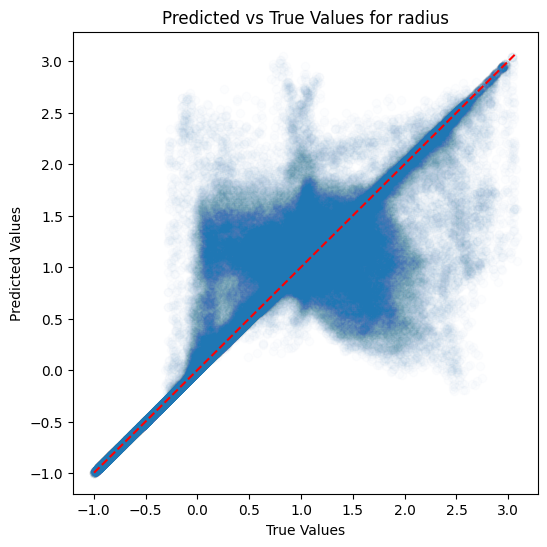

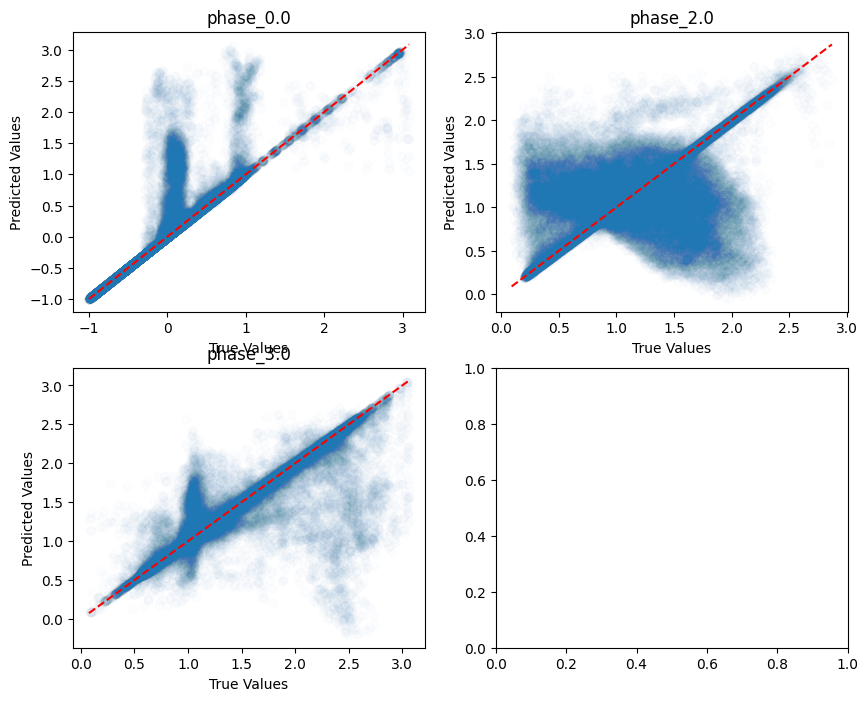

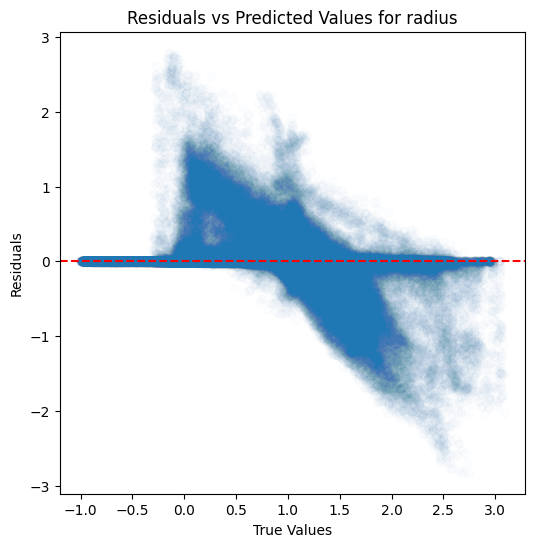

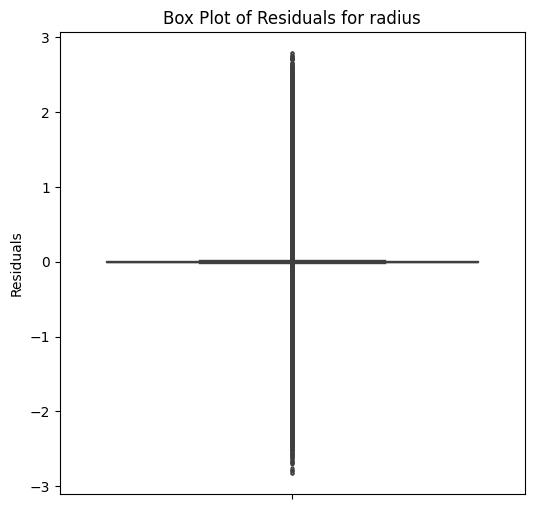

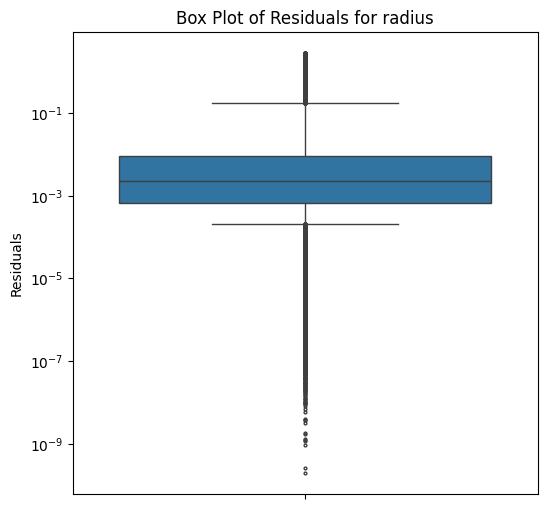

...

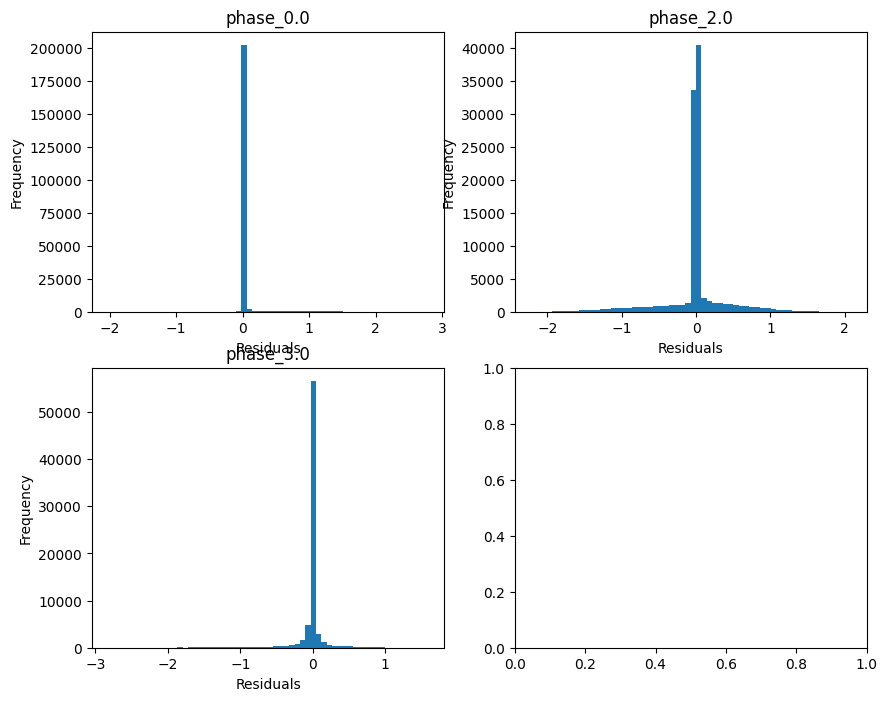

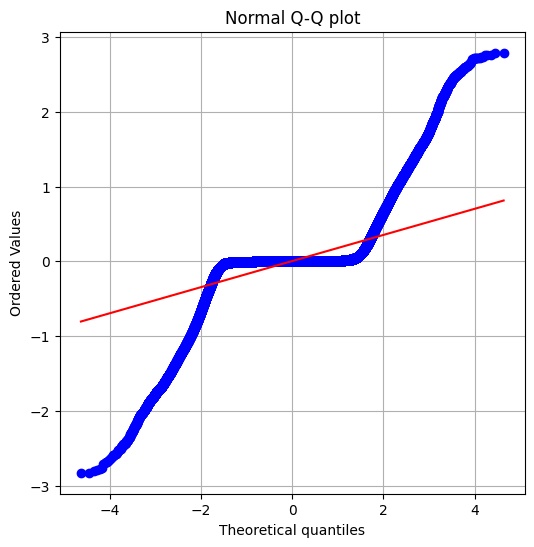

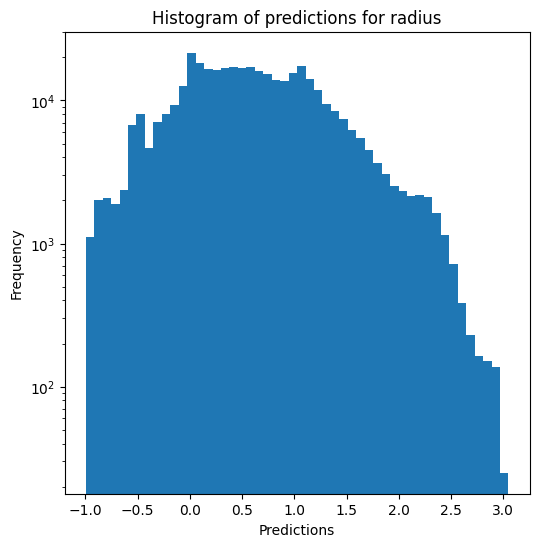

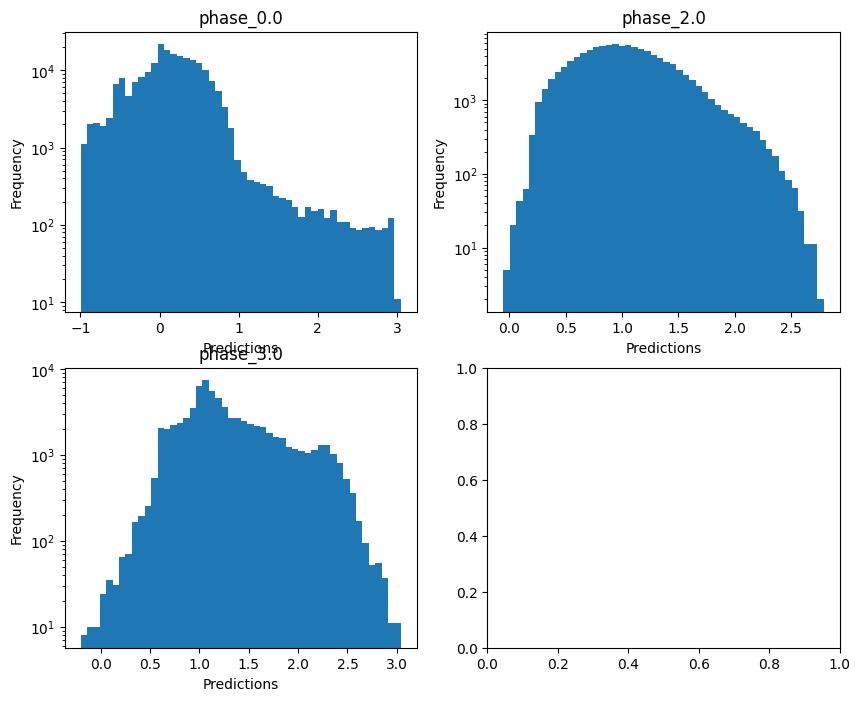

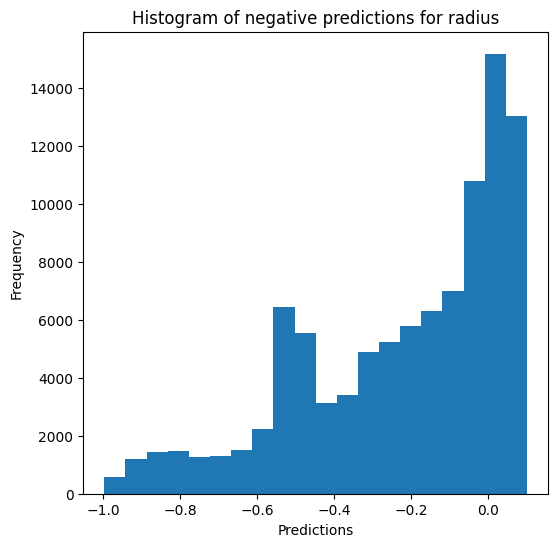

Saving predictions and results...


In [17]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)
# average depth de 44-46

### XGBoost

In [18]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9328812125306544
  RMSE :  0.08436996694299109
  MAE :  0.04434688731331393
  MedAE :  0.012608525034539575
  CORR :  0.9659227808366357
  MAX_ER :  0.7489737233971314
  Percentiles : 
    75th percentile :  0.04990253933143496
    90th percentile :  0.1369452951960158
    95th percentile :  0.20083029604316305
    99th percentile :  0.3370684218728553

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.778897629972461
  RMSE :  0.1183663836223813
  MAE :  0.08979217468546802
  MedAE :  0.07003986190429123
  CORR :  0.8826152390812044
  MAX_ER :  0.523335021344213
  Percentiles : 
    75th percentile :  0.12374499723122634
    90th percentile :  0.19619936318758233
    9

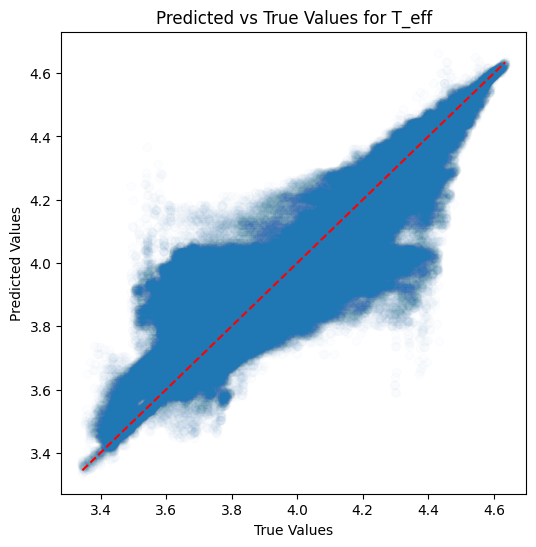

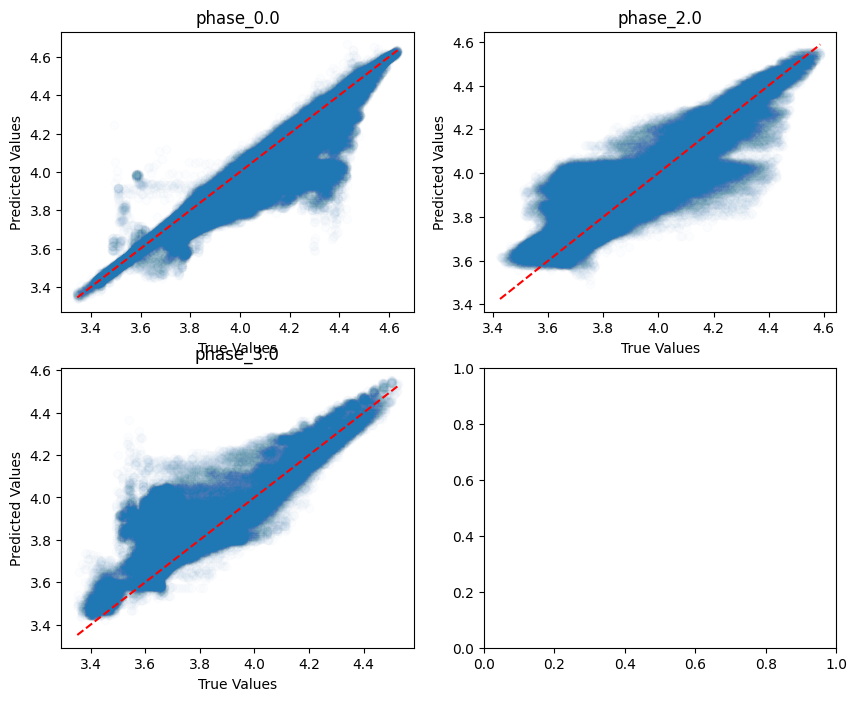

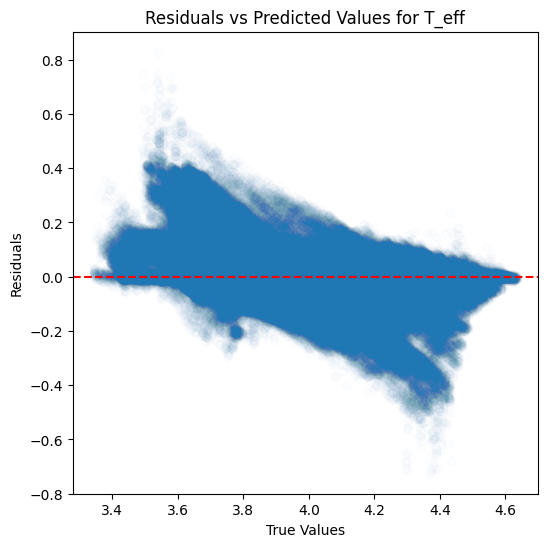

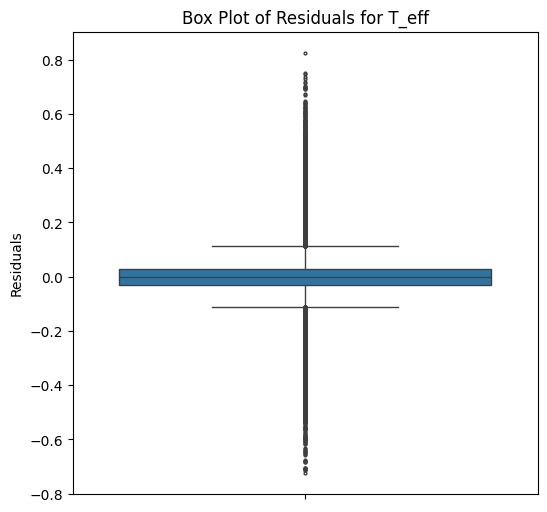

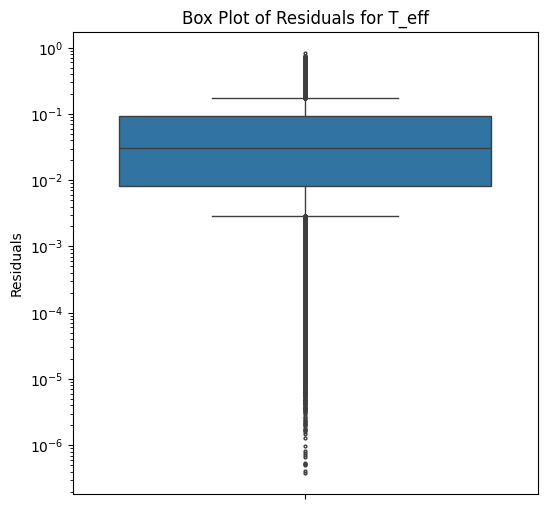

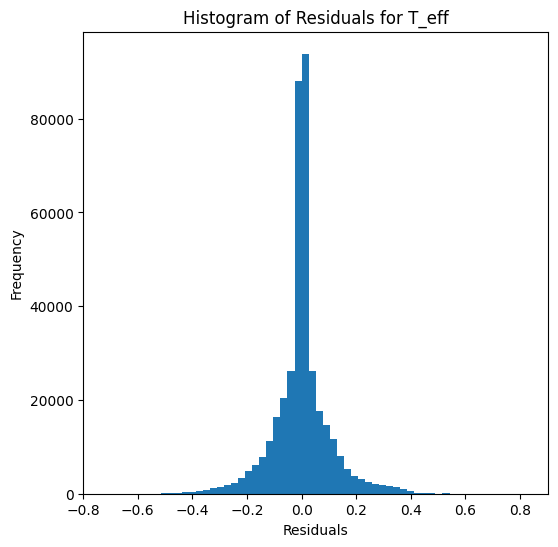

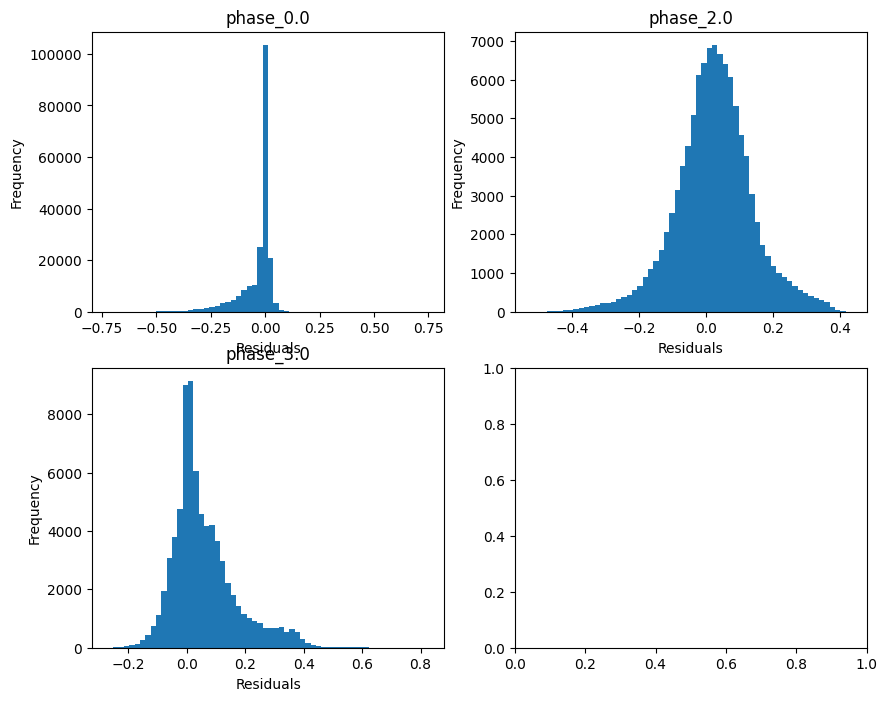

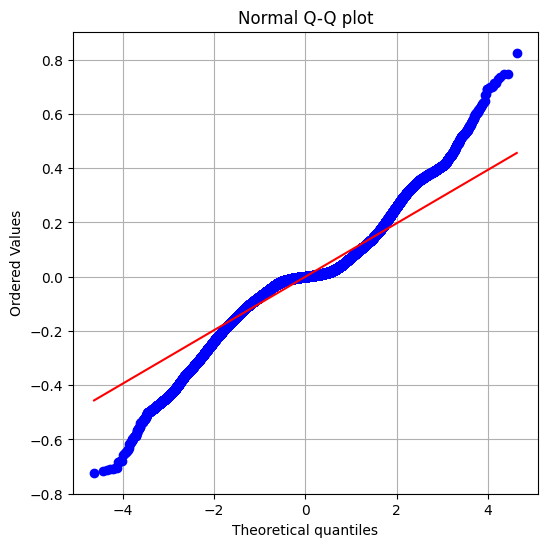

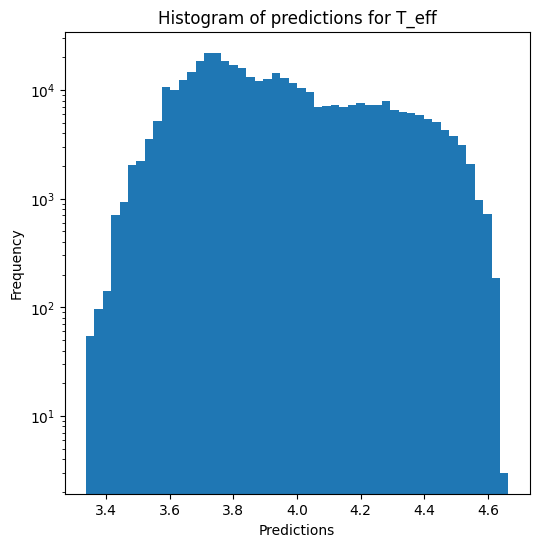

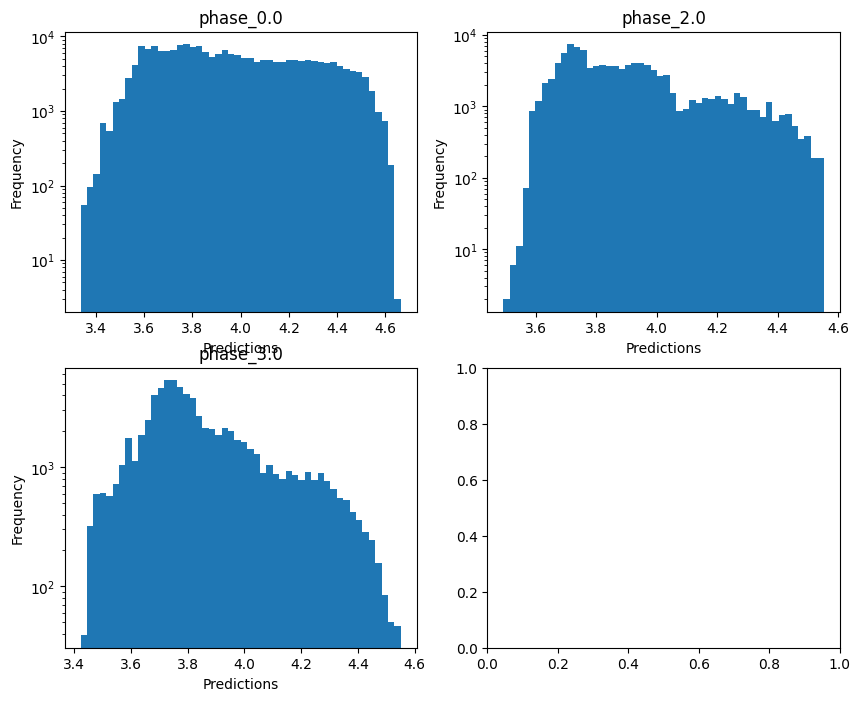


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.024850088824078798
  RMSE :  0.494808409984641
  MAE :  0.261691218462651
  MedAE :  0.0638236489302102
  CORR :  0.8405643053695954
  MAX_ER :  5.107066089193915
  Percentiles : 
    75th percentile :  0.31495284362382137
    90th percentile :  0.845148309884938
    95th percentile :  1.1668988444244963
    99th percentile :  1.7248707408243733

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.3629581138470179
  RMSE :  0.7496734516247368
  MAE :  0.5823401794941111
  MedAE :  0.46751382229254057
  CORR :  0.6024607299169299
  MAX_ER :  3.6205745588991087
  Percentiles : 
    75th percentile :  0.8350301495021815
    90th percentile :  1.2396659186279135
    95th percentile :  1.5078075271306897
    99th percentile :  2.0867798721230355

log_g results for the phase category with a valu

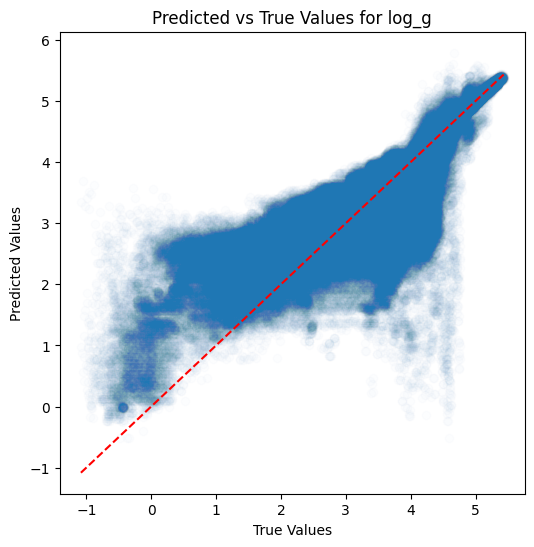

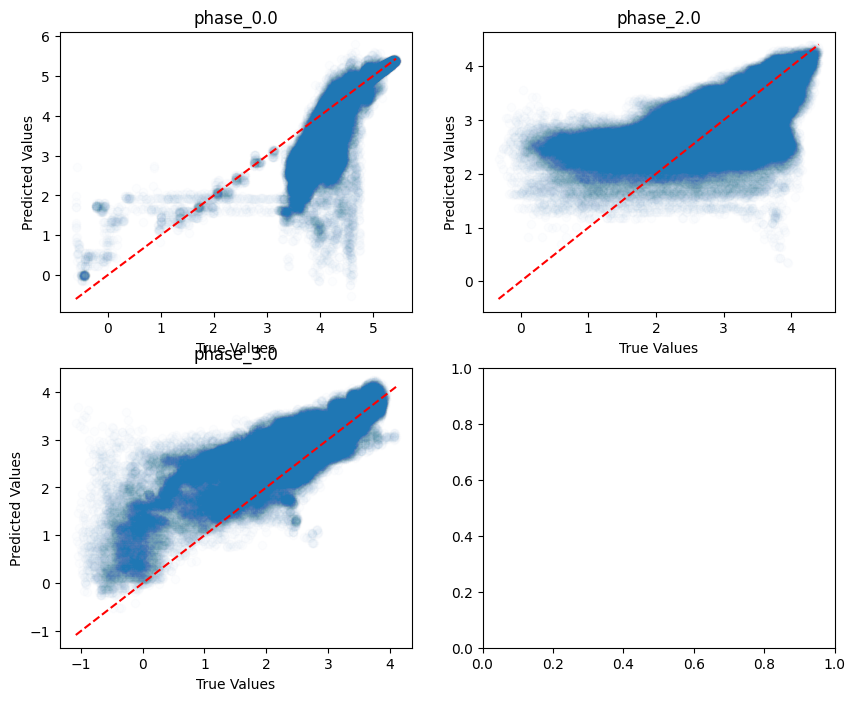

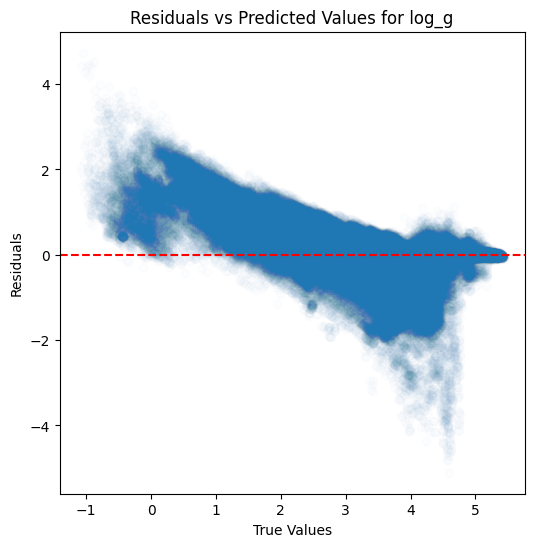

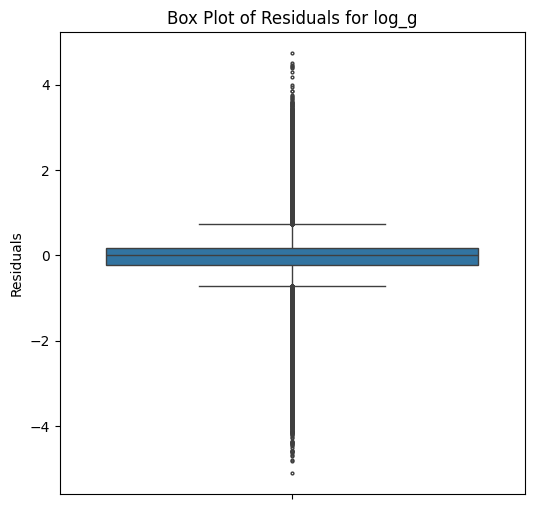

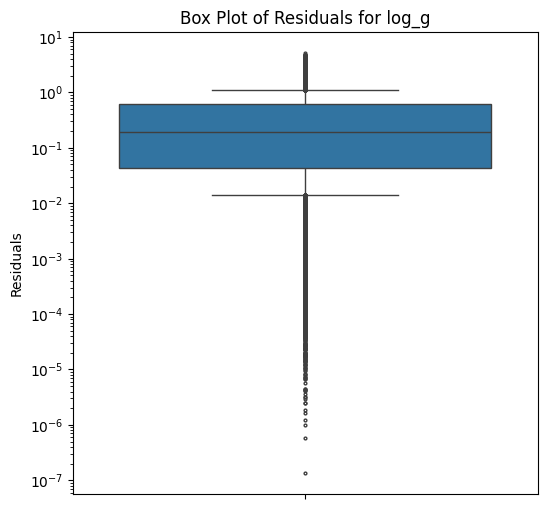

...

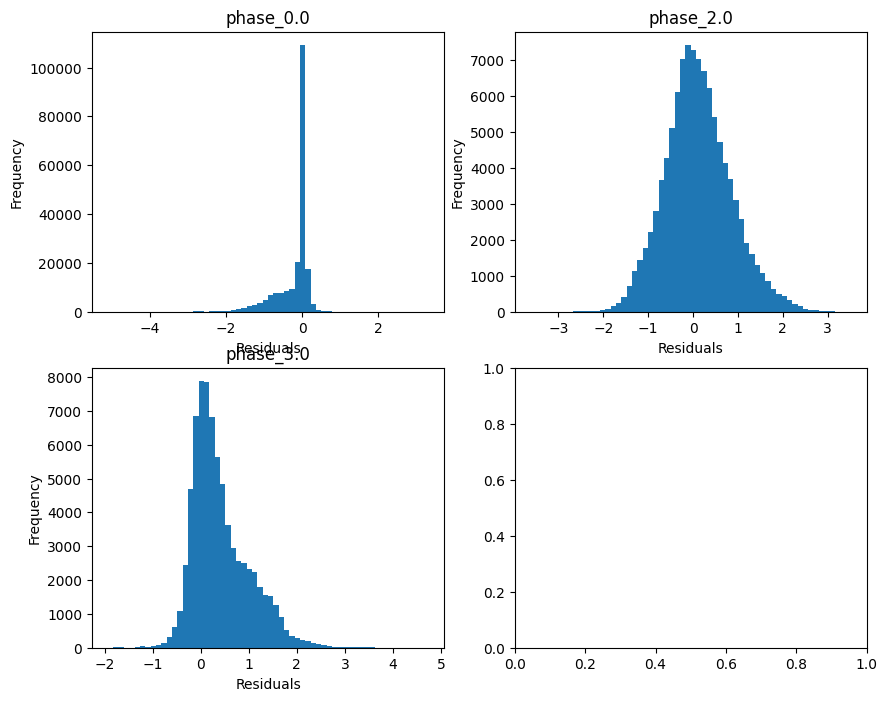

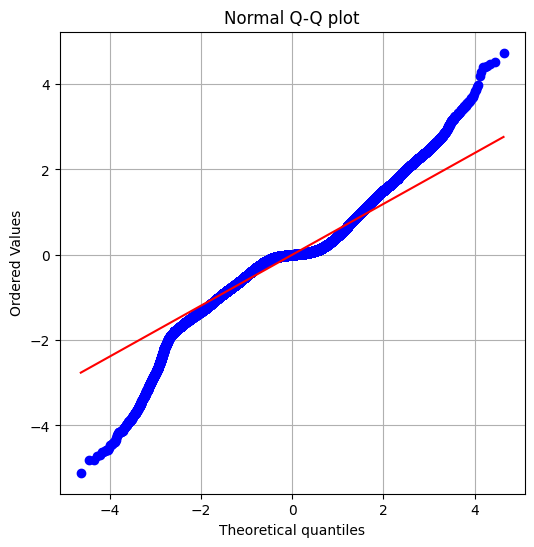

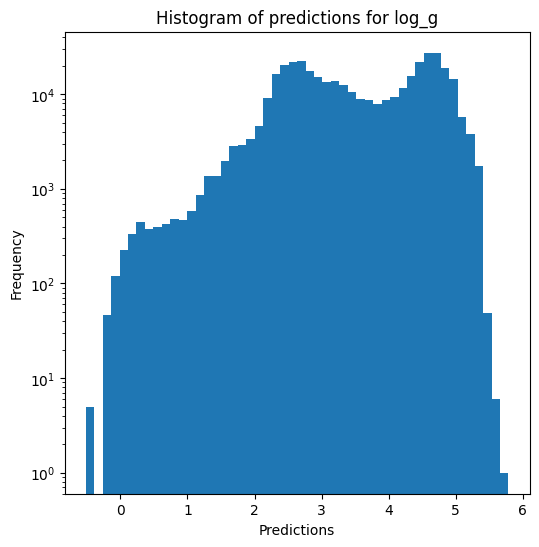

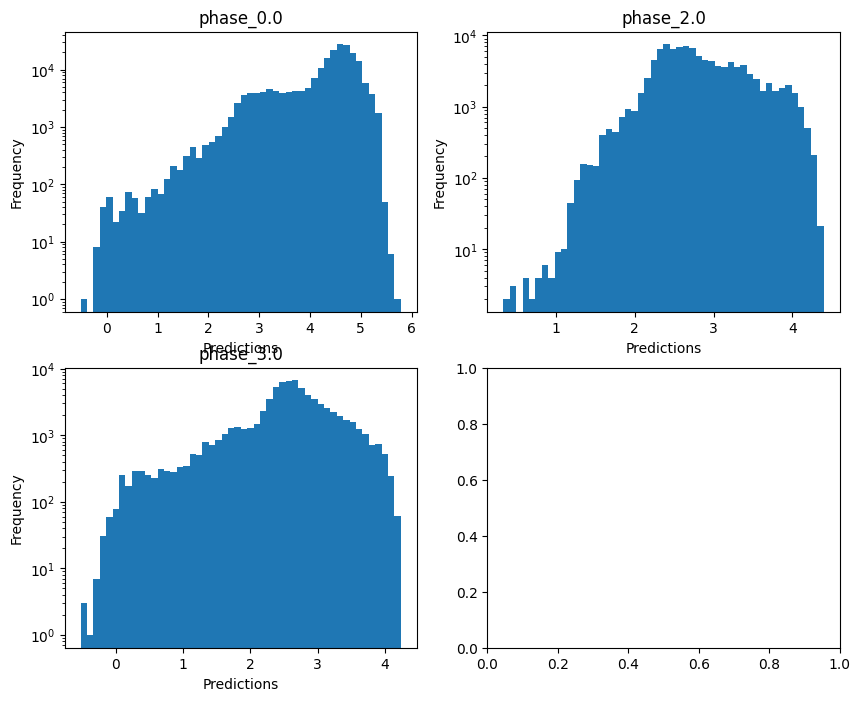

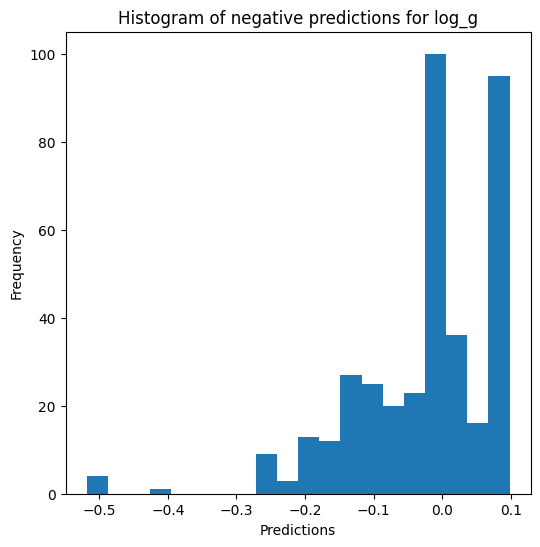


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.7099271347521621
  RMSE :  0.24942990292632158
  MAE :  0.1330339713662052
  MedAE :  0.034031928179684375
  CORR :  0.9153207777666716
  MAX_ER :  2.51226095101199
  Percentiles : 
    75th percentile :  0.16081215705737084
    90th percentile :  0.42724741408193606
    95th percentile :  0.586350586523282
    99th percentile :  0.8650150444410833

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.36492537289507976
  RMSE :  0.3755148955491926
  MAE :  0.2915255765886622
  MedAE :  0.2336359640651574
  CORR :  0.6049343858820293
  MAX_ER :  1.8723121600643486
  Percentiles : 
    75th percentile :  0.4182744821590282
    90th percentile :  0.6200235822729866
    95th percentile :  0.7539154141468963
    99th percentile :  1.0422407756141243

radius results for the phase category with a

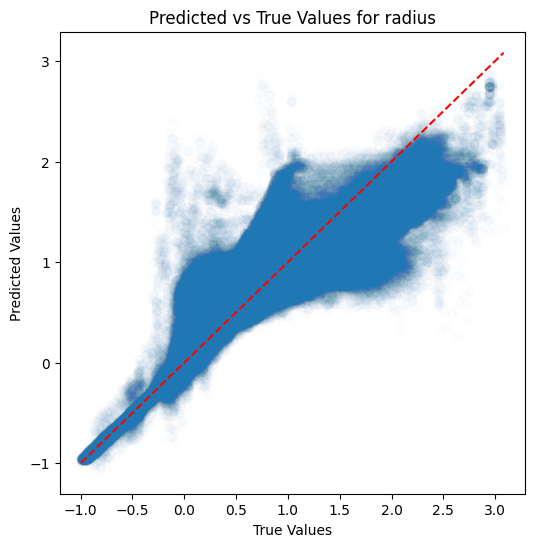

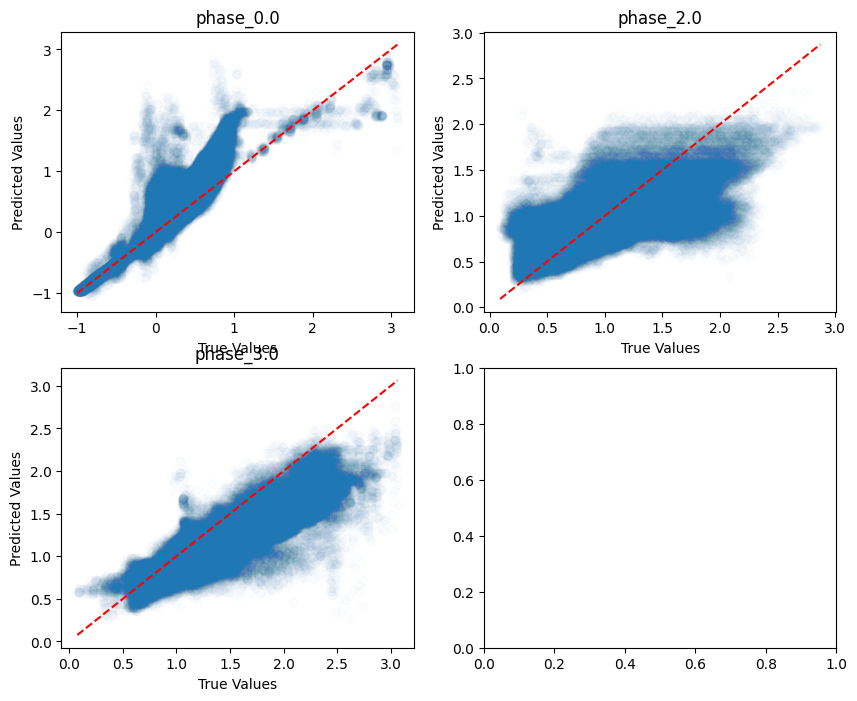

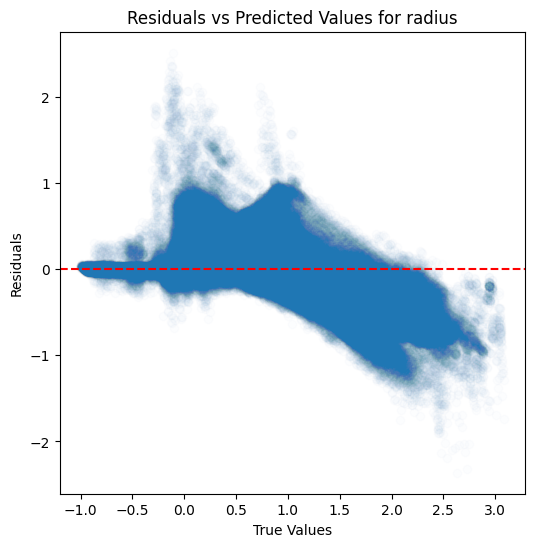

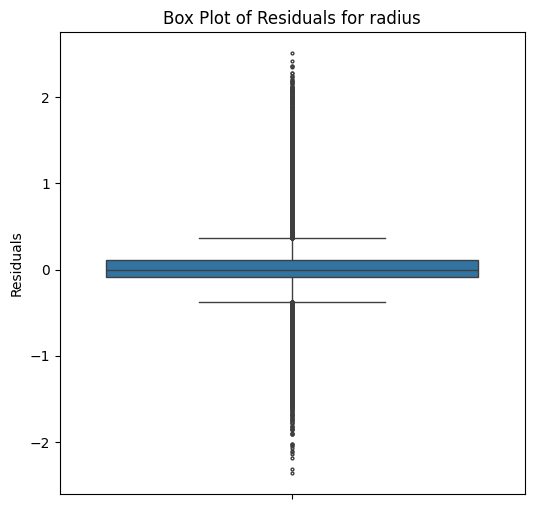

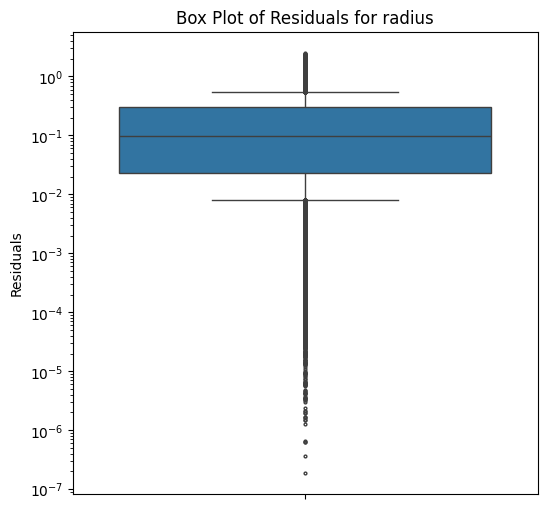

...

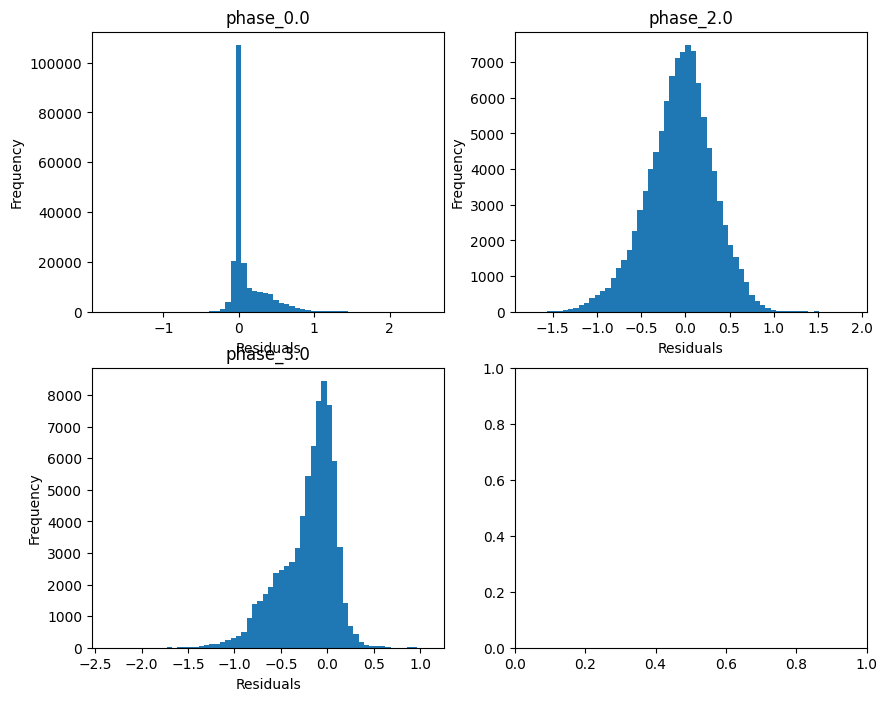

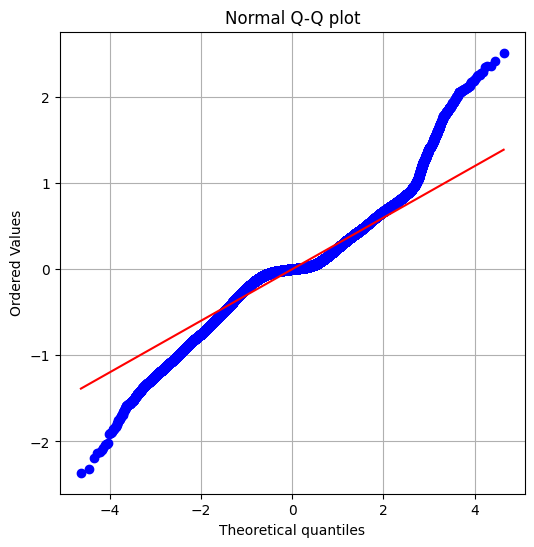

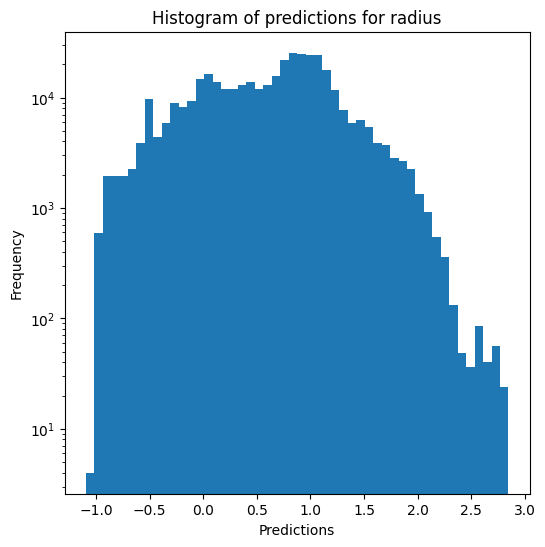

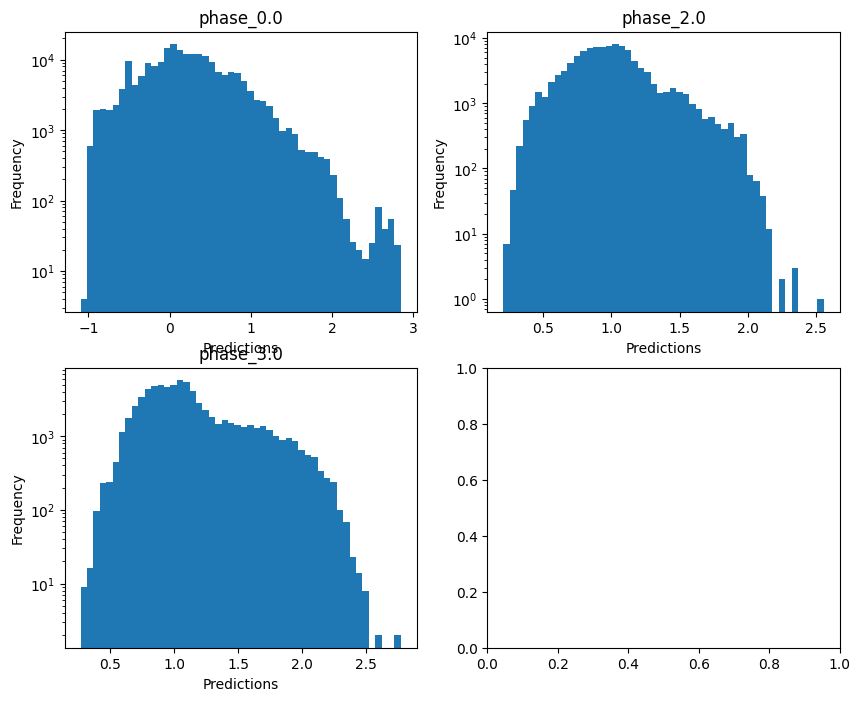

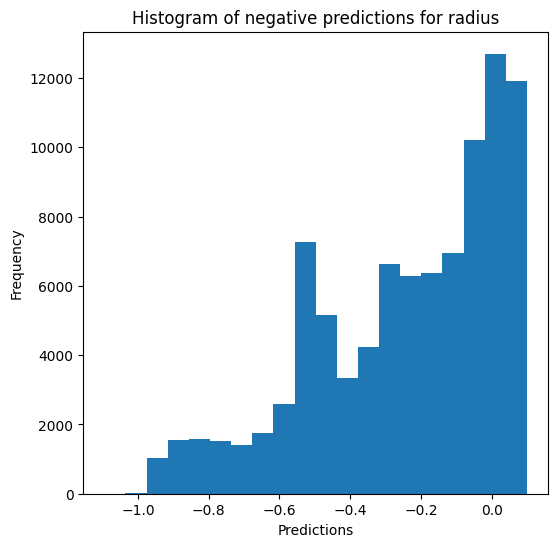

Saving predictions and results...


In [19]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)

### Multi-layer perceptron

In [20]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust_14 train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08259979558837896
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08042456617920206
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.0810191309714674
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07869598731335815
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08326465954215295

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9216609036859924
  RMSE :  0.08734383283127271
  MAE :  0.0512364144454953
  MedAE :  0.02980005737272151
  CORR :  0.9607035498574557
  MAX_ER :  0.722562438139625
  Percentiles : 
    75th percentile :  0.05629090289945893
    90th percentile :  0.10908198389931666
    95th percentile :  0.19133004290822148
    99th percentile :  0.3886922063450122

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.7711986029193421
  RMSE :  0.11816106704388893
  MAE :  0.08689283320907187
  MedAE :  0.06346381273680235
  CORR :  0.8784457072548961
  MAX_ER :  0.58802469121362
  Percentiles : 
    75th percentile :  0.11786134862566422
    90th percentile :  0.1962969582683457
    95th percentile :  0.25593082388857147
    99th percentile : 

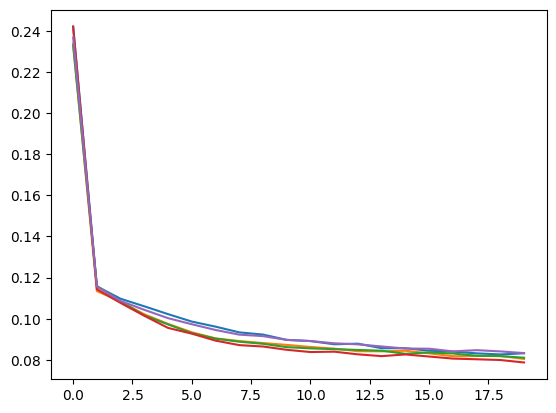

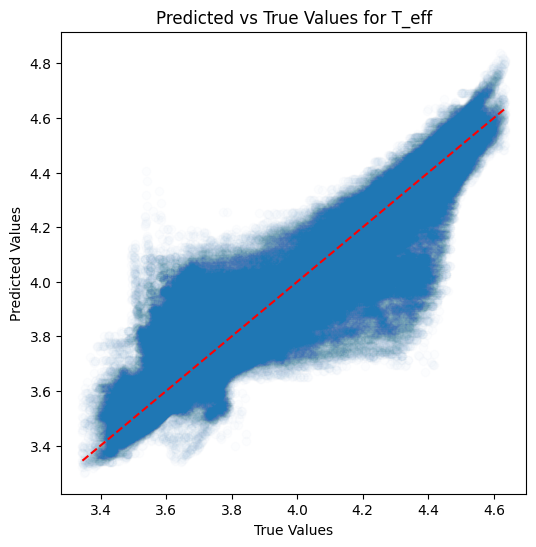

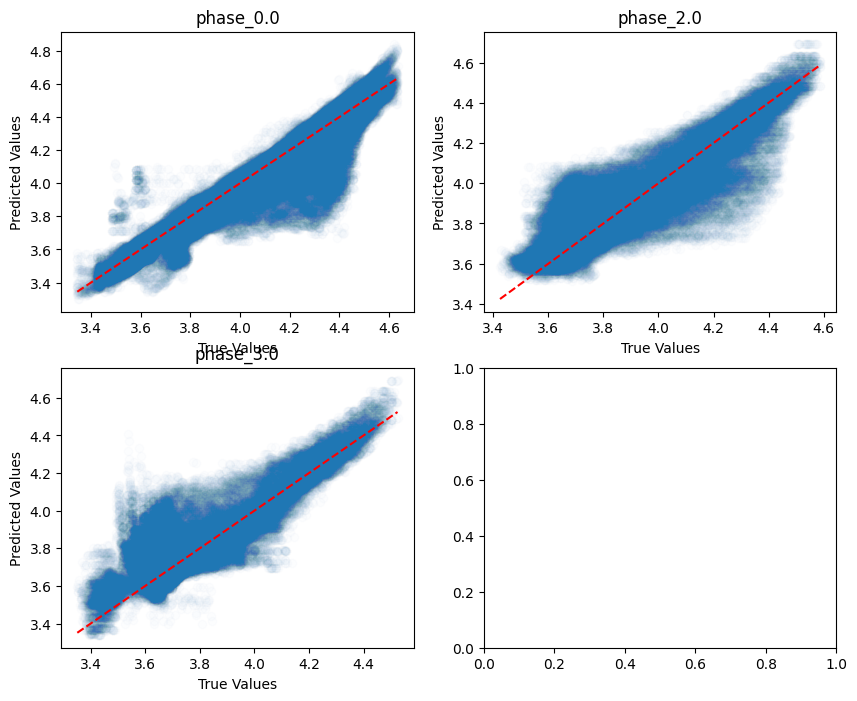

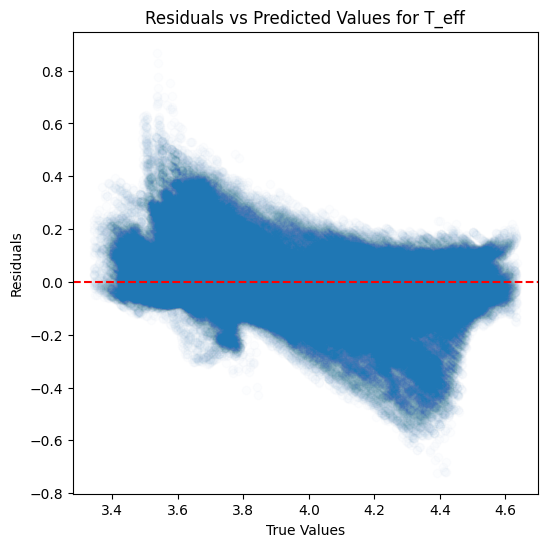

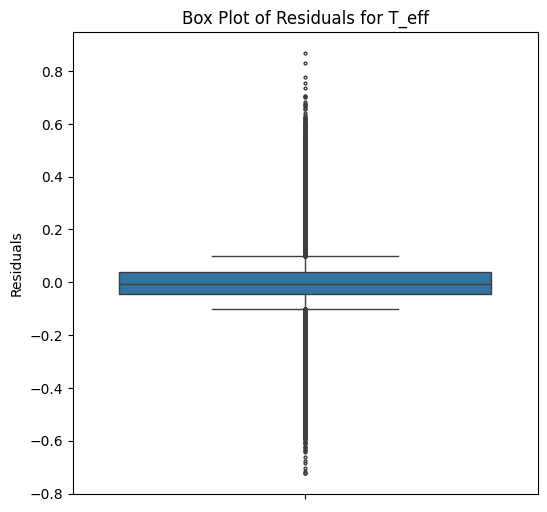

...

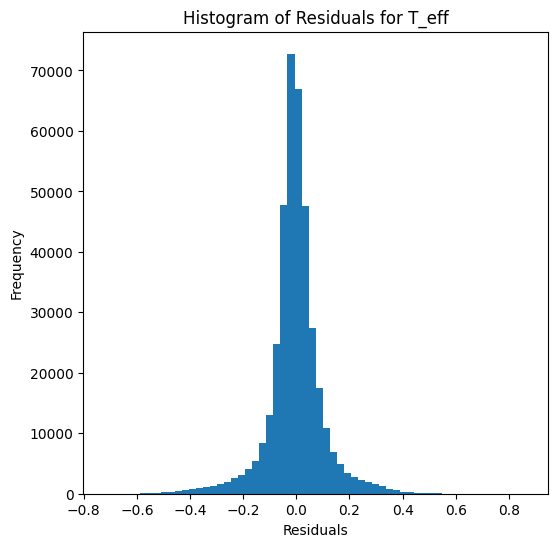

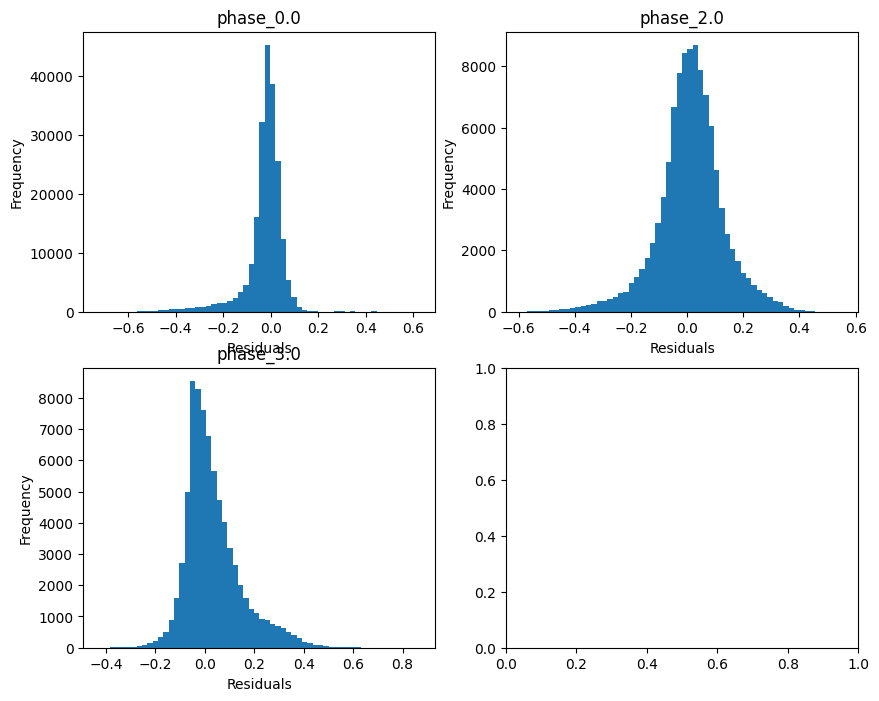

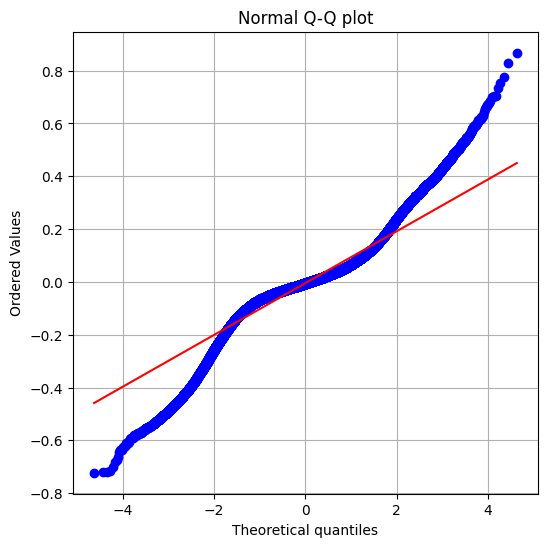

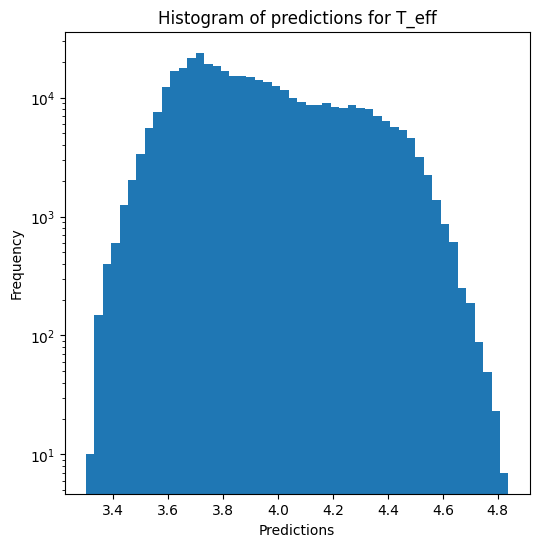

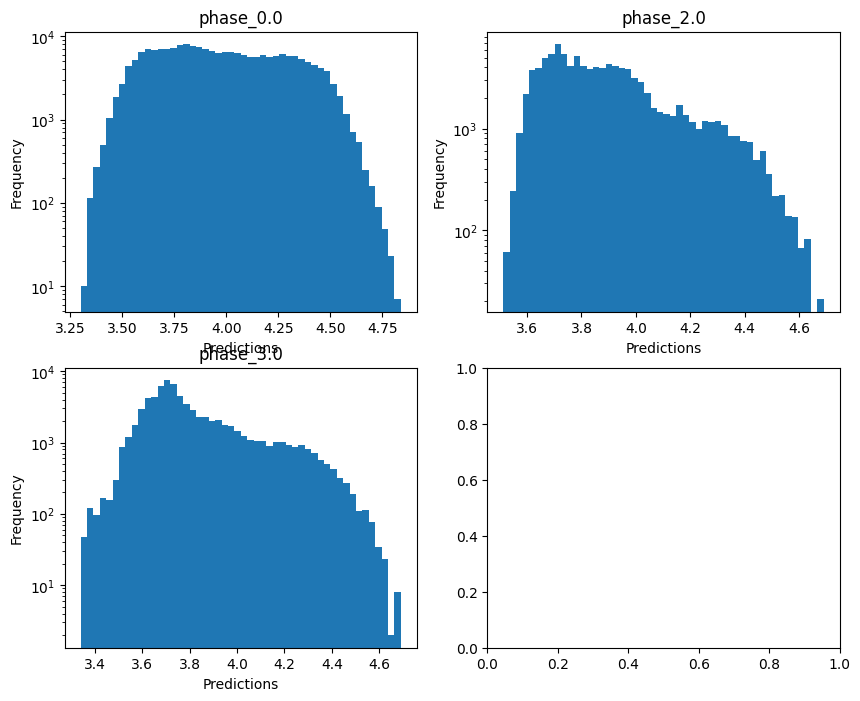


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -0.0014605019062359226
  RMSE :  0.4833008720584577
  MAE :  0.19584534802148593
  MedAE :  0.046170858906323886
  CORR :  0.7931810753533565
  MAX_ER :  4.359134878079999
  Percentiles : 
    75th percentile :  0.10181949839238857
    90th percentile :  0.5753824978605628
    95th percentile :  1.2510418086573494
    99th percentile :  2.0779574488305634

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.38884211374214406
  RMSE :  0.7254725054609114
  MAE :  0.5564907080845981
  MedAE :  0.4306069047945148
  CORR :  0.627182003193002
  MAX_ER :  3.071137267886021
  Percentiles : 
    75th percentile :  0.8042291927585394
    90th percentile :  1.2392384680471398
    95th percentile :  1.5052776107931993
    99th percentile :  1.9716838104515755

log_g results for the phase category with 

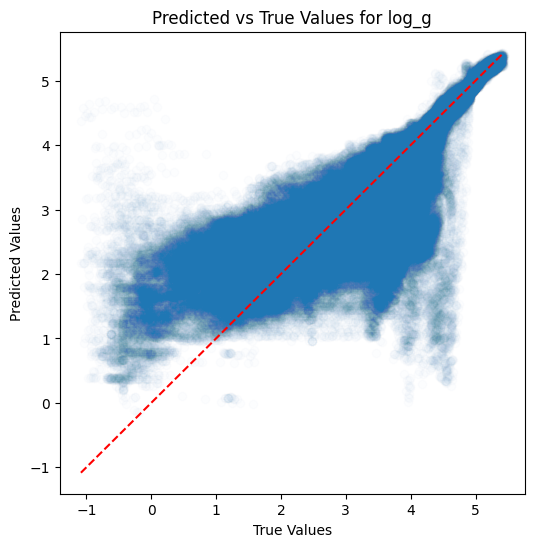

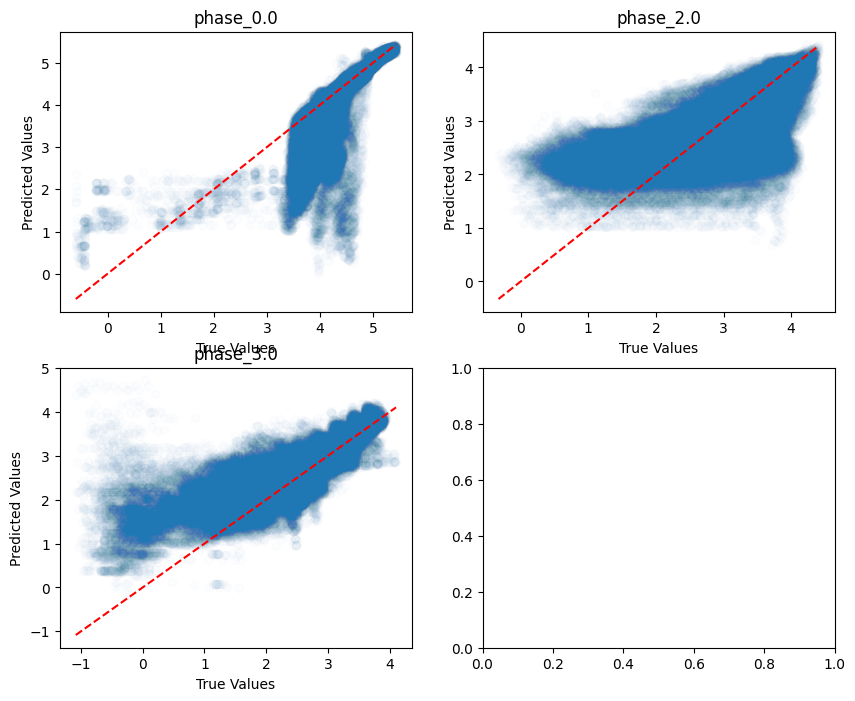

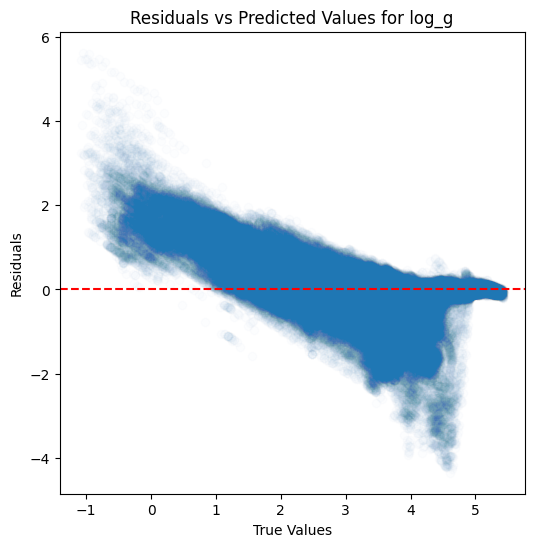

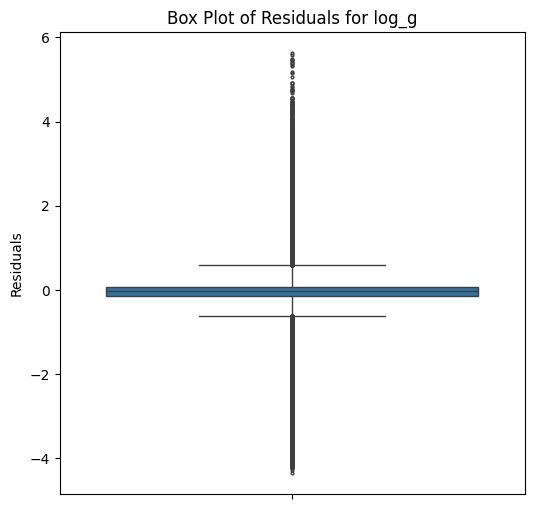

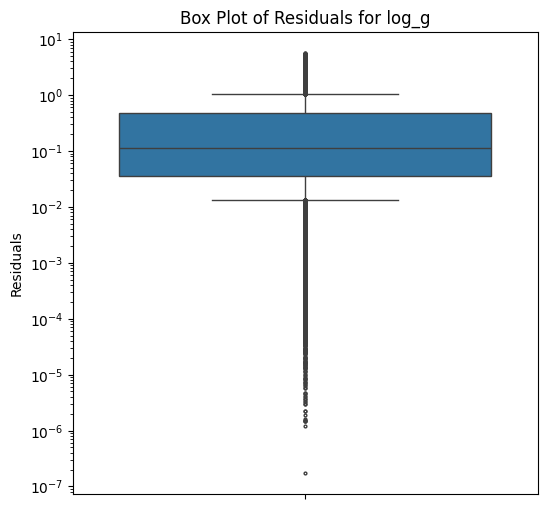

...

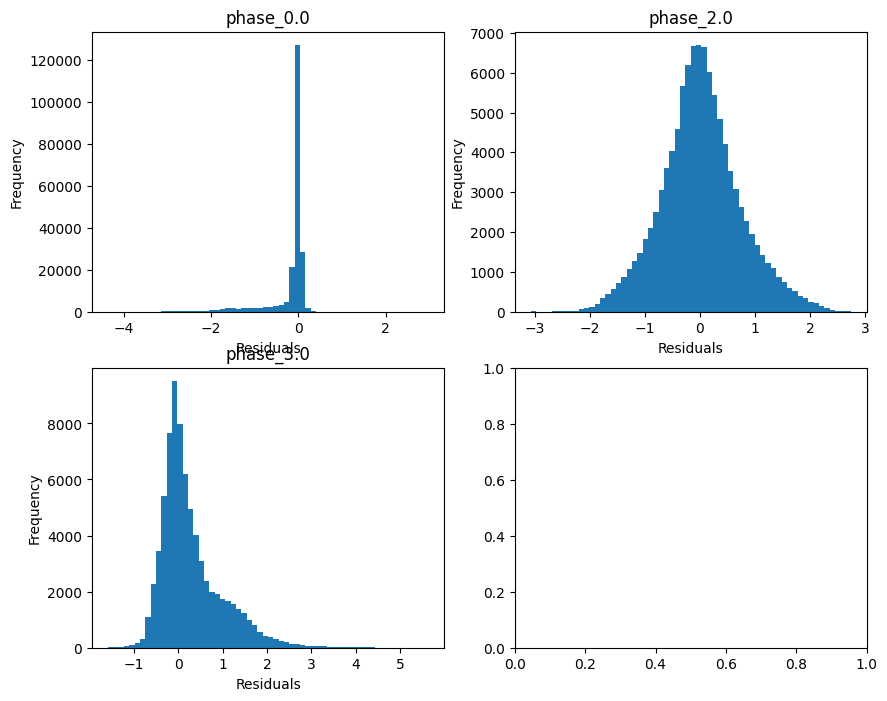

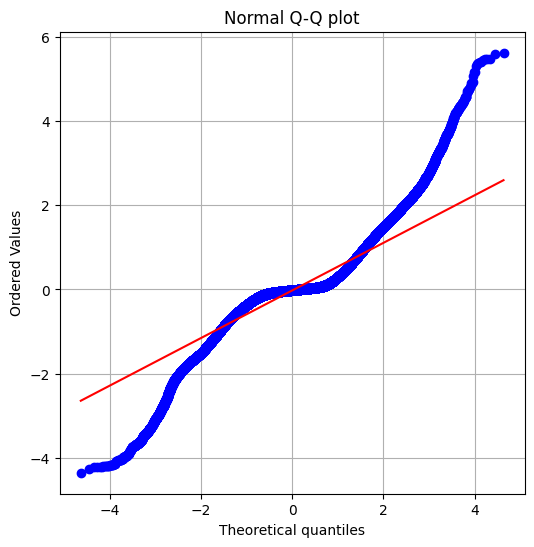

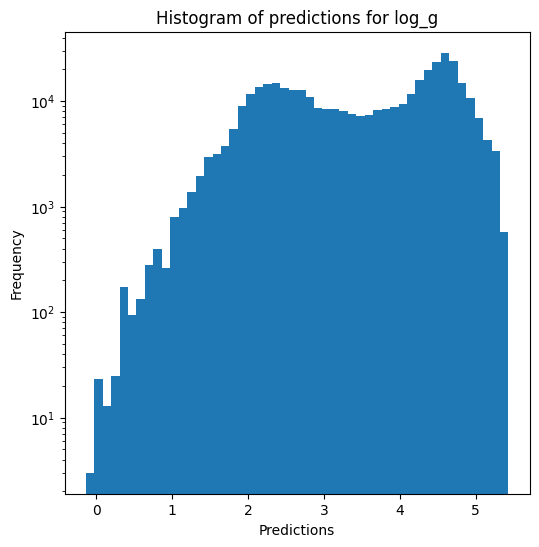

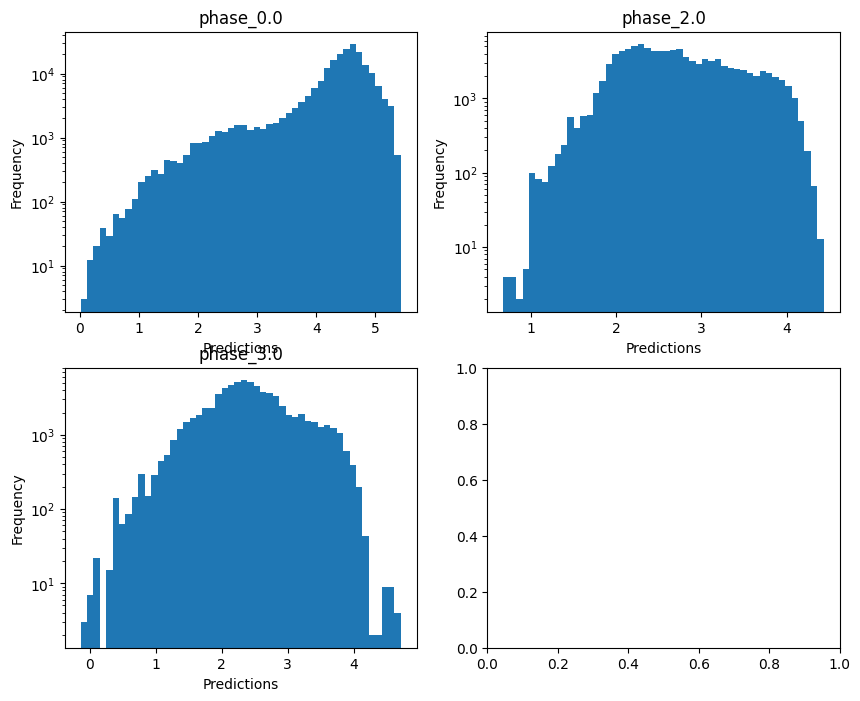

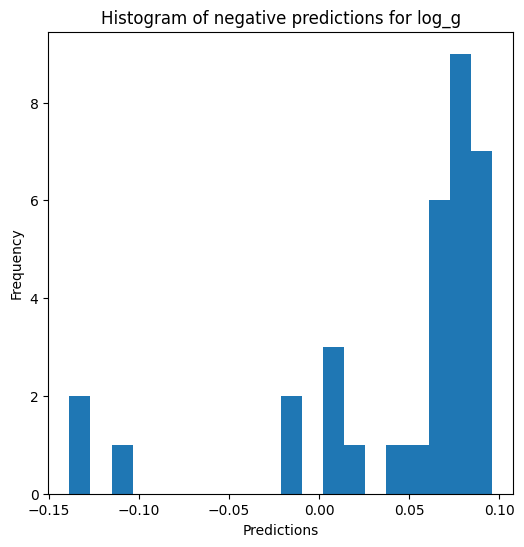


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.6994853166300972
  RMSE :  0.24608377581273447
  MAE :  0.10566479021083182
  MedAE :  0.03108442907820648
  CORR :  0.9021908336832445
  MAX_ER :  2.1609109797771975
  Percentiles : 
    75th percentile :  0.06785929929343329
    90th percentile :  0.29817614701378775
    95th percentile :  0.6353293313729749
    99th percentile :  1.0492214955539745

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.3829894401492593
  RMSE :  0.36548531618265345
  MAE :  0.2812450734905226
  MedAE :  0.21951518499635858
  CORR :  0.630498047872218
  MAX_ER :  1.5619059785244263
  Percentiles : 
    75th percentile :  0.4059033841410764
    90th percentile :  0.6236290924764191
    95th percentile :  0.7571101016146066
    99th percentile :  0.9873082659735628

radius results for the phase category wit

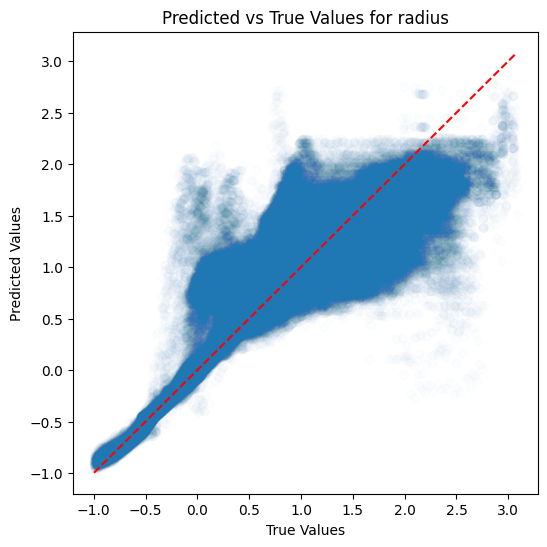

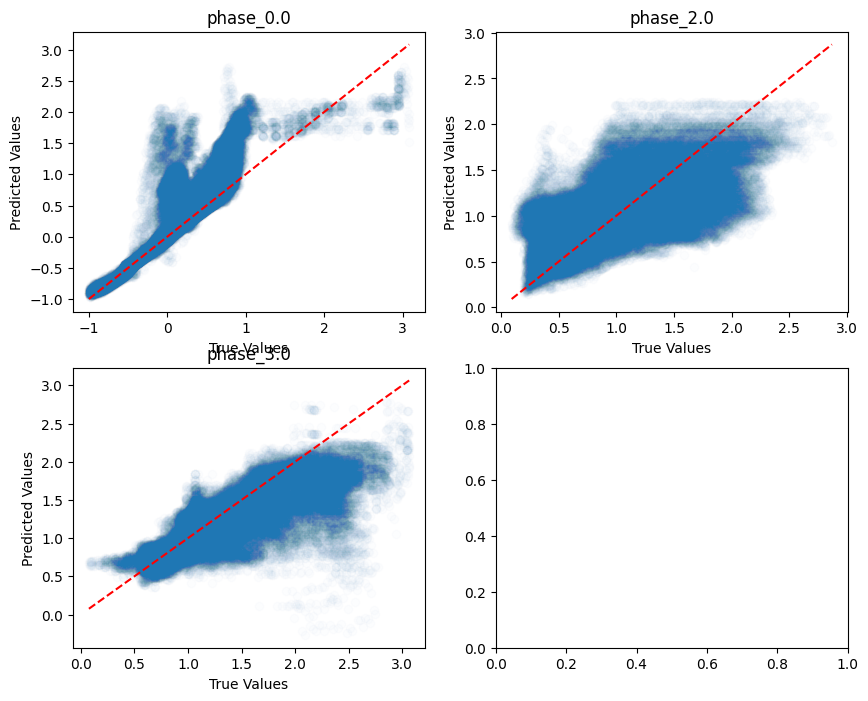

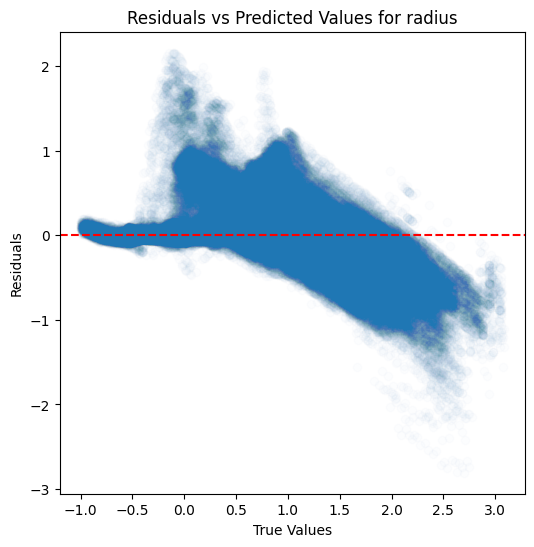

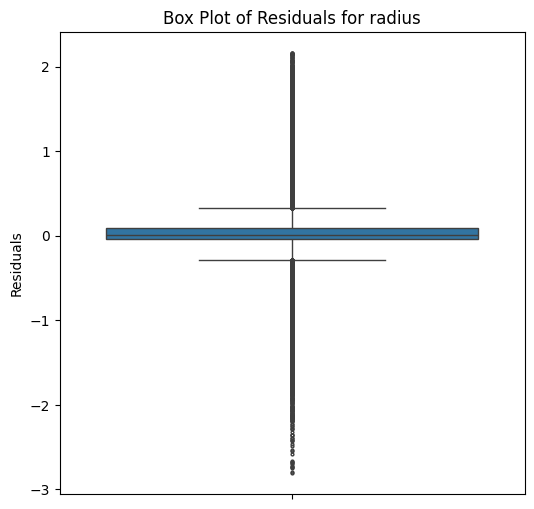

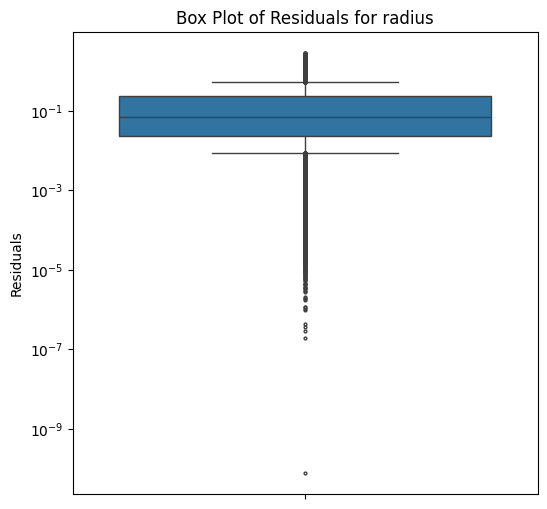

...

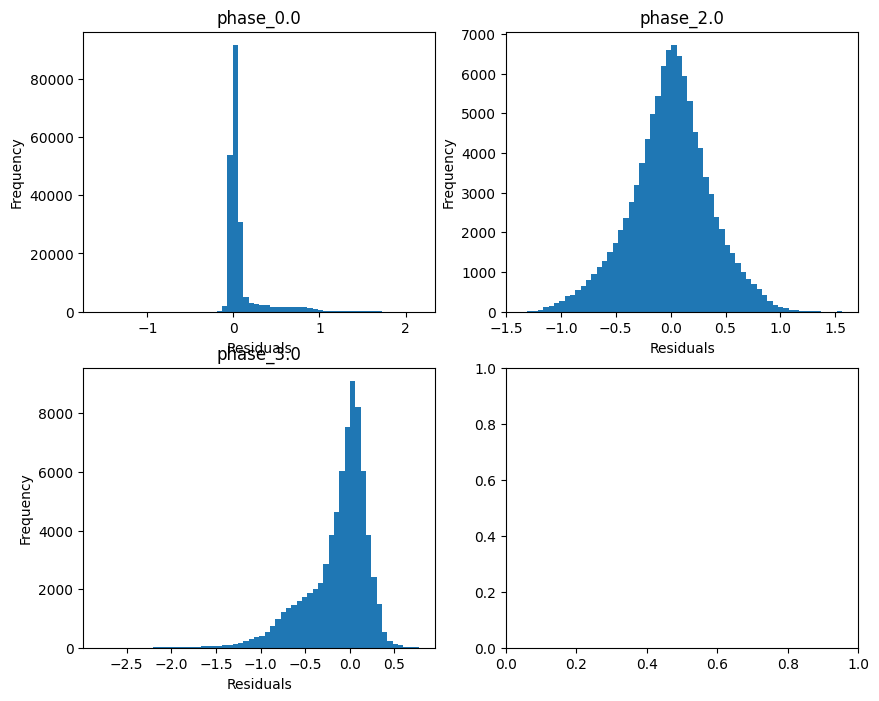

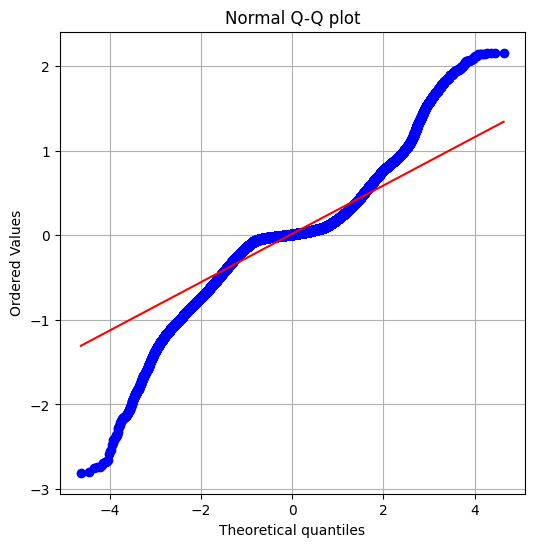

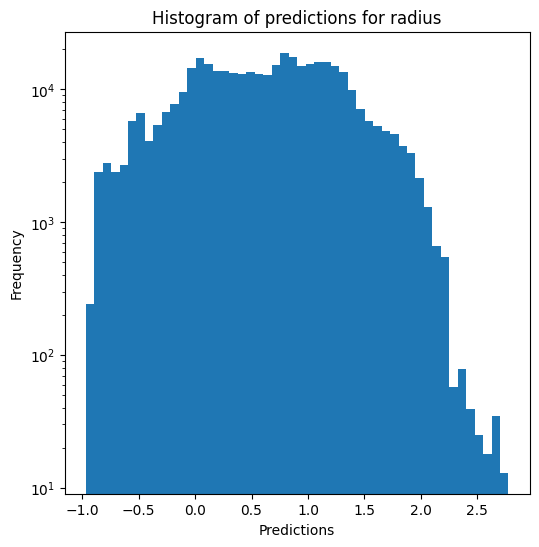

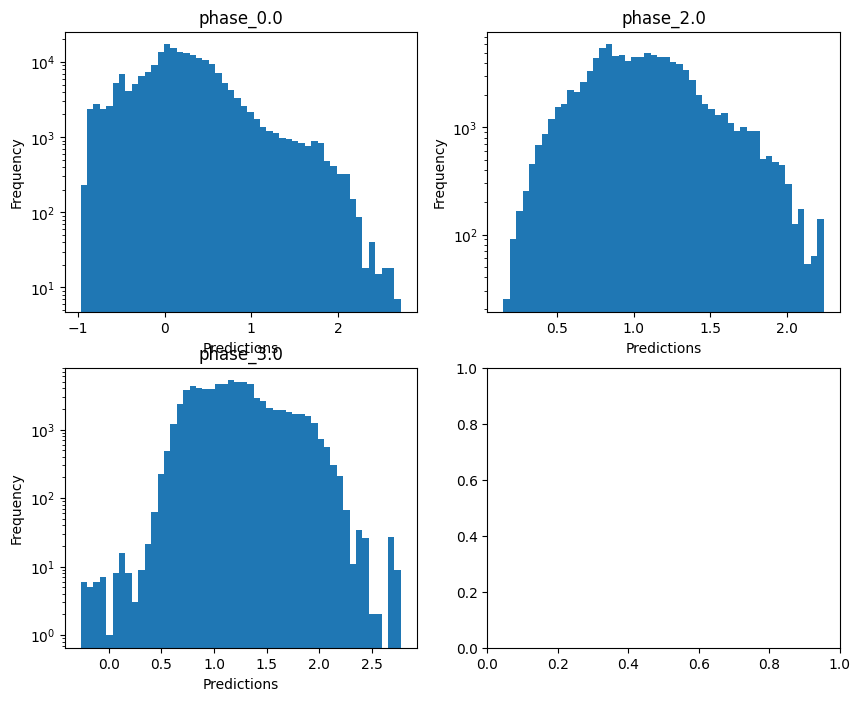

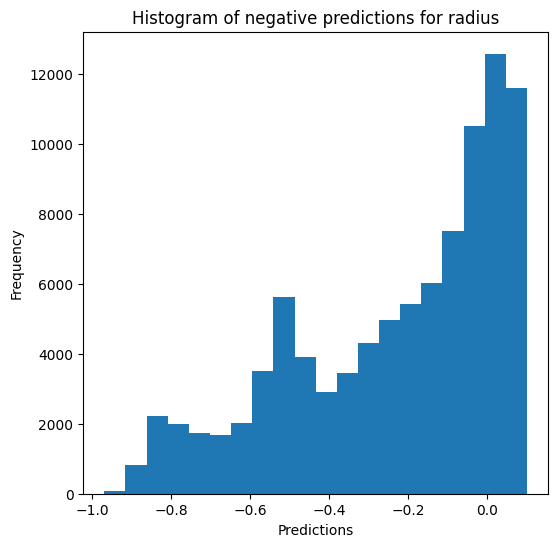

Saving predictions and results...


In [21]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon